# CloudWalk Technical Case: The Empathic Credit System (ECS)

## Background
CloudWalk has developed a groundbreaking Empathic Credit System (ECS) that uses real-time emotional and contextual data to offer personalized credit to users. This system has been integrated into CloudWalk's mobile app and has collected data from millions of customers. As a Data Analyst, your task is to analyze this rich dataset, extract meaningful insights, and provide recommendations to improve the system's effectiveness and fairness.

## The Data Analysis Challenge

### Dataset Overview
You have access to a SQLite database (`ecs_data.db`) containing the following tables:

## Table: users

| Column | Type |
|--------|------|
| user_id | TEXT |

## Table: emotional_data

| Column | Type |
|--------|------|
| user_id | TEXT |
| timestamp | TIMESTAMP |
| intensity | REAL |
| time_of_day | TEXT |
| primary_emotion | TEXT |
| relationship | TEXT |
| relationship_closeness | INTEGER |
| situation | TEXT |
| location | TEXT |
| weather | TEXT |
| physical_state | TEXT |
| preceding_event | TEXT |

## Table: loans

| Column | Type |
|--------|------|
| loan_id | INTEGER |
| user_id | TEXT |
| loan_amount | INTEGER |
| issue_date | TIMESTAMP |
| due_date | TIMESTAMP |
| loan_term | INTEGER |
| status | TEXT |
| paid_date | TIMESTAMP |
| interest_rate | REAL |
| total_amount | REAL |
| installment_amount | REAL |
| loan_amount_paid | REAL |

### Task Requirements

1. Data Exploration and Preprocessing:
   - Connect to the SQLite database and perform initial data exploration.
   - Handle any data quality issues.

2. Emotional Pattern Analysis:
   - Identify dominant emotional patterns for users over time.
   - Analyze how emotions correlate with different contexts (e.g., relationships, situations, time of day).

3. Loan-Emotion Correlation:
   - Analyze the relationship between emotional patterns and loan terms (amount, interest rate).
   - Identify which emotional factors have the strongest influence on loan results.

4. Lending Operation Assessment:
   - Evaluate the effectiveness of the lending policy (interest rates and loan amount) in terms of the default
   - Measure growth and profitability of the lending operation.
   - Analyze disbushment, loan performance, and revenue trends over time.

5. Data Visualization and Dashboard:
   - Create a comprehensive dashboard with key metrics and insights from your analysis.
   - Include visualizations that effectively communicate complex emotional patterns and their relationship to loan data.

#### [Optional] Reasoning

- Suggest refinements to the emotional data collection process.
- Propose improvements to the loan approval algorithm.
- Recommend strategies for personalizing credit offers based on emotional patterns.
- Discuss the ethical implications of using emotional data for credit decisions.

#### [Optional] Machine Learning

- Create a model to predict loan terms based on emotional and contextual data.
- Evaluate the model's performance and identify the most important features.

### Technical Requirements

1. Use SQL for data extraction from the SQLite database.
2. Use Python for data preprocessing, analysis, and any machine learning tasks.
3. Use appropriate data visualization libraries for your exploratory data analysis and final dashboard.
4. Provide clear documentation for your code and analysis process.

### Evaluation Criteria

Your solution will be evaluated based on:

1. Depth and quality of data analysis and exploration
2. Clarity and actionability of insights and recommendations
3. Quality of data visualizations and dashboard
4. Presentation skills and ability to communicate complex findings
5. Code quality, organization, and documentation
6. Bonus points for completing the Optional and Reasoning sections:
   - Candidates who address the tasks in the Optional and Reasoning sections will receive additional points.
   - These sections demonstrate advanced analytical skills and a deeper understanding of the ethical implications of the ECS.

## Submission Guidelines

1. Provide your solution in a GitHub repository, including all code, notebooks, and SQL scripts.
2. Include a README.md with setup instructions and any assumptions you made.
3. Submit your dashboard (or presentation tool) along with explanations of the visualizations.
4. Prepare a presentation (30 minutes) summarizing your approach, key findings, and recommendations.

## DISCLAIMER

The Empathic Credit Limit System (ECS) described in this case study is entirely fictional. This concept was created solely for the purpose of this exercise and does not represent any real-world technology or system. The idea of using emotional data for credit decisions is purely hypothetical and is meant to stimulate creative thinking and analysis within the context of this technical case.

Good luck!

## 0\. Import Libraries

In [12]:
import sqlite3
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy.stats import ks_2samp
import statsmodels.api as sm
import time
import numpy as np
from scipy.stats import kruskal
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

In [13]:
db_file_path = "/content/drive/MyDrive/Colab Notebooks/cloudwalk_technical_interview/case2.db"

## 1\. Data Exploration and Preprocessing
   - Connect to the SQLite database and perform initial data exploration.
   - Handle any data quality issues.

### 1.1 Connect to the SQLite database and perform initial data exploration.

In [6]:
# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)
cursor = conn.cursor()

In [ ]:
# Explore the 'users' table
cursor.execute("PRAGMA table_info(users)")
print("Users Table Schema:")
for row in cursor.fetchall():
  print(row)

cursor.execute("SELECT COUNT(*) FROM users")
print("\nNumber of users:", cursor.fetchone()[0])

Users Table Schema:
(0, 'user_id', 'INTEGER', 0, None, 1)
(1, 'score', 'REAL', 0, None, 0)
(2, 'approved_date', 'TEXT', 0, None, 0)
(3, 'denied_date', 'TEXT', 0, None, 0)
(4, 'credit_limit', 'INTEGER', 0, None, 0)
(5, 'interest_rate', 'REAL', 0, None, 0)
(6, 'loan_term', 'INTEGER', 0, None, 0)

Number of users: 734


In [ ]:
# Explore the 'emotional_data' table
cursor.execute("PRAGMA table_info(emotional_data)")
print("\nEmotional Data Table Schema:")
for row in cursor.fetchall():
  print(row)

cursor.execute("SELECT COUNT(*) FROM emotional_data")
print("\nNumber of emotional data entries:", cursor.fetchone()[0])


Emotional Data Table Schema:
(0, 'user_id', 'INTEGER', 0, None, 0)
(1, 'timestamp', 'TIMESTAMP', 0, None, 0)
(2, 'intensity', 'REAL', 0, None, 0)
(3, 'time_of_day', 'TEXT', 0, None, 0)
(4, 'primary_emotion', 'TEXT', 0, None, 0)
(5, 'relationship', 'TEXT', 0, None, 0)
(6, 'situation', 'TEXT', 0, None, 0)
(7, 'location', 'TEXT', 0, None, 0)
(8, 'weather', 'TEXT', 0, None, 0)
(9, 'physical_state', 'TEXT', 0, None, 0)
(10, 'preceding_event', 'TEXT', 0, None, 0)
(11, 'grade', 'REAL', 0, None, 0)

Number of emotional data entries: 2440948


In [ ]:
# Explore the 'loans' table
cursor.execute("PRAGMA table_info(loans)")
print("\nLoans Table Schema:")
for row in cursor.fetchall():
  print(row)

cursor.execute("SELECT COUNT(*) FROM loans")
print("\nNumber of loans:", cursor.fetchone()[0])


Loans Table Schema:
(0, 'loan_id', 'INTEGER', 0, None, 1)
(1, 'user_id', 'INTEGER', 0, None, 0)
(2, 'loan_amount', 'INTEGER', 0, None, 0)
(3, 'total_amount', 'REAL', 0, None, 0)
(4, 'issue_date', 'TIMESTAMP', 0, None, 0)
(5, 'due_date', 'TIMESTAMP', 0, None, 0)
(6, 'paid_date', 'TIMESTAMP', 0, None, 0)
(7, 'installment_amount', 'REAL', 0, None, 0)
(8, 'loan_amount_paid', 'REAL', 0, None, 0)
(9, 'status', 'TEXT', 0, None, 0)

Number of loans: 1188


In [ ]:
# Sample data from each table
cursor.execute("SELECT * FROM users LIMIT 5")
print("\nSample Users Data:")
for row in cursor.fetchall():
  print(row)

cursor.execute("SELECT * FROM emotional_data LIMIT 5")
print("\nSample Emotional Data:")
for row in cursor.fetchall():
  print(row)

cursor.execute("SELECT * FROM loans LIMIT 5")
print("\nSample Loans Data:")
for row in cursor.fetchall():
  print(row)


Sample Users Data:
(1, 5.69, '2020-05-21', None, 32700, 0.05, 12)
(2, None, None, None, None, None, None)
(3, 5.61, '2023-12-04', '2025-04-26', 9500, 0.09, 6)
(4, 5.64, '2020-05-14', None, 1800, 0.11, 3)
(5, 5.64, '2021-04-29', None, 1700, 0.11, 3)

Sample Emotional Data:
(1, '2019-04-07 22:50:39', 4.0, 'night', 'anticipation', None, 'cooking', None, 'cloudy', 'energetic', 'criticism', 3.72)
(1, '2019-04-07 14:02:53', 9.0, 'afternoon', 'boredom', 'parent', 'volunteering', 'home', 'snowy', None, 'good news', 4.79)
(1, '2019-04-07 03:16:21', 7.0, 'night', 'shame', 'neighbor', 'in meeting', 'work', 'sunny', 'tired', None, 2.94)
(1, '2019-04-08 17:10:35', 5.0, 'evening', 'joy', 'stranger', 'argument', None, 'windy', 'rested', 'compliment', 5.35)
(1, '2019-04-08 16:12:02', 1.0, 'afternoon', 'joy', 'child', 'clothes shopping', None, 'sunny', None, 'surprise', 2.97)

Sample Loans Data:
(1, 1, 29955, 47928.0, '2021-06-14', '2022-06-09', '2021-10-05', 3994.0, 35596.53, 'paid')
(2, 1, 15473, 24

In [ ]:
start_time = time.time()  # Start timing

# Get descriptive statistics for tables

def get_table_statistics(table_name):
  """Gets descriptive statistics for a given table."""
  df = pd.read_sql_query(f"SELECT * FROM {table_name}", conn)
  print(f"\nDescriptive Statistics for {table_name}:")
  print(df.describe(include='all'))

# Calculate statistics for each table
get_table_statistics("users")
get_table_statistics("emotional_data")
get_table_statistics("loans")

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


Descriptive Statistics for users:
           user_id       score approved_date denied_date  credit_limit  \
count   734.000000  667.000000           667         178    667.000000   
unique         NaN         NaN           533         165           NaN   
top            NaN         NaN    2020-01-27  2024-05-24           NaN   
freq           NaN         NaN             5           3           NaN   
mean    367.500000    5.668486           NaN         NaN  13645.727136   
std     212.031837    0.062003           NaN         NaN  14883.705105   
min       1.000000    5.600000           NaN         NaN   1000.000000   
25%     184.250000    5.620000           NaN         NaN   2200.000000   
50%     367.500000    5.650000           NaN         NaN   5900.000000   
75%     550.750000    5.700000           NaN         NaN  23550.000000   
max     734.000000    6.110000           NaN         NaN  49800.000000   

        interest_rate   loan_term  
count      667.000000  667.000000  
uniq


Analyzing loan_id in loans


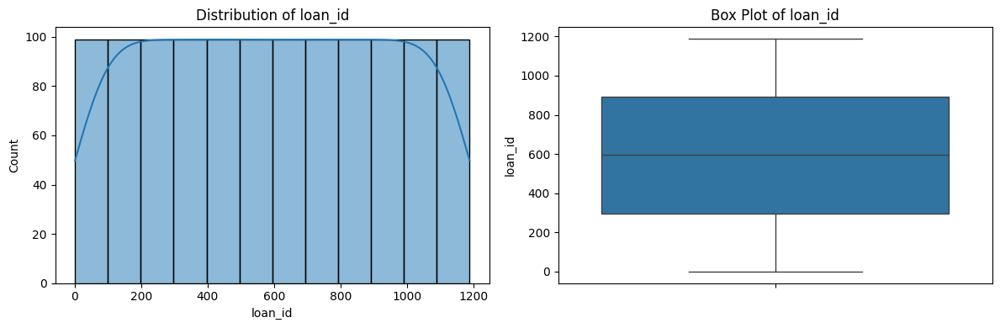


Analyzing user_id in loans


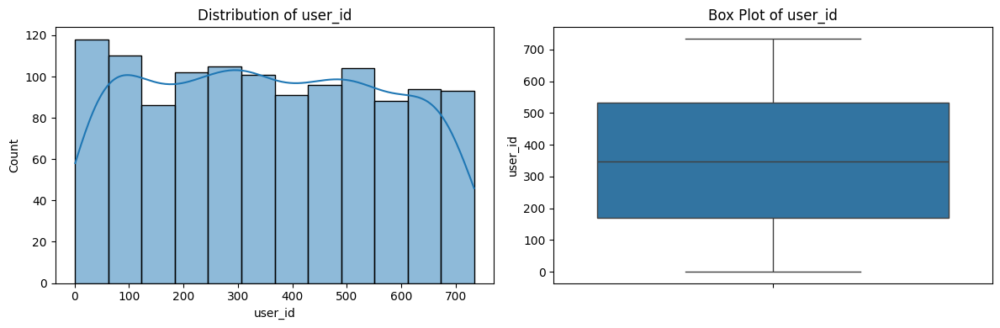


Analyzing loan_amount in loans


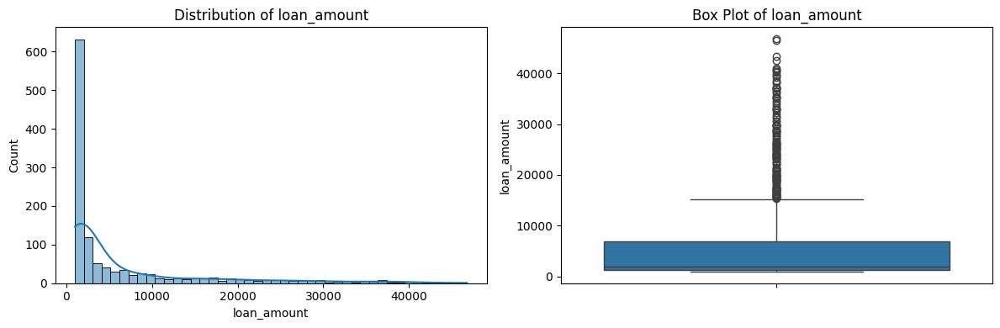


Analyzing total_amount in loans


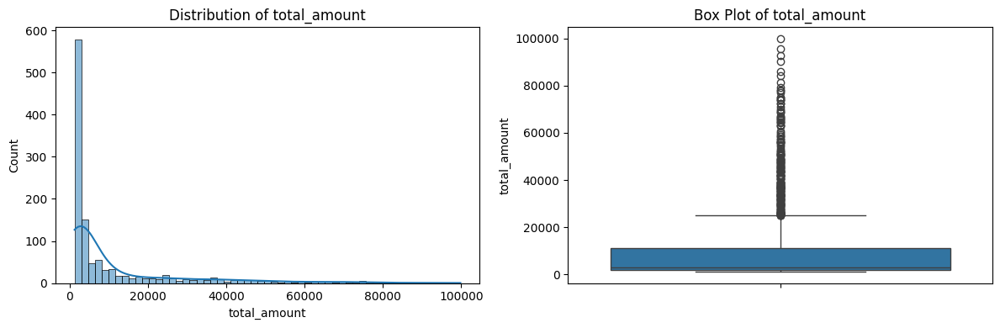


Analyzing installment_amount in loans


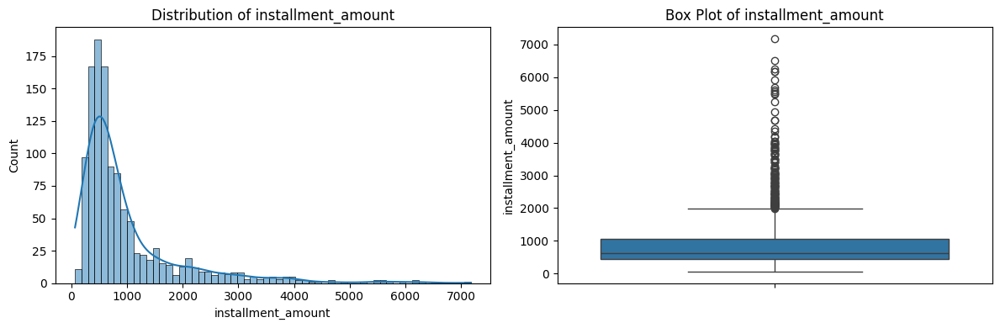


Analyzing loan_amount_paid in loans


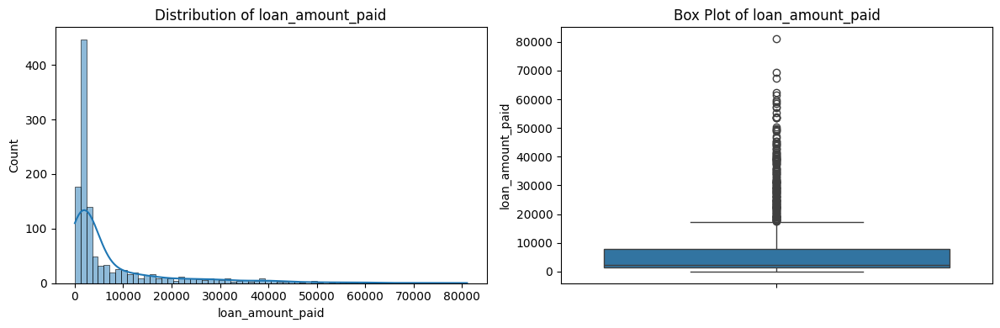


Analyzing user_id in users


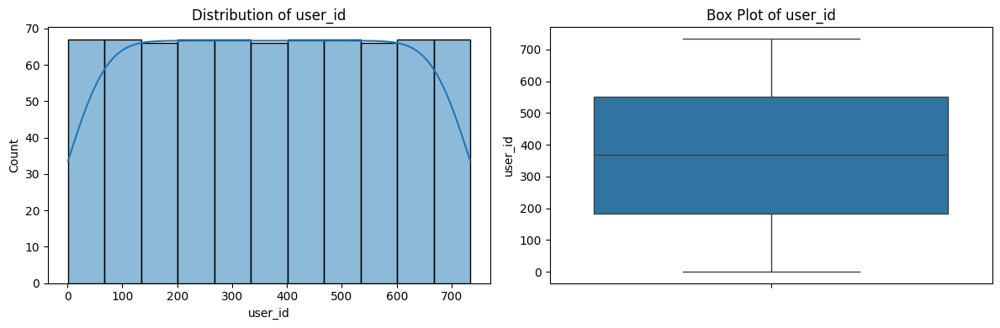


Analyzing score in users


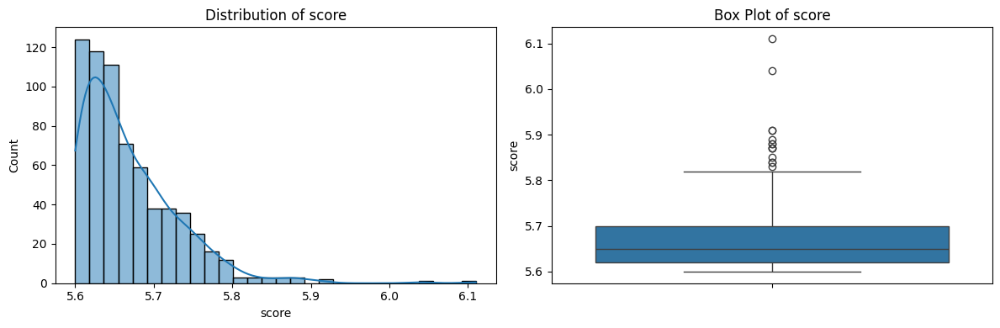


Analyzing credit_limit in users


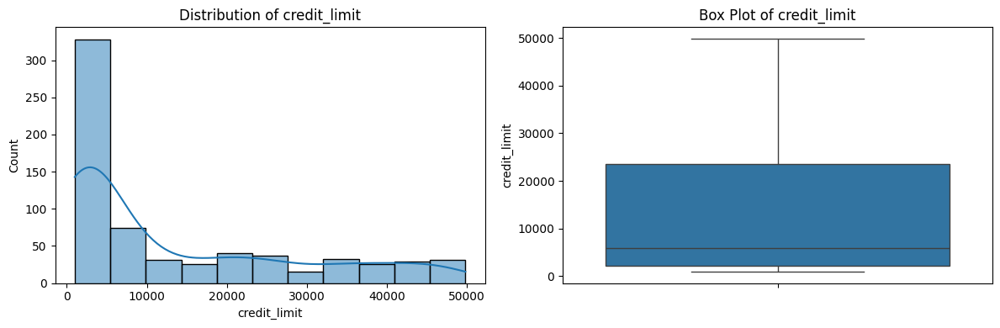


Analyzing interest_rate in users


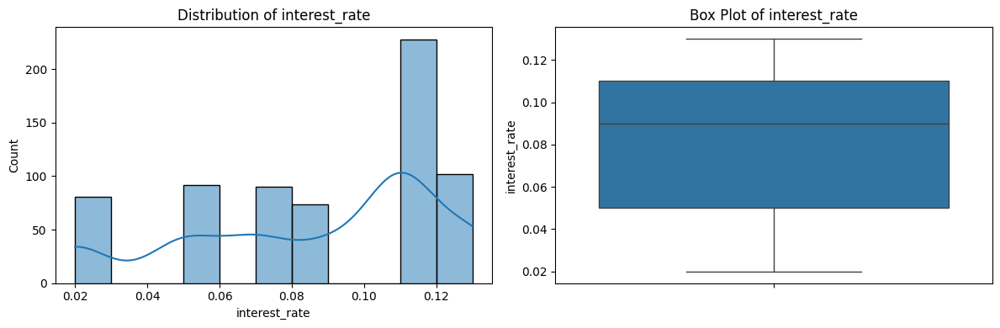


Analyzing loan_term in users


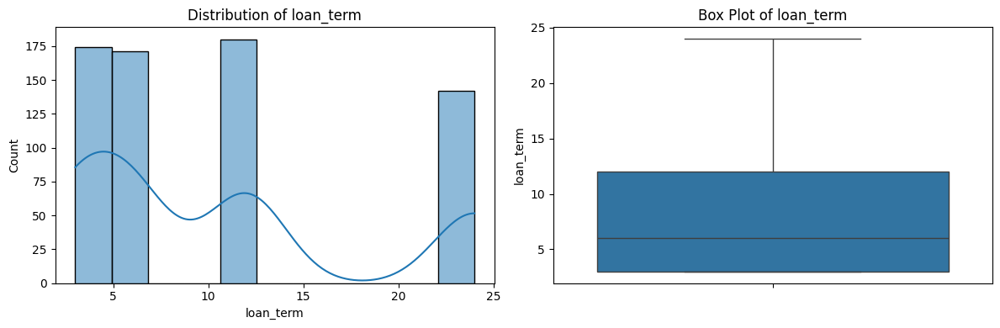


Analyzing user_id in emotional_data


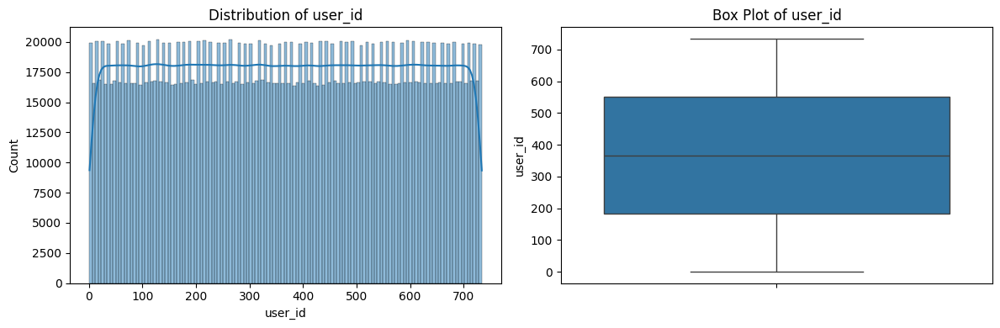


Analyzing intensity in emotional_data


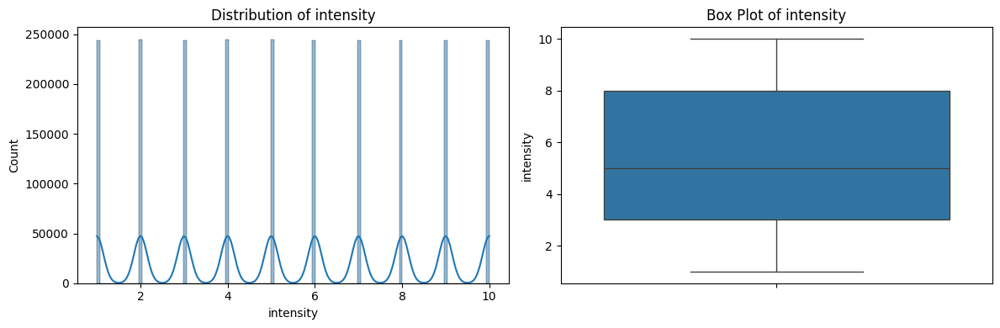


Analyzing grade in emotional_data


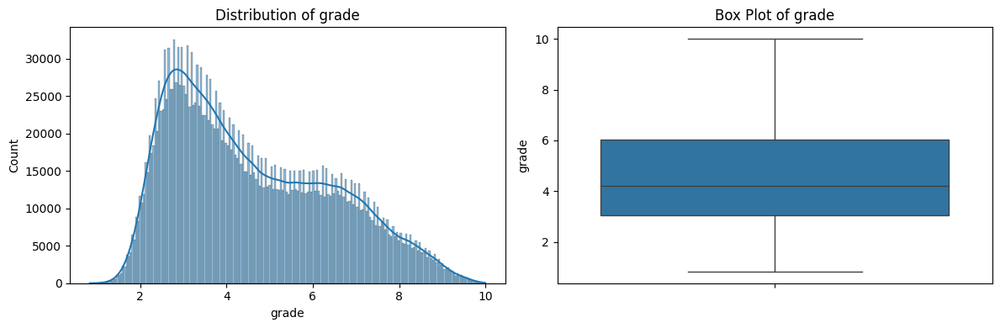


Cell execution took 76.1287 seconds.


In [8]:
start_time = time.time()  # Start timing

def plot_distribution_and_boxplot(df, column_name):
  """Plots the distribution and box plot of a numerical column."""

  plt.figure(figsize=(12, 4))

  # Distribution plot
  plt.subplot(1, 2, 1)
  sns.histplot(df[column_name], kde=True)
  plt.title(f"Distribution of {column_name}")

  # Box plot
  plt.subplot(1, 2, 2)
  sns.boxplot(y=df[column_name])
  plt.title(f"Box Plot of {column_name}")

  plt.tight_layout()
  plt.show()


def analyze_numerical_columns(table_name):
  """Analyzes and plots the numerical columns of a table."""

  df = pd.read_sql_query(f"SELECT * FROM {table_name}", conn)
  numerical_columns = df.select_dtypes(include=['number']).columns

  for column_name in numerical_columns:
    print(f"\nAnalyzing {column_name} in {table_name}")
    plot_distribution_and_boxplot(df, column_name)


# Analyze each table
analyze_numerical_columns("loans")
analyze_numerical_columns("users")
analyze_numerical_columns("emotional_data")

elapsed_time = time.time() - start_time
print(f"\nCell execution took {elapsed_time:.4f} seconds.")

### 1.2 Handle any data quality issues.

In [ ]:
start_time = time.time()  # Start timing

# Check for missing values in each table
def check_missing_values(table_name):
  """Checks for missing values in a table."""
  df = pd.read_sql_query(f"SELECT * FROM {table_name}", conn)
  missing_values = df.isnull().sum()
  if missing_values.sum() > 0:
    print(f"\nMissing values found in {table_name}:")
    print(missing_values)
  else:
    print(f"\nNo missing values found in {table_name}.")

check_missing_values("users")
check_missing_values("emotional_data")
check_missing_values("loans")

elapsed_time = time.time() - start_time
print(f"\nCell execution took {elapsed_time:.4f} seconds.")


Missing values found in users:
user_id            0
score             67
approved_date     67
denied_date      556
credit_limit      67
interest_rate     67
loan_term         67
dtype: int64

Missing values found in emotional_data:
user_id                 0
timestamp               0
intensity               0
time_of_day             0
primary_emotion         0
relationship       561367
situation          560784
location           560021
weather            559959
physical_state     562260
preceding_event    561935
grade                   0
dtype: int64

Missing values found in loans:
loan_id                 0
user_id                 0
loan_amount             0
total_amount            0
issue_date              0
due_date                0
paid_date             241
installment_amount      0
loan_amount_paid        0
status                  0
dtype: int64

Cell execution took 18.3511 seconds.


Missing values are consistent on user's database, since the number of missing values for credit_limit is the same for loan_term, interest_rate, and approved_date, probably because these users haven't gone through credit analysis yet. The missing values in denied date indicate that these users haven't been denied credit so far.

On the loans database, there are only missing values in paid_date, which is expected behaviour.

On the emotional_data database, however, there are 6 columns with over 500,000 empty values, which is concerning since it is not clear why those values are missing, and they could introduce bias to the analysis.

In [ ]:
start_time = time.time()  # Start timing

# Check for duplicate records in each table
def check_duplicates(table_name, key_columns):
    """Checks for duplicate records in a table based on specified key columns."""
    # Construct the SQL query to find duplicate records
    conn = sqlite3.connect(db_file_path)
    cursor = conn.cursor()
    query = f"""
    SELECT {', '.join(key_columns)}, COUNT(*)
    FROM {table_name}
    GROUP BY {', '.join(key_columns)}
    HAVING COUNT(*) > 1
    """
    cursor.execute(query)
    duplicates = cursor.fetchall()

    if duplicates:
        print(f"\nDuplicate records found in {table_name}:")
        for row in duplicates:
            print(row)
    else:
        print(f"\nNo duplicate records found in {table_name}.")


check_duplicates("users", ["user_id"])
check_duplicates("loans", ["loan_id"])
check_duplicates("emotional_data", ['user_id', 'timestamp', 'intensity',
                 'time_of_day', 'primary_emotion', 'relationship', 'situation',
                 'location', 'weather',  'physical_state',  'preceding_event'])

elapsed_time = time.time() - start_time
print(f"\nCell execution took {elapsed_time:.4f} seconds.")


No duplicate records found in users.

No duplicate records found in loans.

No duplicate records found in emotional_data.

Cell execution took 17.7792 seconds.



## 2\. Emotional Pattern Analysis
   - Identify dominant emotional patterns for users over time.
   - Analyze how emotions correlate with different contexts (e.g., relationships, situations, time of day).


### 2.1 Identify dominant emotional patterns for users over time.

In [ ]:
start_time = time.time()  # Start timing

# Fetch emotional data from the database
query = """
SELECT
  strftime('%Y-%m', timestamp) AS month,
  primary_emotion,
  COUNT(*) AS emotion_count
FROM emotional_data
GROUP BY
  month, primary_emotion
ORDER BY
  month, emotion_count DESC;
"""

df_emotion_counts = pd.read_sql_query(query, conn)

# Group by month and emotion to get counts for each emotion in each month
monthly_emotion_counts = df_emotion_counts.groupby(['month', 'primary_emotion'])['emotion_count'].sum().unstack()

# Create bar charts for each month
for month, emotion_counts in monthly_emotion_counts.iterrows():
    plt.figure(figsize=(10, 6))
    emotion_counts.plot(kind='bar')
    plt.title(f'Dominant Emotional Patterns for Month: {month}')
    plt.xlabel('Emotion')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')

    # Add data labels above the bars
    for i, count in enumerate(emotion_counts):
      plt.text(i, count, str(count), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")

Output hidden; open in https://colab.research.google.com to view.

It is possible to observe that emotions frequencies generally remain the same over the months, with some emotions being consistently more frequent than others, such as joy, love, pride, anticipation, etc, while emotions such as anxiety, fear, jealousy are consistently less frequent.

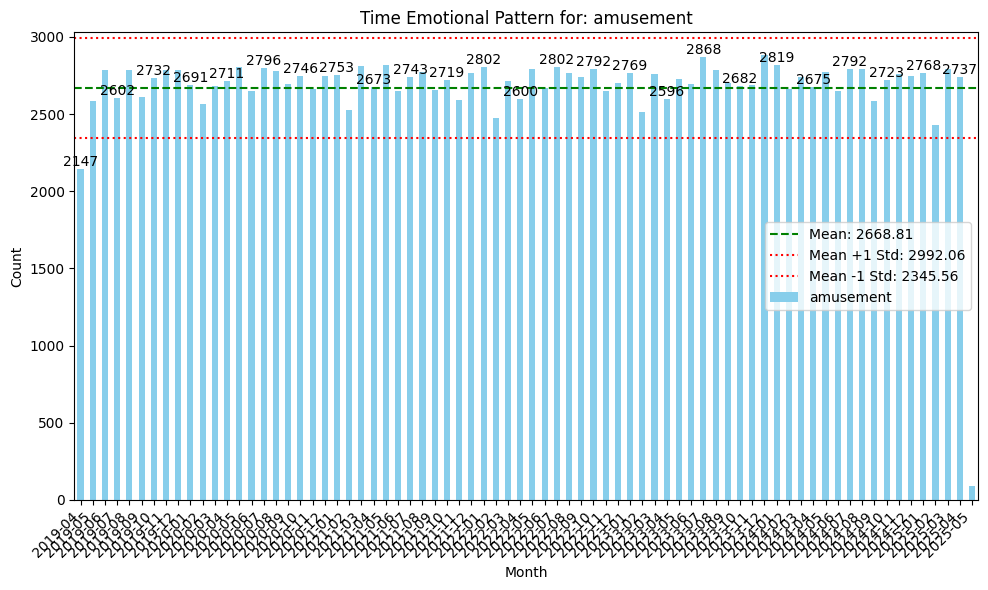

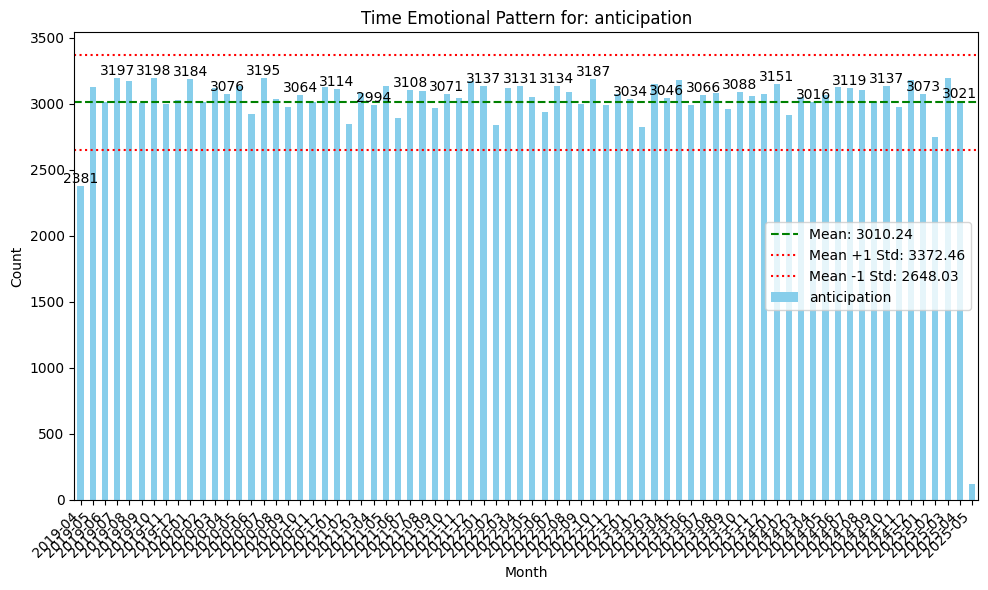

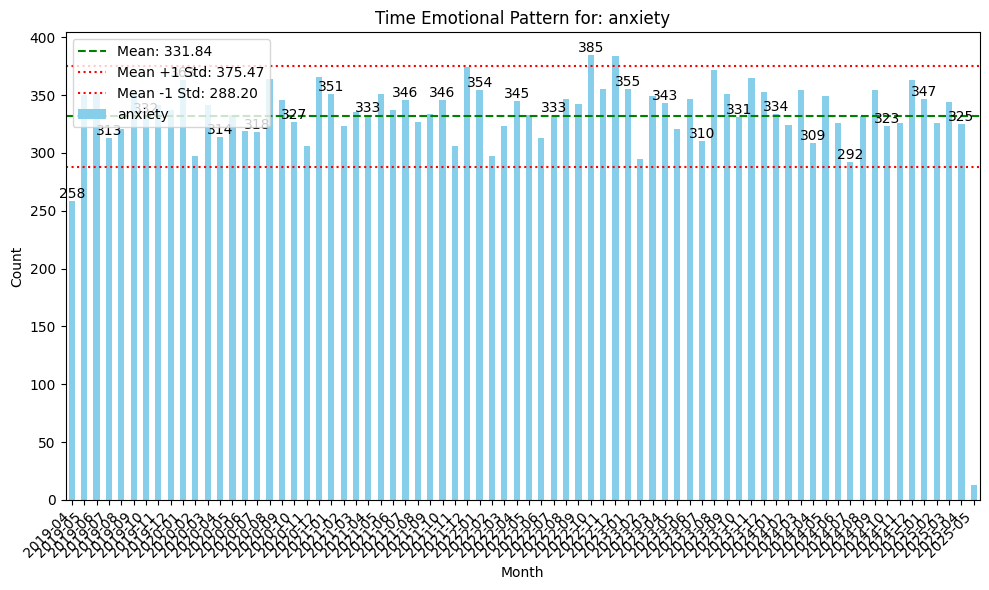

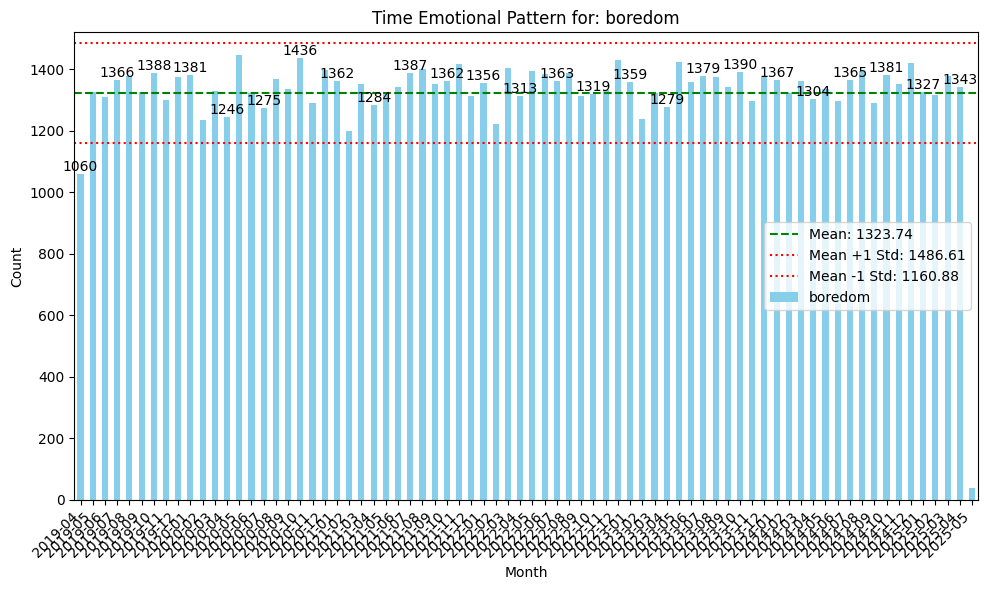

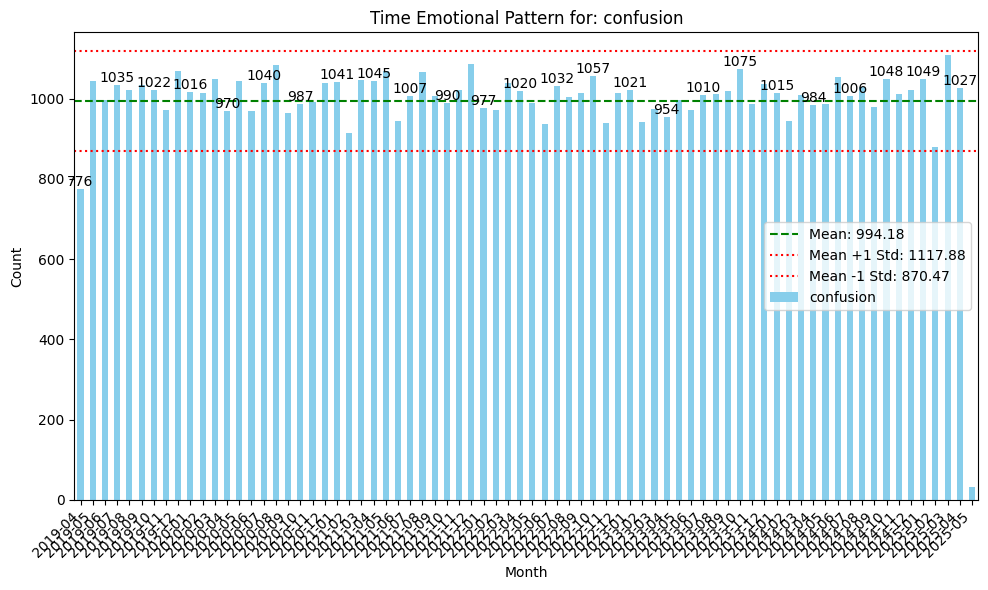

...

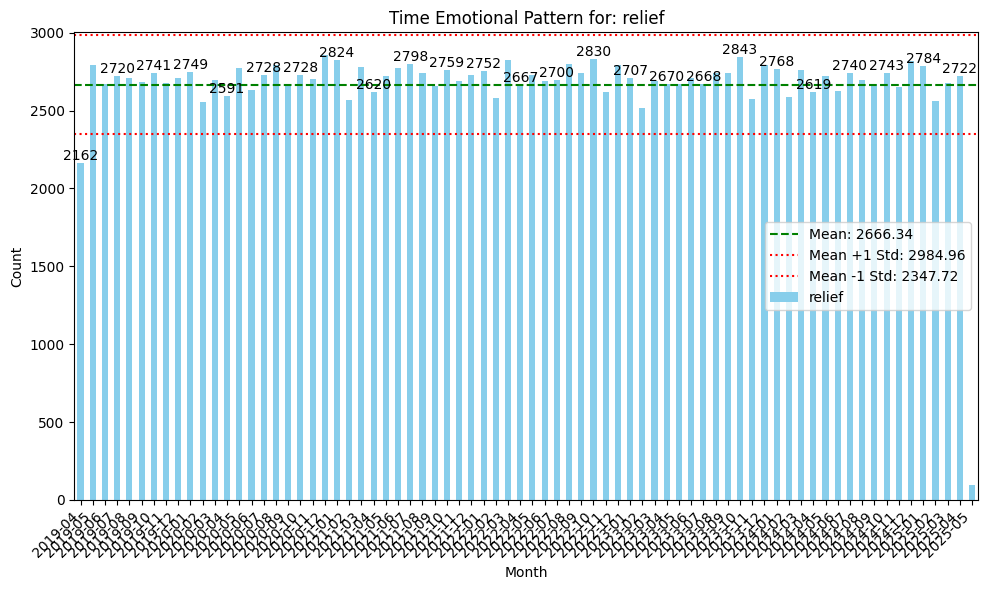

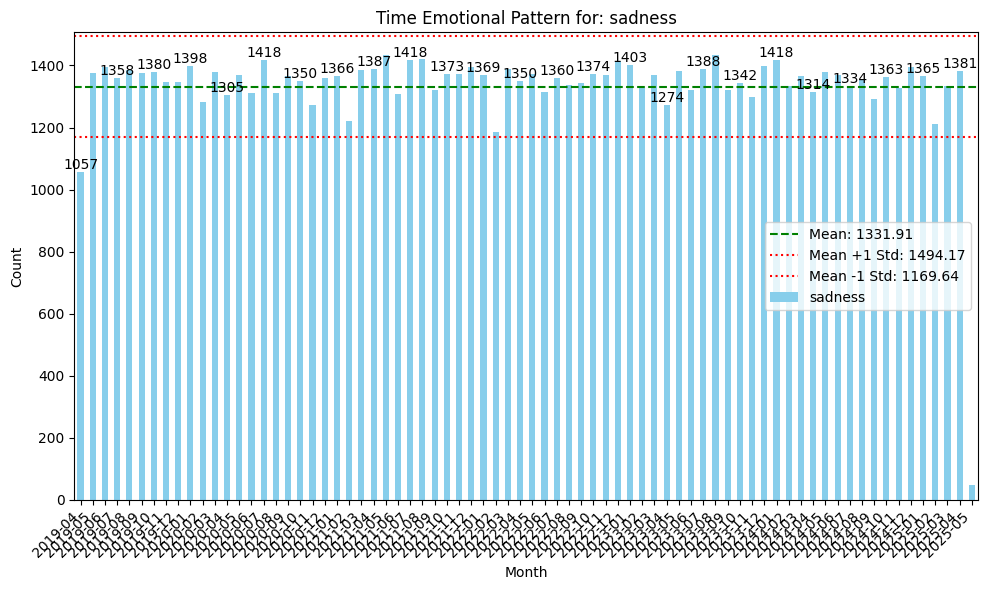

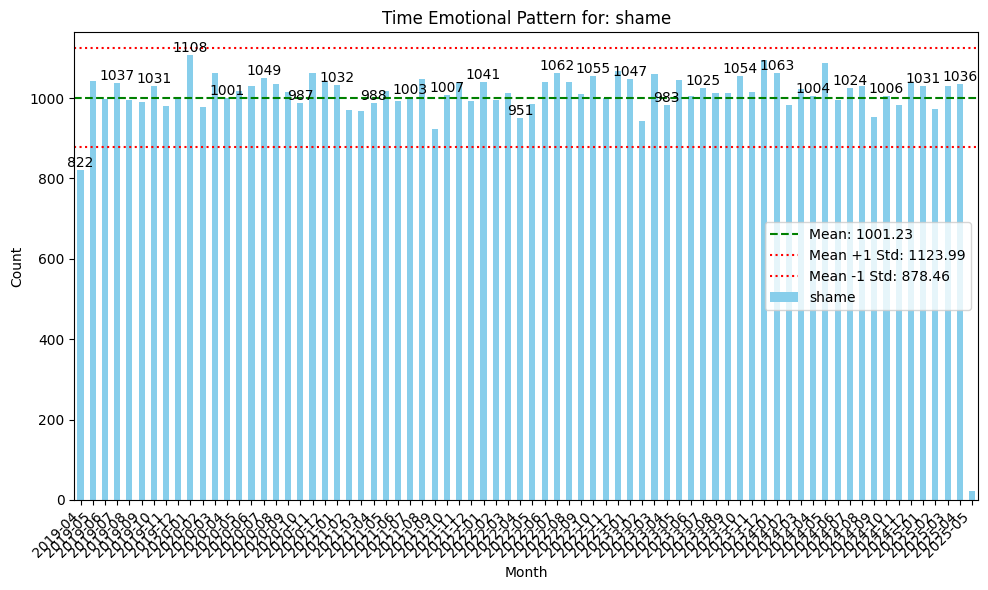

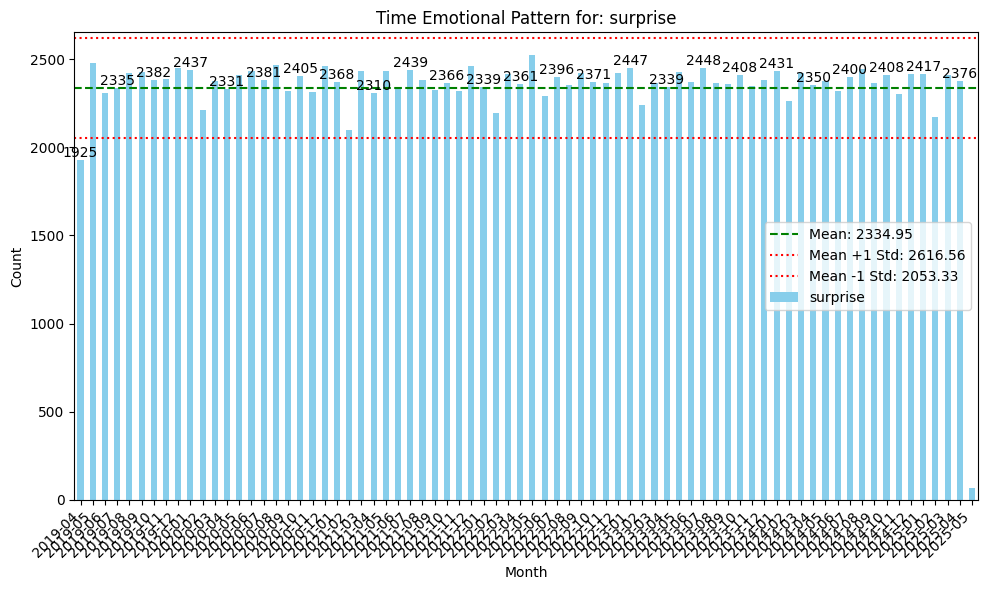

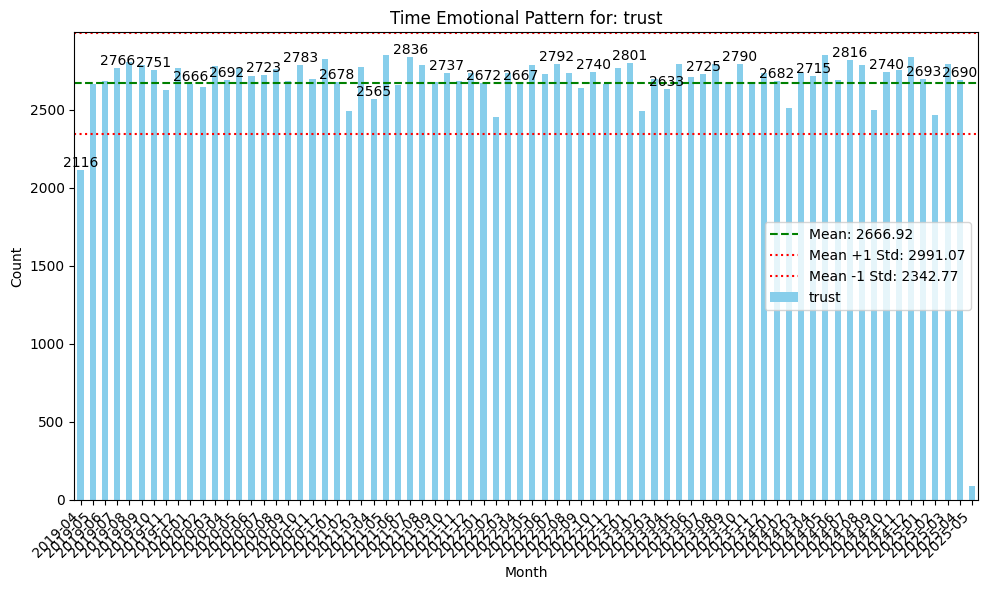

Cell execution took 35.9102 seconds.


In [25]:
start_time = time.time()  # Start timing

# Fetch emotional data from the database
query = """
SELECT
  strftime('%Y-%m', timestamp) AS month,
  primary_emotion,
  COUNT(*) AS emotion_count
FROM emotional_data
GROUP BY
  month, primary_emotion
ORDER BY
  month, emotion_count DESC;
"""

df_emotion_counts = pd.read_sql_query(query, conn)

# Group by emotion and then by month to get counts for each emotion over time
emotion_monthly_counts = df_emotion_counts.groupby(['primary_emotion', 'month'])['emotion_count'].sum().unstack()

# Create bar charts for each emotion over the months
for emotion, monthly_counts in emotion_monthly_counts.iterrows():
    plt.figure(figsize=(10, 6))

    # Plot bar chart
    monthly_counts.plot(kind='bar', color='skyblue')
    plt.title(f'Time Emotional Pattern for: {emotion}')
    plt.xlabel('Month')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')

    # Calculate mean and std
    mean_count = monthly_counts.mean()
    std_count = monthly_counts.std()

    # Add horizontal lines for mean and ±1 std
    plt.axhline(mean_count, color='green', linestyle='--', label=f'Mean: {mean_count:.2f}')
    plt.axhline(mean_count + std_count, color='red', linestyle=':', label=f'Mean +1 Std: {mean_count + std_count:.2f}')
    plt.axhline(mean_count - std_count, color='red', linestyle=':', label=f'Mean -1 Std: {mean_count - std_count:.2f}')

    # Add data labels above the bars
    for i, count in enumerate(monthly_counts):
        if i % 3 == 0:  # Only add labels every three bars
            plt.text(i, count, str(count), ha='center', va='bottom')

    # Add legend for mean and std lines
    plt.legend()

    plt.tight_layout()
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


The frequency of each emotion over time stays generally within 1 standard deviation of the mean, indicating that there is no upwards or downwards trend for any emotion.

### 2.2 Analyze how emotions correlate with different contexts (e.g., relationships, situations, time of day).

In [ ]:
start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch emotional data from the database
query = """
SELECT
  primary_emotion,
  intensity,
  relationship,
  situation,
  time_of_day,
  location,
  weather,
  physical_state,
  preceding_event
FROM emotional_data;
"""
df_emotional_data = pd.read_sql_query(query, conn)

# Get unique emotions
emotions = df_emotional_data['primary_emotion'].unique()

# Iterate through each emotion
for emotion in emotions:
  # Create a new dataframe for current emotion
  df_emotion = df_emotional_data[df_emotional_data['primary_emotion'] == emotion]

  # Create boxplots for intensity vs each context
  context_columns = ['relationship', 'situation', 'time_of_day', 'location', 'weather', 'physical_state', 'preceding_event']

  for context_column in context_columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=context_column, y='intensity', data=df_emotion)
    plt.title(f'Intensity of {emotion} vs {context_column}')
    plt.xlabel(context_column)
    plt.ylabel('Intensity')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")

Output hidden; open in https://colab.research.google.com to view.

Both the initial data exploration and the box plots above indicate that the intensity column have no outliers, either overall or when segmented by the values of the context variables.

The boxplots above also seem to indicate a bit of a difference on the median of the intensity for different values of some these variables, but it is not clear yet whether these differences are statistically significant.

In [12]:
start_time = time.time()  # Start timing

# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data from the database
query = """
SELECT
  primary_emotion,
  intensity,
  relationship,
  situation,
  time_of_day,
  location,
  weather,
  physical_state,
  preceding_event
FROM emotional_data;
"""
df_emotional_data = pd.read_sql_query(query, conn)

# Get unique emotions
emotions = df_emotional_data['primary_emotion'].unique()

# Iterate through each emotion
for emotion in emotions:
    # Create a new dataframe for current emotion
    df_emotion = df_emotional_data[df_emotional_data['primary_emotion'] == emotion]

    # Create boxplots for intensity vs each context
    context_columns = ['relationship', 'situation', 'time_of_day', 'location', 'weather', 'physical_state', 'preceding_event']

    for context_column in context_columns:
        unique_context_values = df_emotion[context_column].unique()

        # Prepare lists to hold intensity values for the Kruskal-Wallis test
        intensity_groups = []

        for value in unique_context_values:
            df_emotion_value = df_emotion[df_emotion[context_column] == value]['intensity']
            intensity_groups.append(df_emotion_value)

        # Perform Kruskal-Wallis test if there are at least 2 groups to compare
        if len(intensity_groups) < 2:
            continue

        statistic, p_value = kruskal(*intensity_groups)

        # If the p-value is below a certain threshold (e.g., 0.05),
        # we reject the null hypothesis that the distributions are the same.
        if p_value < 0.05:
            print(f"Kruskal-Wallis Test for {emotion} - {context_column}:")
            print(f"Kruskal-Wallis H-Statistic: {statistic}")
            print(f"P-Value: \033[43m\033[30m{p_value:.5f}\033[0m")  # Highlighted in yellow
            print(f"The intensity distributions have statistically significant differences for these values of {context_column}:")

            # Analyze medians for each context value
            for value, df_emotion_value in zip(unique_context_values, intensity_groups):
                median_value = df_emotion_value.median()  # Change to median
                print(f"Median for {value}: {median_value:.2f}")

            print()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


Kruskal-Wallis Test for amusement - time_of_day:
Kruskal-Wallis H-Statistic: 11.588459107044262
P-Value: 0.00893
The intensity distributions have statistically significant differences for these values of time_of_day:
Median for morning: 5.00
Median for night: 5.00
Median for evening: 6.00
Median for afternoon: 6.00

Cell execution took 81.3845 seconds.


Among all the different emotions, only amusement exhibits a statistically significant difference in median based on the time of day, with higher values observed in the evening and afternoon compared to the morning and night. The other emotions show no statistically significant differences in medians across the evaluated contexts (i.e., relationship, situation, time of day, location, weather, physical state, preceding event).

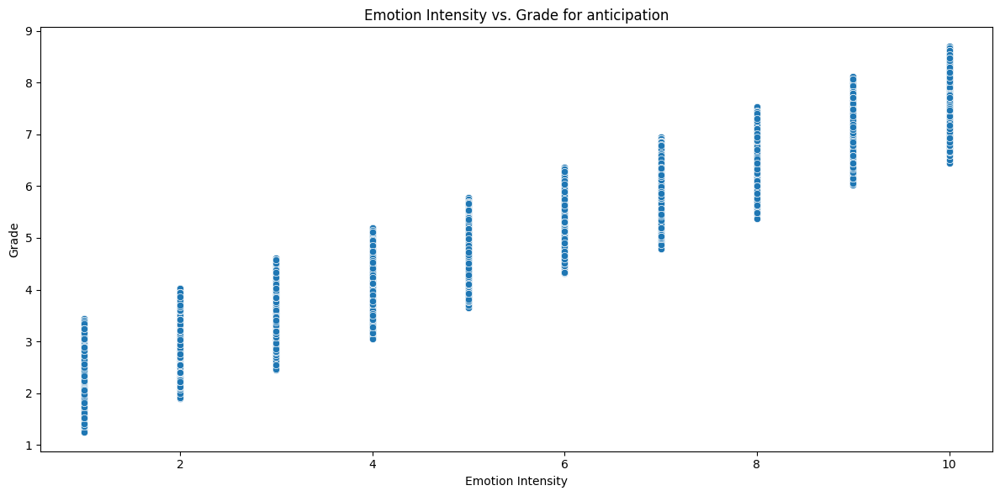

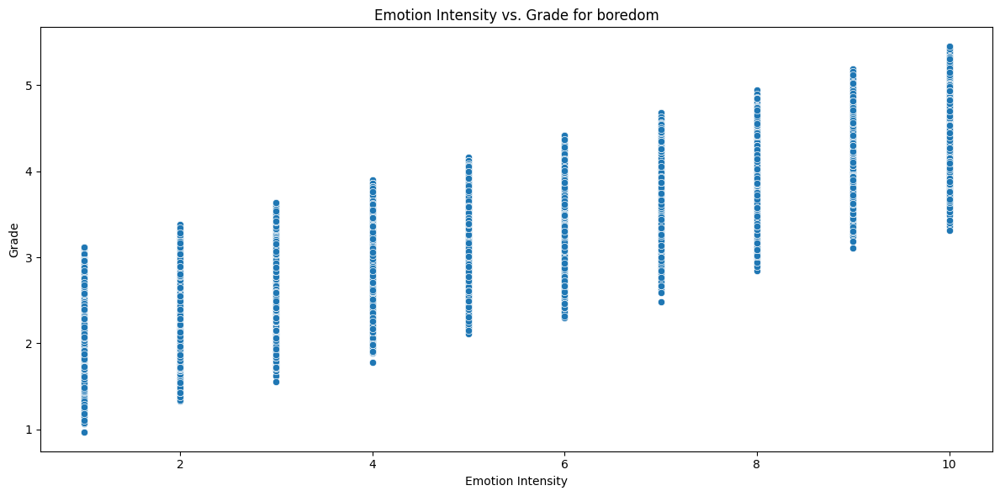

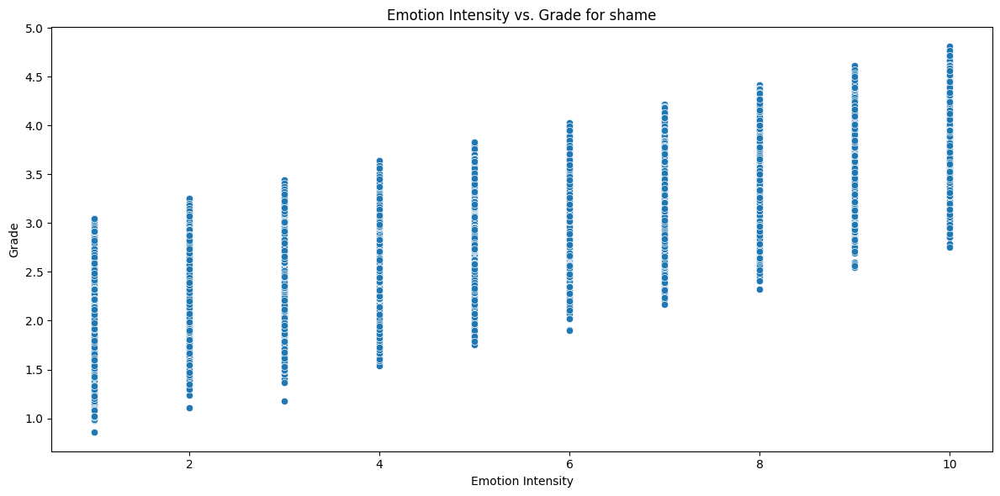

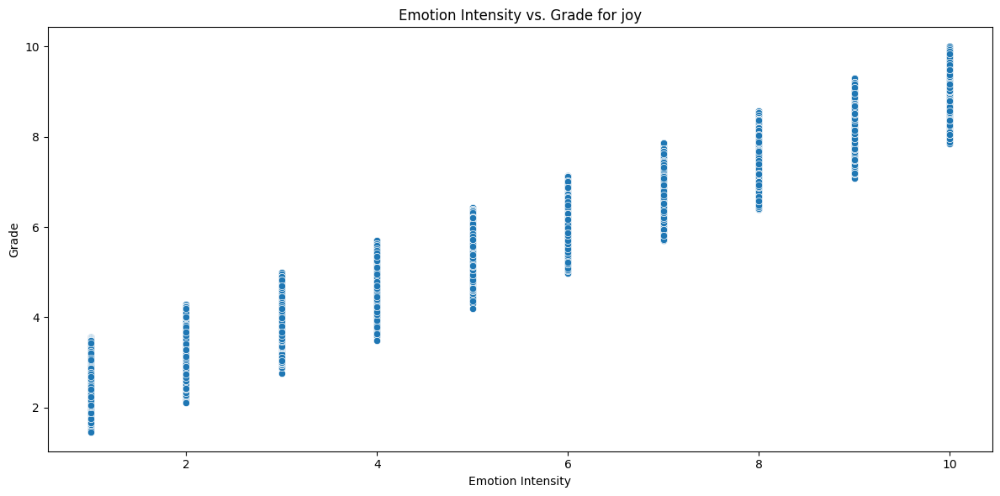

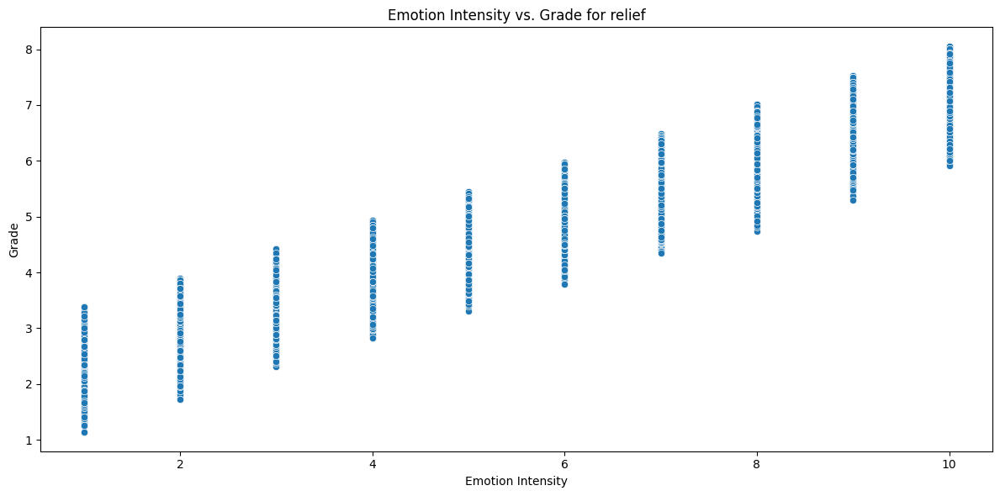

...

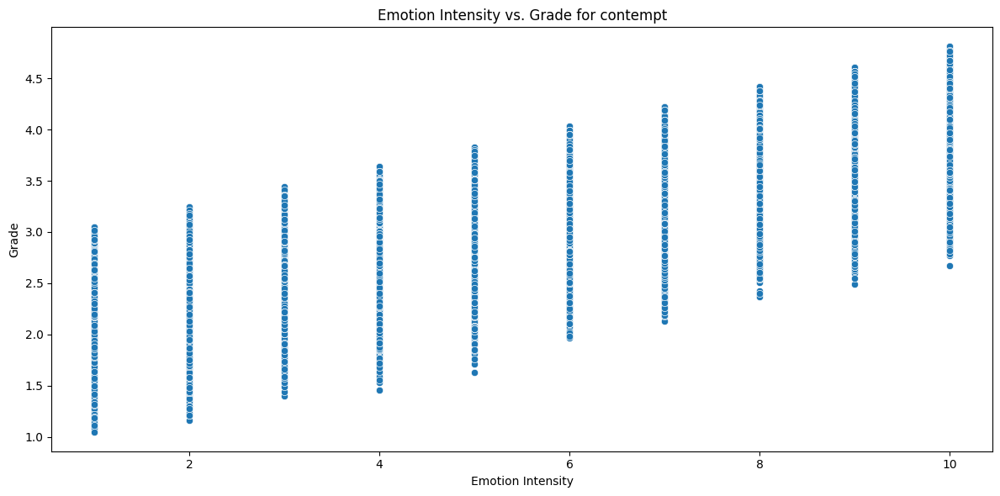

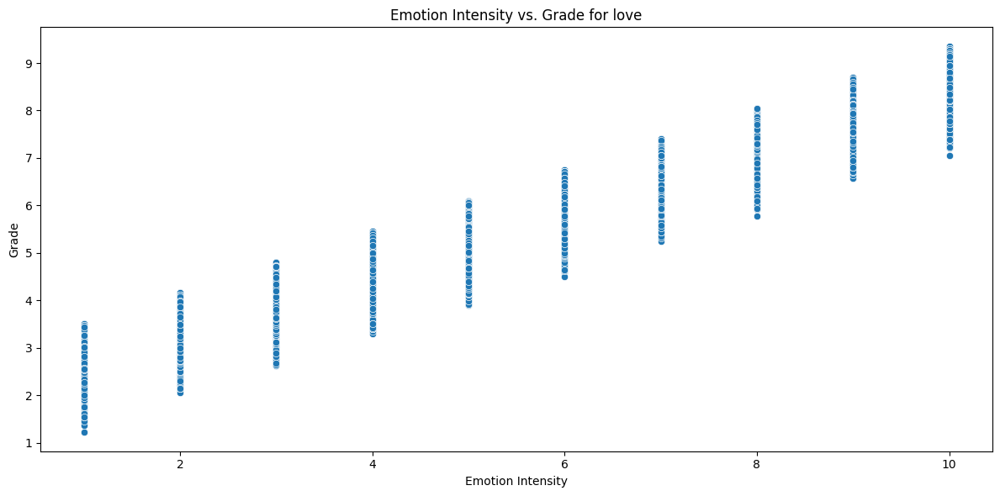

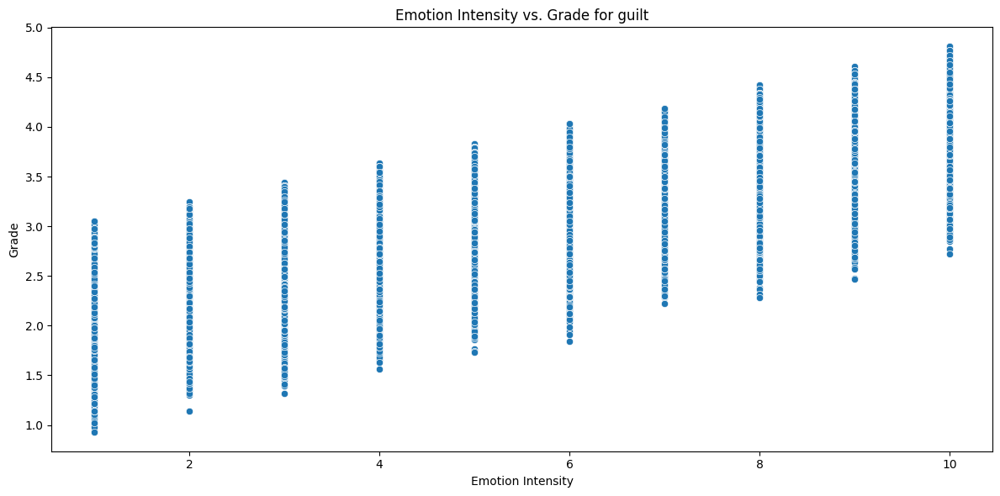

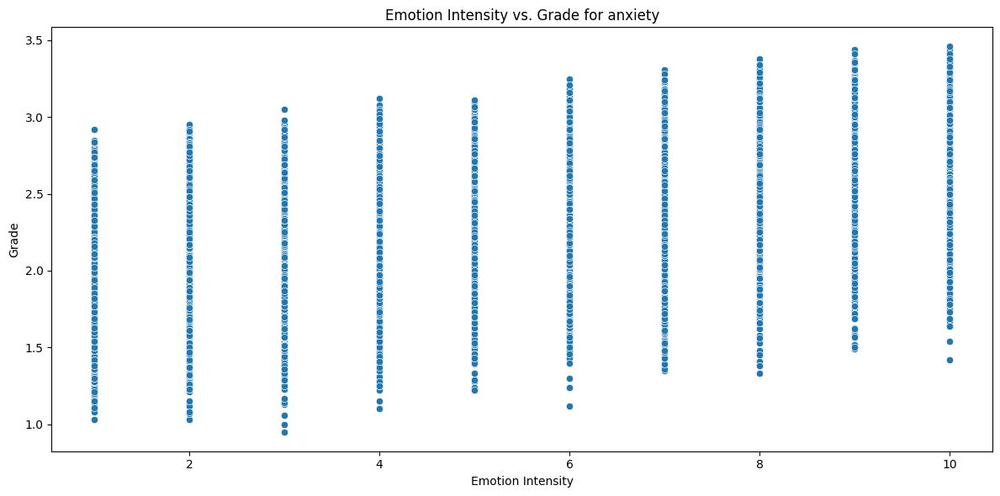

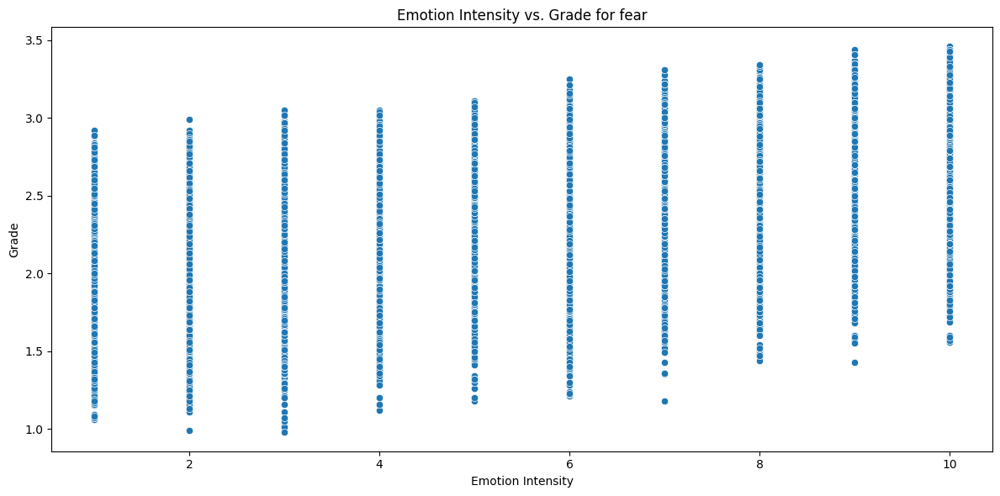

Cell execution took 26.5494 seconds.


In [10]:
start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch emotional data from the database
query = """
SELECT
  primary_emotion,
  intensity,
  grade
FROM emotional_data;
"""
df_emotional_data = pd.read_sql_query(query, conn)

# Get unique emotions
emotions = df_emotional_data['primary_emotion'].unique()

# Iterate through each emotion
for emotion in emotions:
  # Create a new dataframe for current emotion
  df_emotion = df_emotional_data[df_emotional_data['primary_emotion'] == emotion]

  # Create a scatterplot
  plt.figure(figsize=(12, 6))
  sns.scatterplot(x='intensity', y='grade', data=df_emotion)
  plt.title(f'Emotion Intensity vs. Grade for {emotion}')
  plt.xlabel('Emotion Intensity')
  plt.ylabel('Grade')
  plt.tight_layout()
  plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


The above charts indicate that the emotion intensity have a positive correlation with grade for all of the emotions. The higher the grade, the higher the emotion intensity.

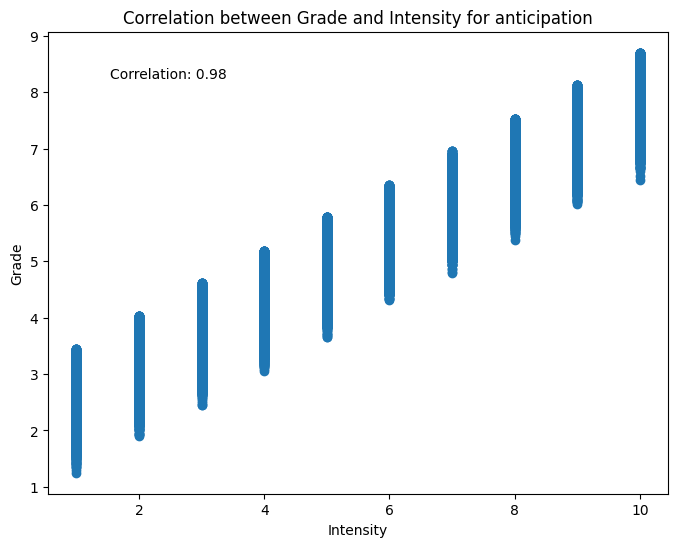

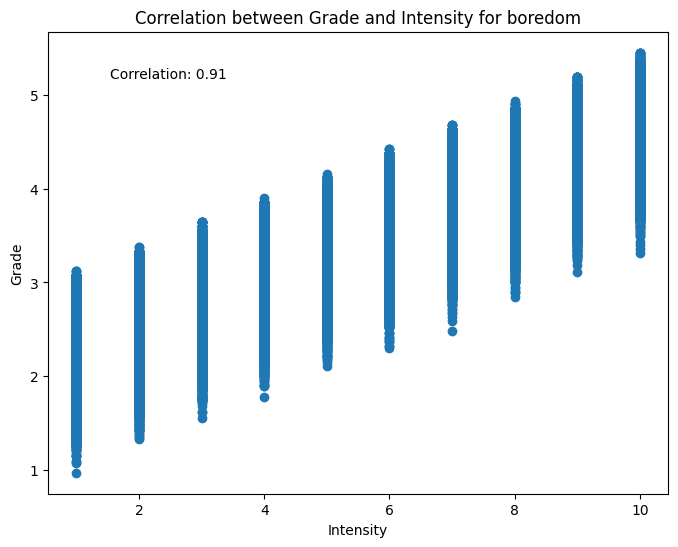

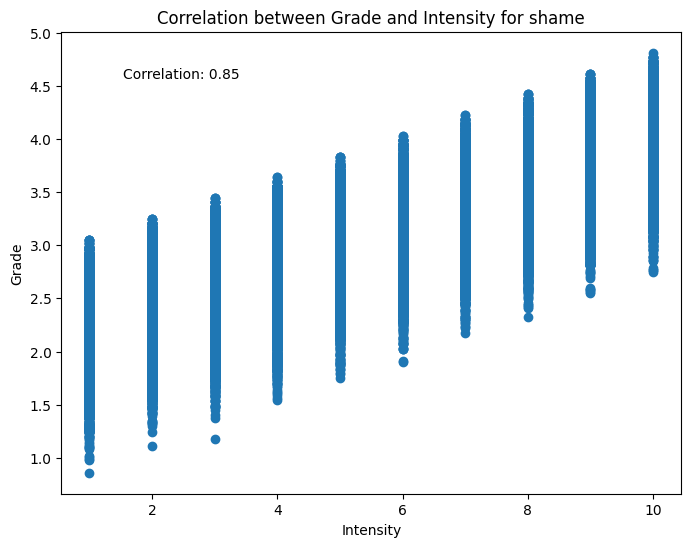

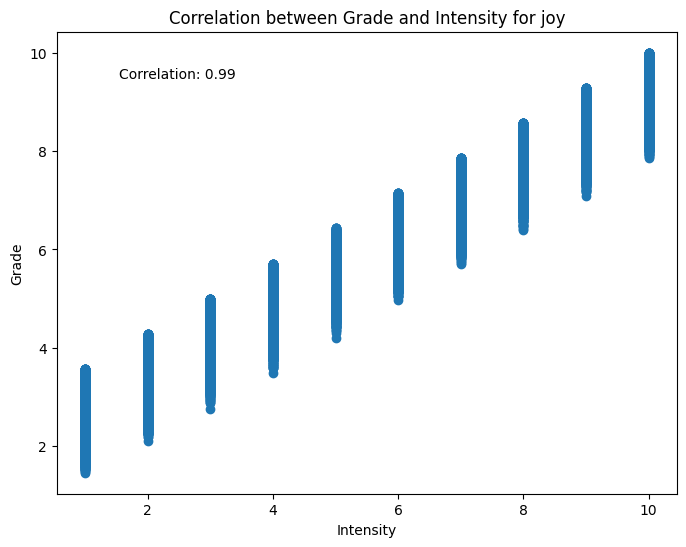

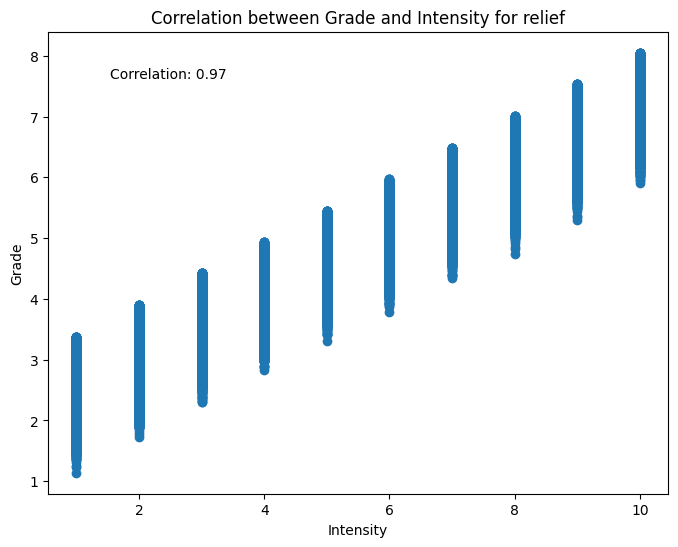

...

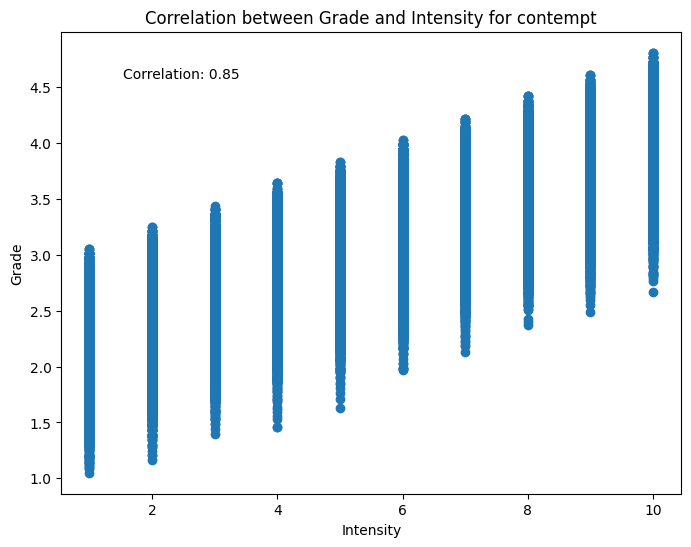

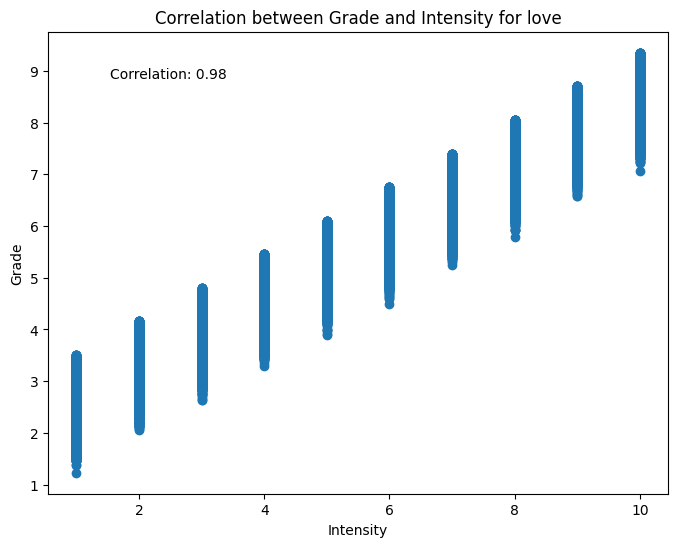

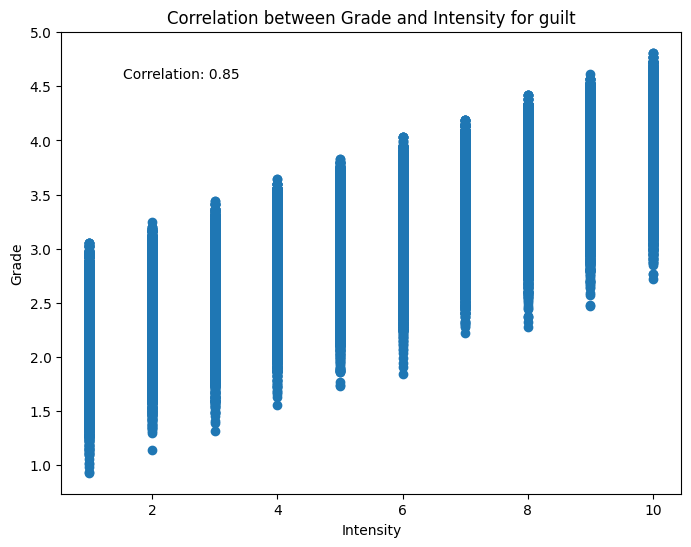

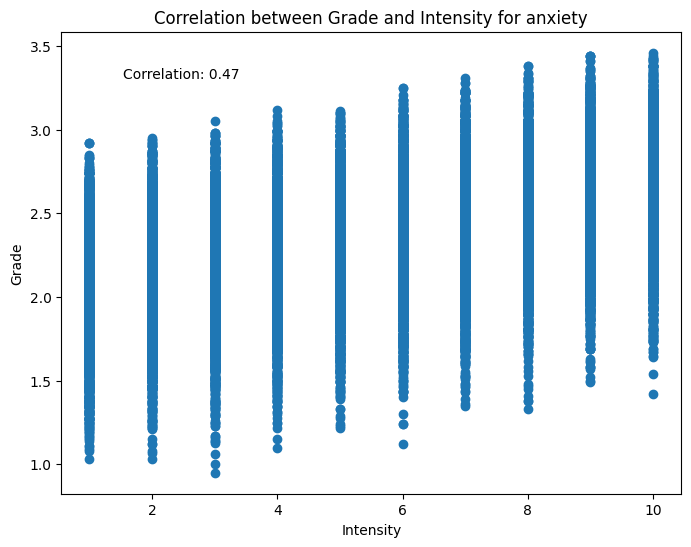

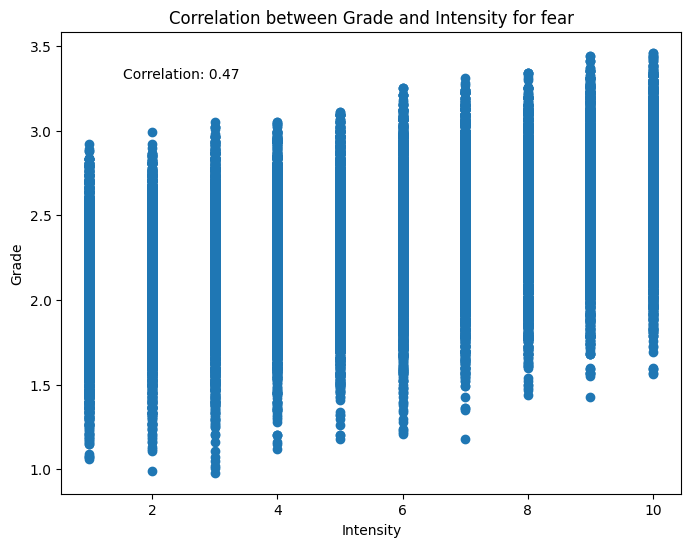

Cell execution took 29.3876 seconds.


In [15]:
start_time = time.time()  # Start timing

# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data from the database
query = """
SELECT
  primary_emotion,
  intensity,
  grade
FROM emotional_data;
"""
df_emotional_data = pd.read_sql_query(query, conn)

# Group by emotion and calculate correlation
for emotion in df_emotional_data['primary_emotion'].unique():
  df_emotion = df_emotional_data[df_emotional_data['primary_emotion'] == emotion]
  correlation = df_emotion['grade'].corr(df_emotion['intensity'])

  # Create a scatterplot with the correlation coefficient displayed
  plt.figure(figsize=(8, 6))
  plt.scatter(df_emotion['intensity'], df_emotion['grade'])
  plt.title(f'Correlation between Grade and Intensity for {emotion}'.title())
  plt.xlabel('Intensity')
  plt.ylabel('Grade')
  plt.text(0.1, 0.9, f'Correlation: {correlation:.2f}', transform=plt.gca().transAxes)
  plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


As calculated and demonstrated above, emotion intensity and grade correlated highly, from 0.47 up to 0.99 depending on the emotion. It is also worth mentioning that for certain grades (such as 6 or above) there were no records of the emotions fear, anxiety, contempt, sadness, disgust, jealousy, frustration, confusion, shame and boredom.



## 3\. Loan-Emotion Correlation
   - Analyze the relationship between emotional patterns and loan terms (amount, interest rate).
   - Identify which emotional factors have the strongest influence on loan results.



### 3.1 Analyze the relationship between emotional patterns and loan terms (amount, interest rate)

In [15]:
# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data from the database
query = """
SELECT DISTINCT primary_emotion
FROM emotional_data;
"""
unique_emotions = pd.read_sql_query(query, conn)

print("Unique emotions in the emotional_data table:")
print(unique_emotions)

# Close the connection
conn.close()


Unique emotions in the emotional_data table:
   primary_emotion
0     anticipation
1          boredom
2            shame
3              joy
4           relief
5            trust
6            pride
7         surprise
8        confusion
9        amusement
10     frustration
11        jealousy
12         disgust
13         sadness
14        contempt
15            love
16           guilt
17         anxiety
18            fear



Correlation Matrix for amusement average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.040738      -0.052432   0.040050 -0.006411   

                       avg_emotion_intensity  
credit_limit                        0.040738  
interest_rate                      -0.052432  
loan_term                           0.040050  
score                              -0.006411  
avg_emotion_intensity               1.000000  


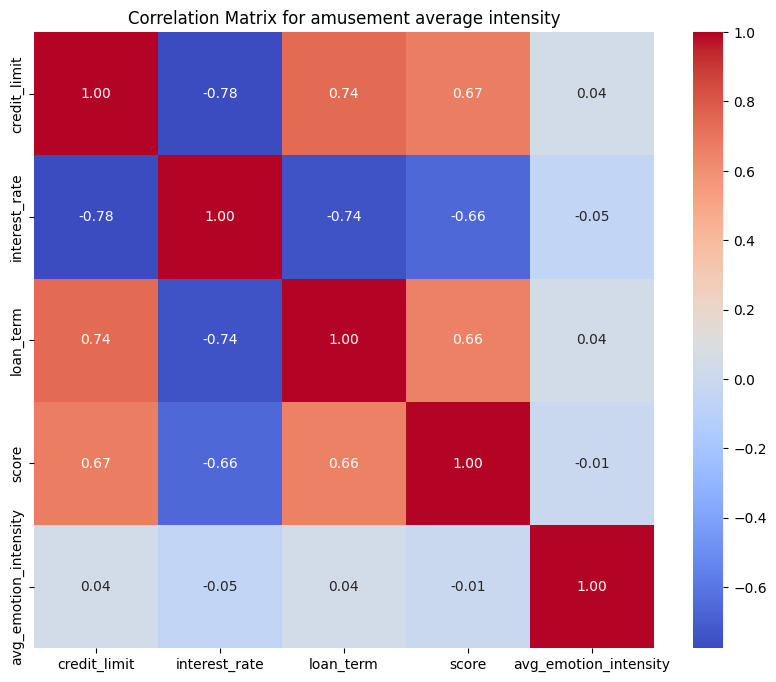


Correlation Matrix for anticipation average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.004215       0.015761  -0.018082 -0.006147   

                       avg_emotion_intensity  
credit_limit                       -0.004215  
interest_rate                       0.015761  
loan_term                          -0.018082  
score                              -0.006147  
avg_emotion_intensity               1.000000  


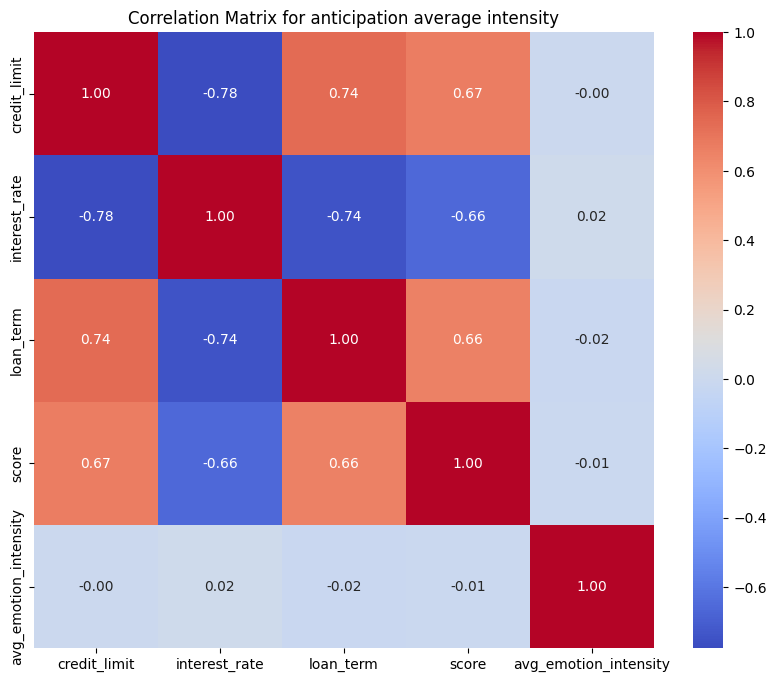


Correlation Matrix for anxiety average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.042247      -0.099374   0.078036  0.082812   

                       avg_emotion_intensity  
credit_limit                        0.042247  
interest_rate                      -0.099374  
loan_term                           0.078036  
score                               0.082812  
avg_emotion_intensity               1.000000  


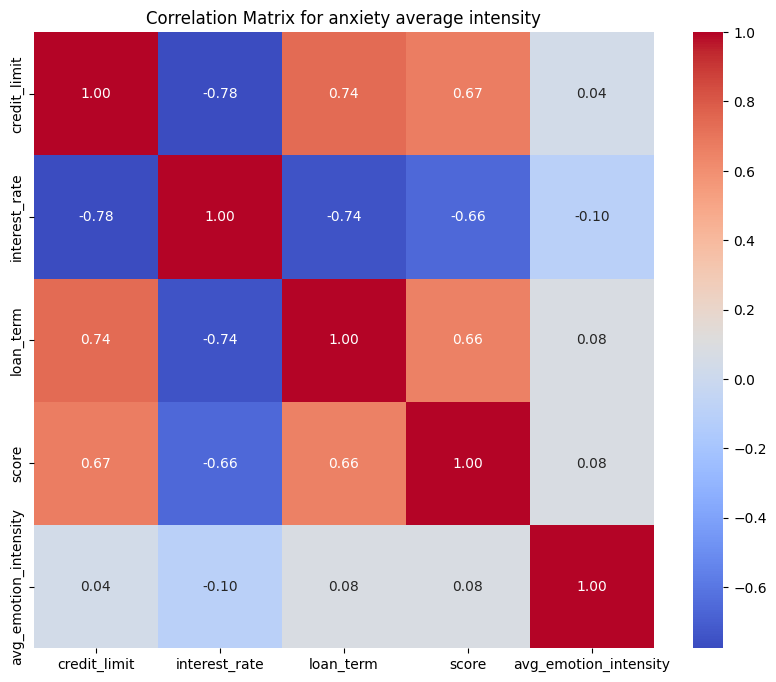


Correlation Matrix for boredom average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.045504       0.069654  -0.017710 -0.084134   

                       avg_emotion_intensity  
credit_limit                       -0.045504  
interest_rate                       0.069654  
loan_term                          -0.017710  
score                              -0.084134  
avg_emotion_intensity               1.000000  


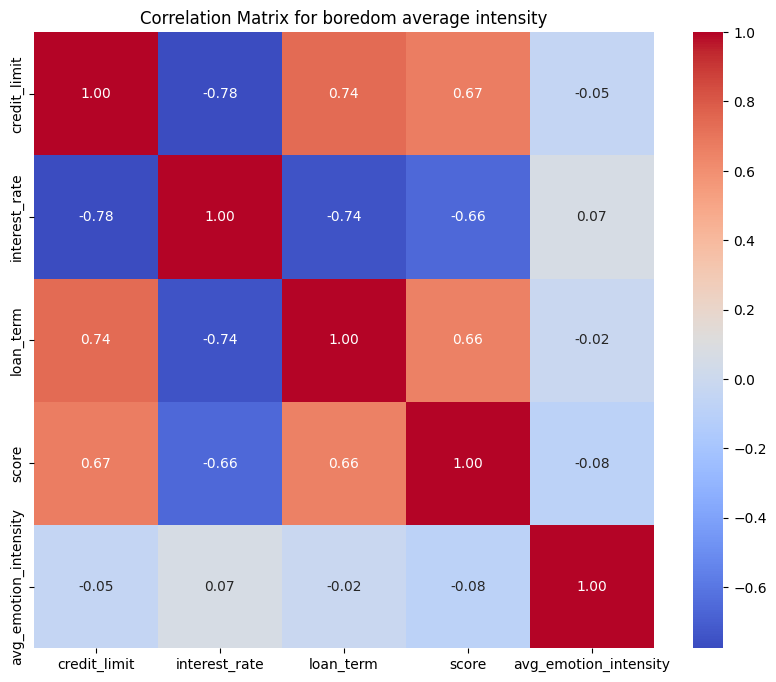


Correlation Matrix for confusion average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.025540      -0.021825   0.055936  0.050232   

                       avg_emotion_intensity  
credit_limit                        0.025540  
interest_rate                      -0.021825  
loan_term                           0.055936  
score                               0.050232  
avg_emotion_intensity               1.000000  


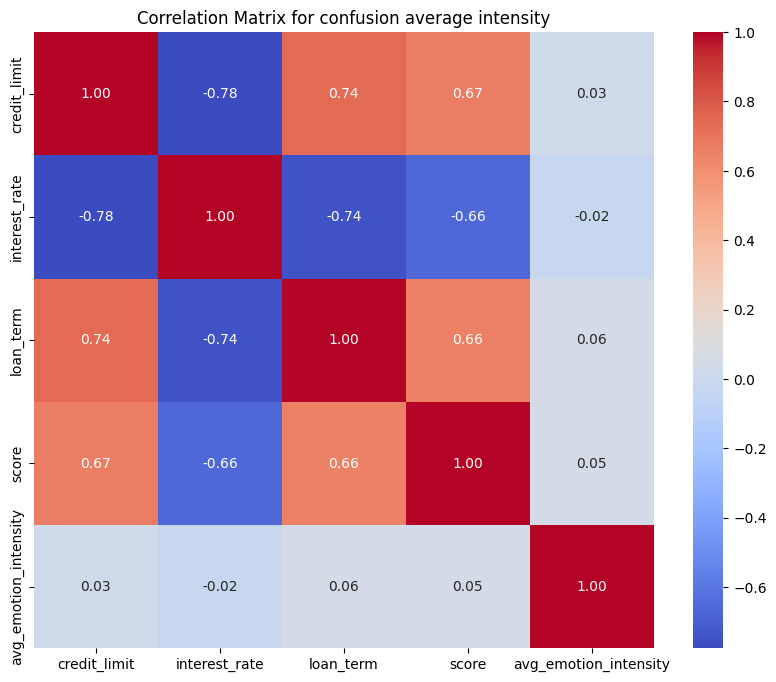


Correlation Matrix for contempt average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.000366      -0.030589  -0.000153  0.018653   

                       avg_emotion_intensity  
credit_limit                        0.000366  
interest_rate                      -0.030589  
loan_term                          -0.000153  
score                               0.018653  
avg_emotion_intensity               1.000000  


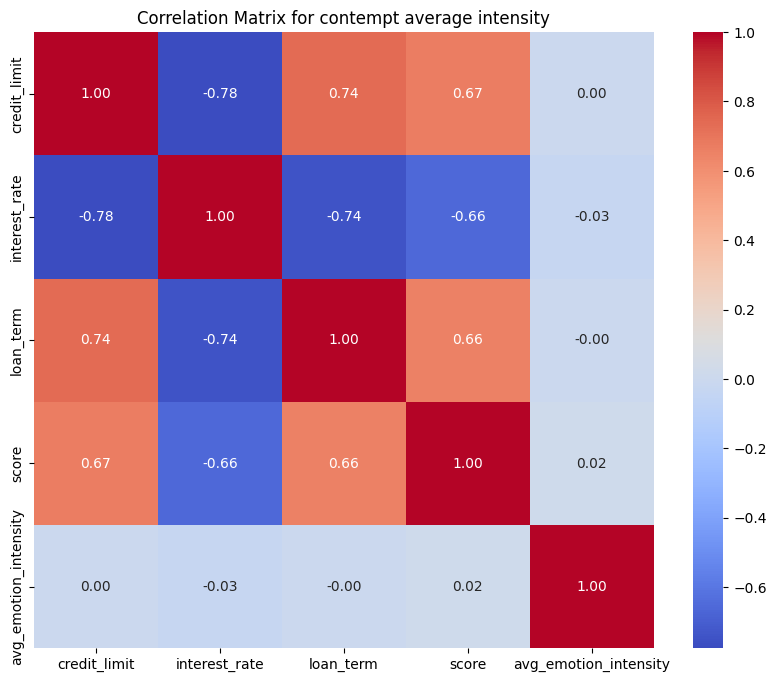


Correlation Matrix for disgust average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.030990      -0.021645  -0.004976  0.015685   

                       avg_emotion_intensity  
credit_limit                        0.030990  
interest_rate                      -0.021645  
loan_term                          -0.004976  
score                               0.015685  
avg_emotion_intensity               1.000000  


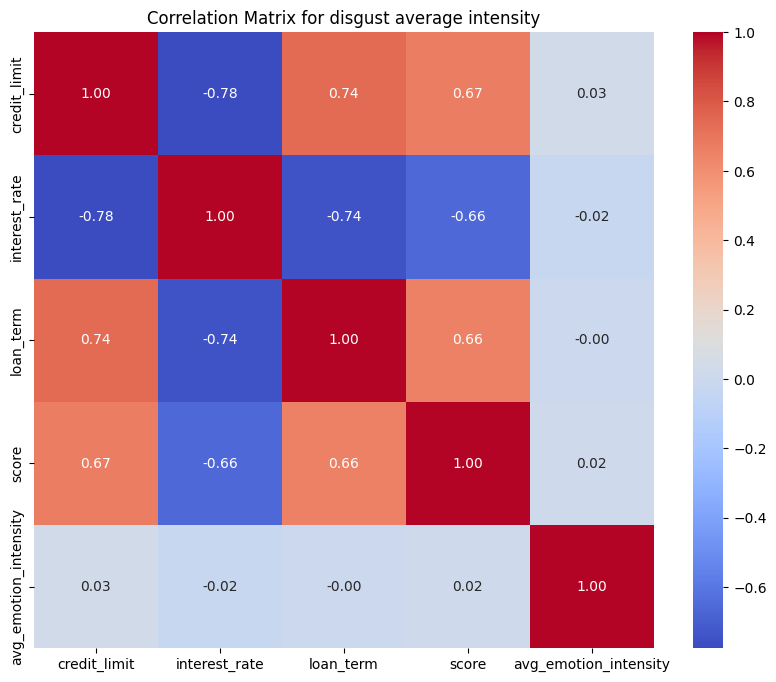


Correlation Matrix for fear average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.014417       0.010880   0.011839  0.006080   

                       avg_emotion_intensity  
credit_limit                        0.014417  
interest_rate                       0.010880  
loan_term                           0.011839  
score                               0.006080  
avg_emotion_intensity               1.000000  


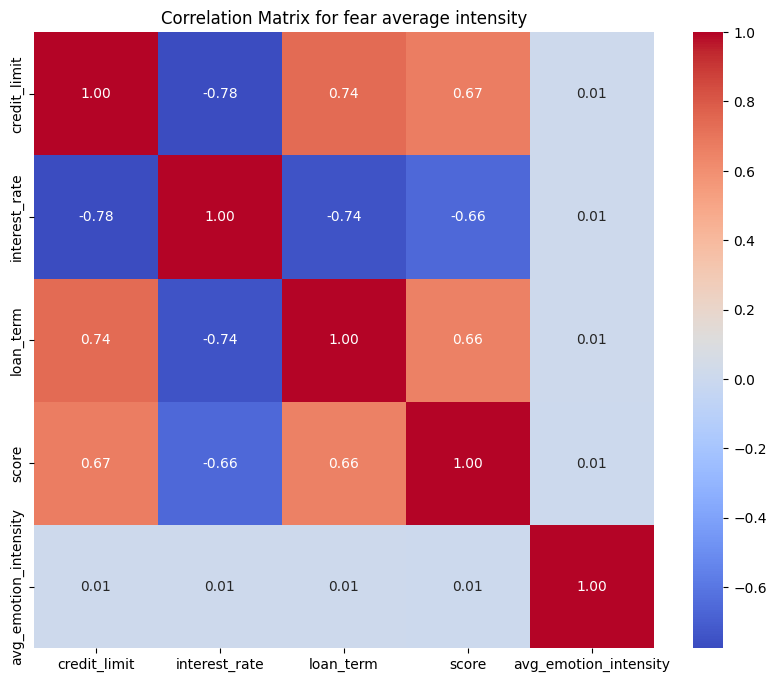


Correlation Matrix for frustration average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.003165       0.000418   0.030794  0.002005   

                       avg_emotion_intensity  
credit_limit                       -0.003165  
interest_rate                       0.000418  
loan_term                           0.030794  
score                               0.002005  
avg_emotion_intensity               1.000000  


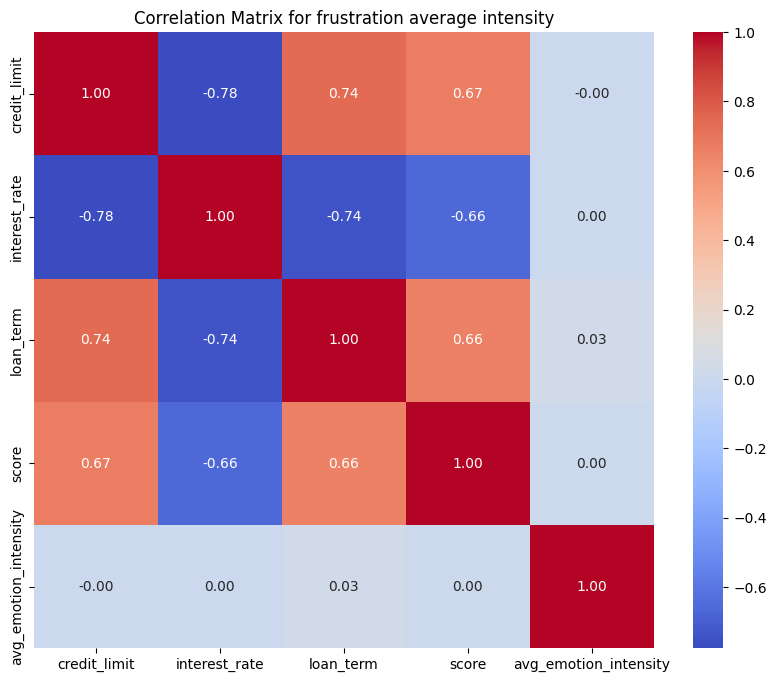


Correlation Matrix for guilt average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.011103      -0.011971   0.008243 -0.036535   

                       avg_emotion_intensity  
credit_limit                       -0.011103  
interest_rate                      -0.011971  
loan_term                           0.008243  
score                              -0.036535  
avg_emotion_intensity               1.000000  


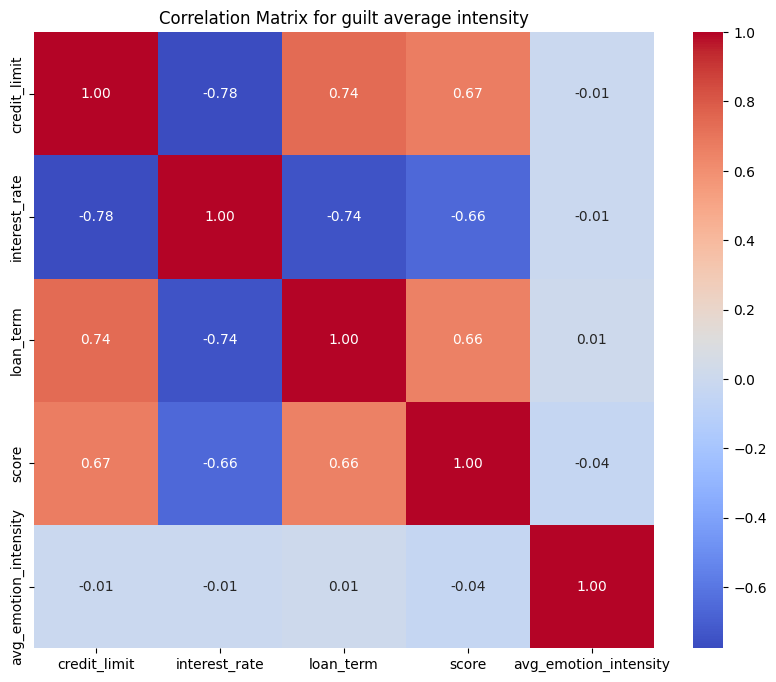


Correlation Matrix for jealousy average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.079647      -0.070939   0.094319  0.106216   

                       avg_emotion_intensity  
credit_limit                        0.079647  
interest_rate                      -0.070939  
loan_term                           0.094319  
score                               0.106216  
avg_emotion_intensity               1.000000  


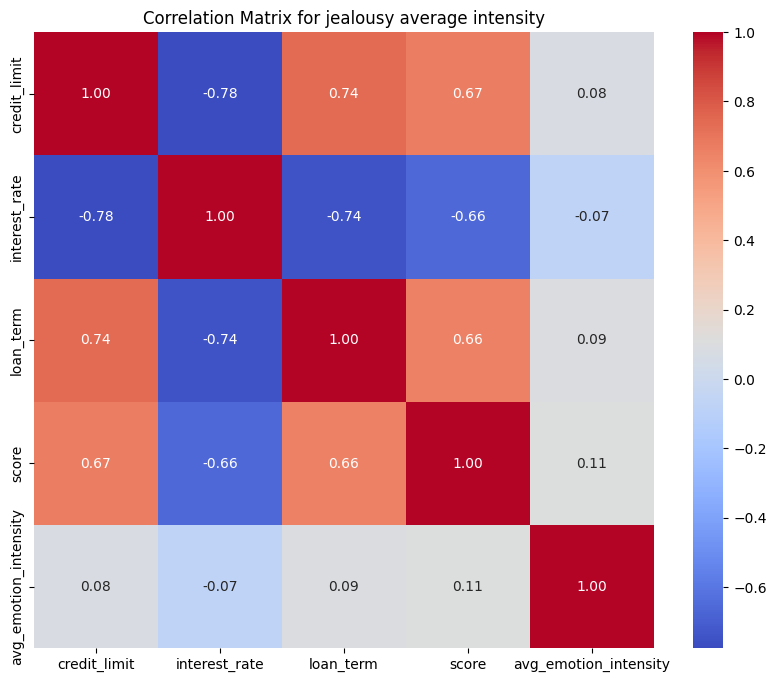


Correlation Matrix for joy average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.015810       0.028952  -0.008618 -0.024304   

                       avg_emotion_intensity  
credit_limit                       -0.015810  
interest_rate                       0.028952  
loan_term                          -0.008618  
score                              -0.024304  
avg_emotion_intensity               1.000000  


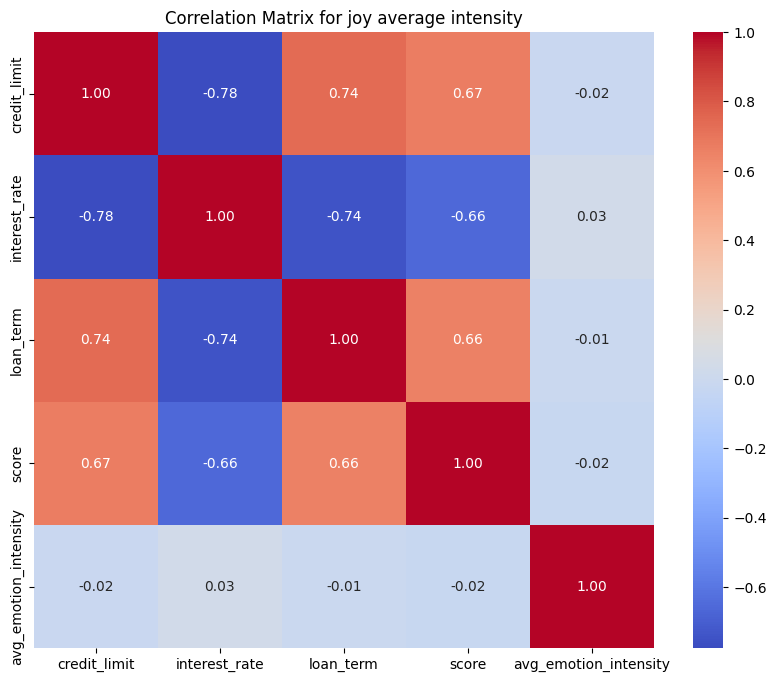


Correlation Matrix for love average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.049204       0.007619   0.038271 -0.028542   

                       avg_emotion_intensity  
credit_limit                        0.049204  
interest_rate                       0.007619  
loan_term                           0.038271  
score                              -0.028542  
avg_emotion_intensity               1.000000  


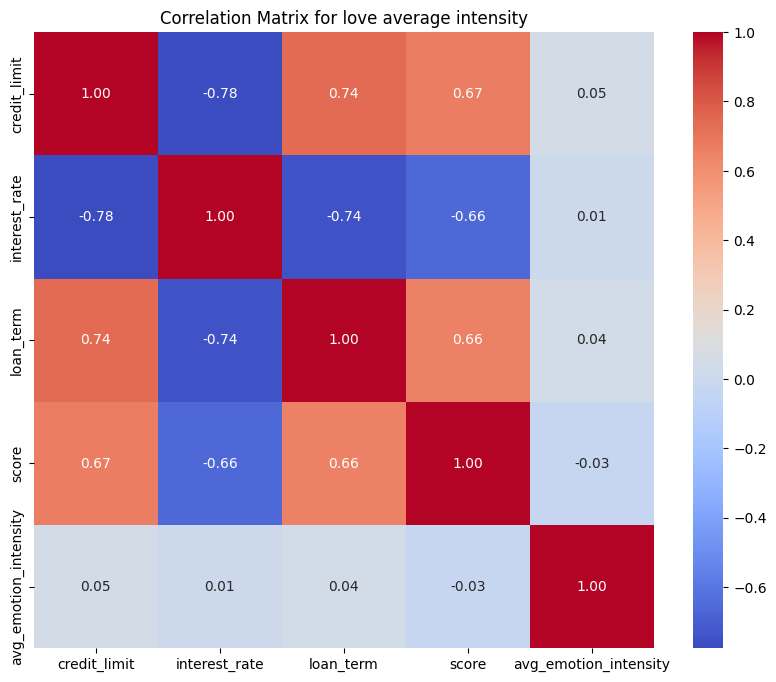


Correlation Matrix for pride average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.014252       0.002057  -0.042012 -0.016949   

                       avg_emotion_intensity  
credit_limit                       -0.014252  
interest_rate                       0.002057  
loan_term                          -0.042012  
score                              -0.016949  
avg_emotion_intensity               1.000000  


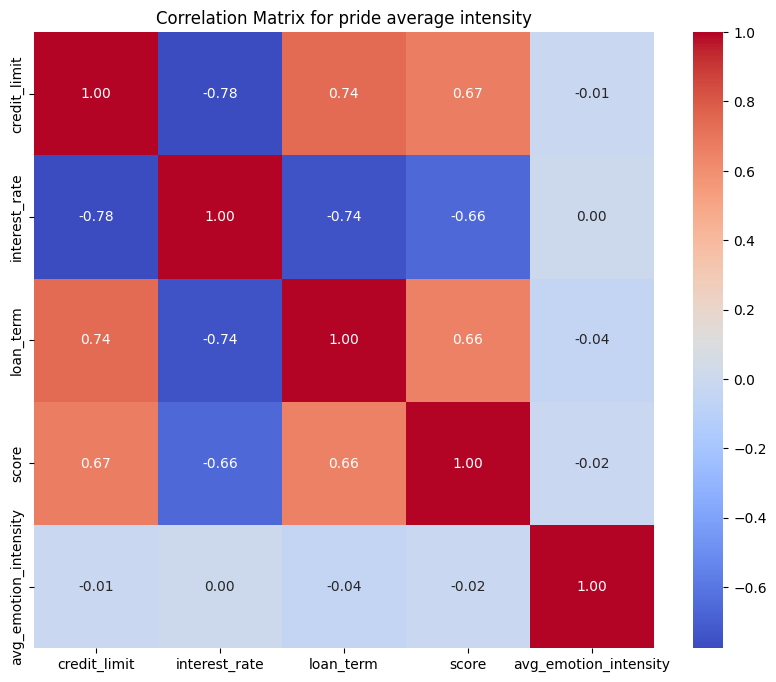


Correlation Matrix for relief average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.026275      -0.011852  -0.020292 -0.014902   

                       avg_emotion_intensity  
credit_limit                       -0.026275  
interest_rate                      -0.011852  
loan_term                          -0.020292  
score                              -0.014902  
avg_emotion_intensity               1.000000  


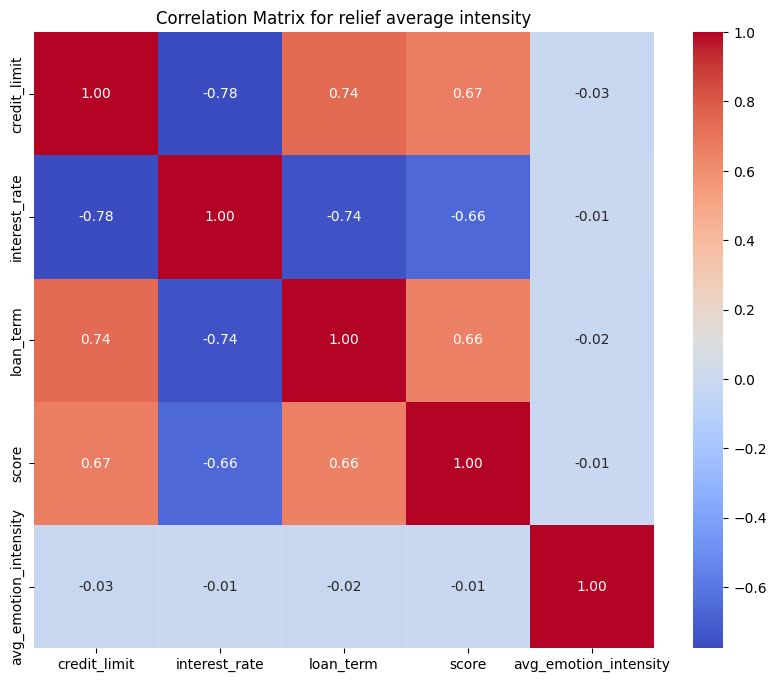


Correlation Matrix for sadness average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.022773       0.052248   0.000466 -0.028952   

                       avg_emotion_intensity  
credit_limit                       -0.022773  
interest_rate                       0.052248  
loan_term                           0.000466  
score                              -0.028952  
avg_emotion_intensity               1.000000  


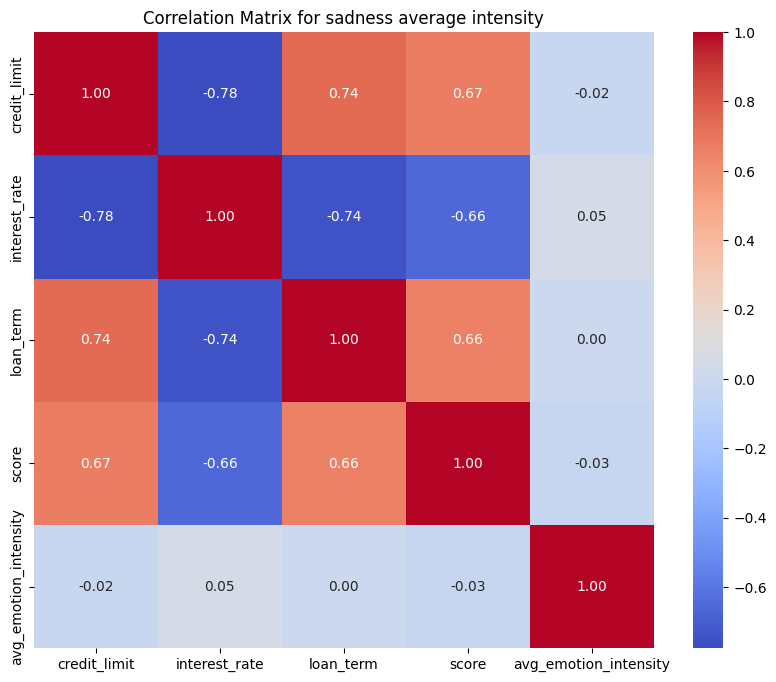


Correlation Matrix for shame average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.010664       0.010697  -0.044345 -0.000528   

                       avg_emotion_intensity  
credit_limit                        0.010664  
interest_rate                       0.010697  
loan_term                          -0.044345  
score                              -0.000528  
avg_emotion_intensity               1.000000  


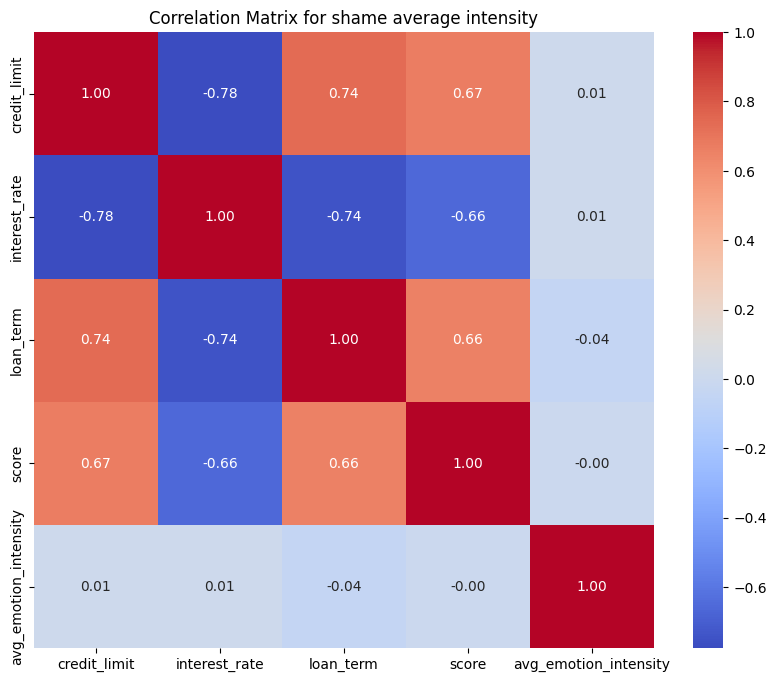


Correlation Matrix for surprise average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity      0.023449      -0.020763  -0.000183  0.017091   

                       avg_emotion_intensity  
credit_limit                        0.023449  
interest_rate                      -0.020763  
loan_term                          -0.000183  
score                               0.017091  
avg_emotion_intensity               1.000000  


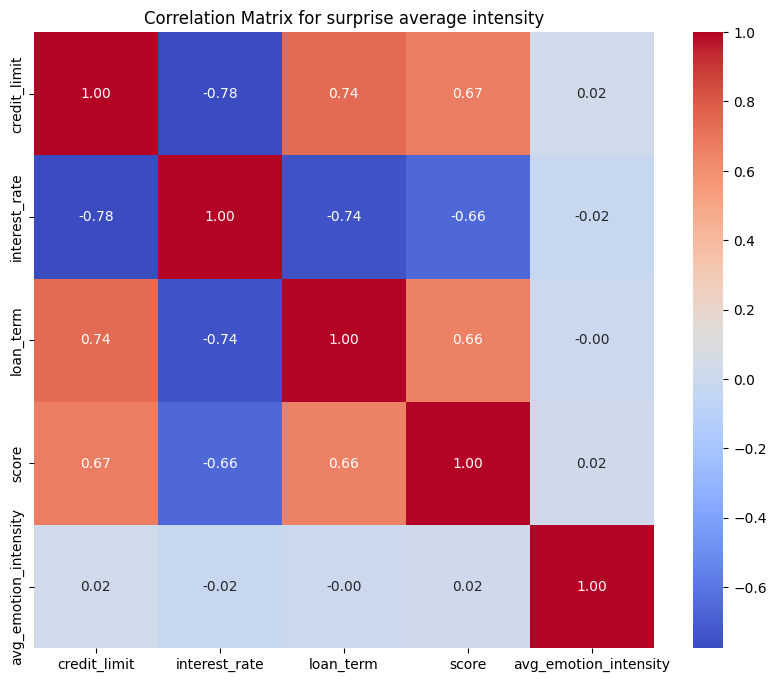


Correlation Matrix for trust average intensity:
                       credit_limit  interest_rate  loan_term     score  \
credit_limit               1.000000      -0.776246   0.740227  0.669313   
interest_rate             -0.776246       1.000000  -0.742579 -0.664844   
loan_term                  0.740227      -0.742579   1.000000  0.659096   
score                      0.669313      -0.664844   0.659096  1.000000   
avg_emotion_intensity     -0.084690       0.063269  -0.076779 -0.029046   

                       avg_emotion_intensity  
credit_limit                       -0.084690  
interest_rate                       0.063269  
loan_term                          -0.076779  
score                              -0.029046  
avg_emotion_intensity               1.000000  


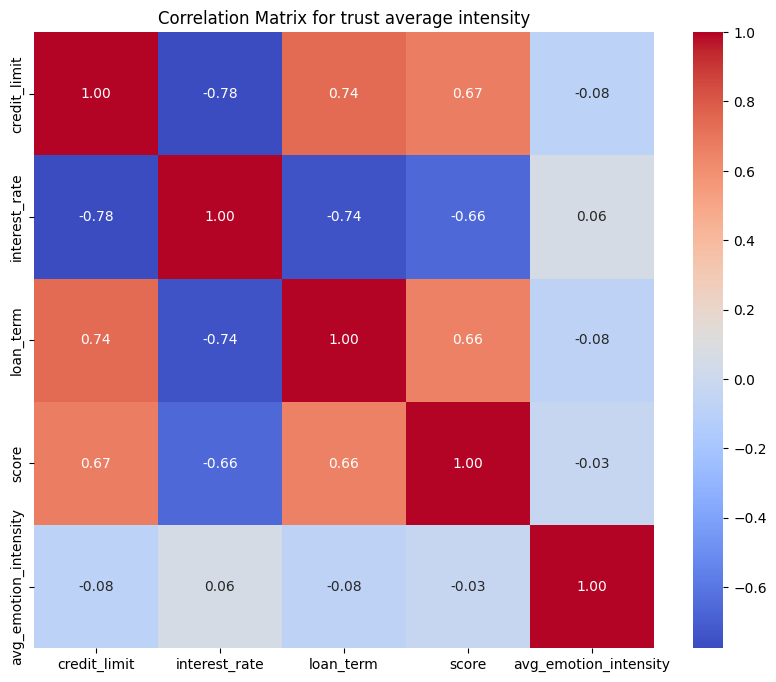

Cell execution took 17.5239 seconds.


In [3]:
# Correlation matrix for average emotion intensity of a given emotion and
# loan terms (credit limit, interest, loan term, score)

start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch emotional data and user data from the database
query = """
SELECT
  e.user_id,
  e.primary_emotion,
  u.credit_limit,
  u.interest_rate,
  u.loan_term,
  u.score
FROM emotional_data AS e
JOIN users AS u ON e.user_id = u.user_id;
"""

query = """
SELECT
  e.user_id,
  e.primary_emotion,
  AVG(e.intensity) AS avg_emotion_intensity,  -- Average emotion intensity for the user and emotion combination
  u.credit_limit,
  u.interest_rate,
  u.loan_term,
  u.score
FROM emotional_data AS e
JOIN users AS u ON e.user_id = u.user_id
GROUP BY e.user_id, e.primary_emotion;
"""

df_emotion_user = pd.read_sql_query(query, conn)

emotions = df_emotion_user['primary_emotion'].unique()

# Iterate through each primary emotion and create a correlation matrix
for emotion in emotions:
  df_emotion = df_emotion_user[df_emotion_user['primary_emotion'] == emotion]
  df_correlation = df_emotion[['credit_limit', 'interest_rate', 'loan_term', 'score', "avg_emotion_intensity"]].corr()
  print(f"\nCorrelation Matrix for {emotion} average intensity:")
  print(df_correlation)
  plt.figure(figsize=(10, 8))
  sns.heatmap(df_correlation, annot=True, cmap='coolwarm', fmt=".2f")
  plt.title(f'Correlation Matrix for {emotion} average intensity')
  plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")

Average emotion intensity is generally not strongly correlated to loan terms such as credit limit, interest rate, loan term and score, as demonstrated by the correlation matrixes above.


Correlation Matrix for amusement frequency:
               credit_limit  interest_rate  loan_term     score  amusement
credit_limit       1.000000      -0.776246   0.740227  0.669313  -0.034932
interest_rate     -0.776246       1.000000  -0.742579 -0.664844   0.014691
loan_term          0.740227      -0.742579   1.000000  0.659096  -0.009899
score              0.669313      -0.664844   0.659096  1.000000   0.005597
amusement         -0.034932       0.014691  -0.009899  0.005597   1.000000


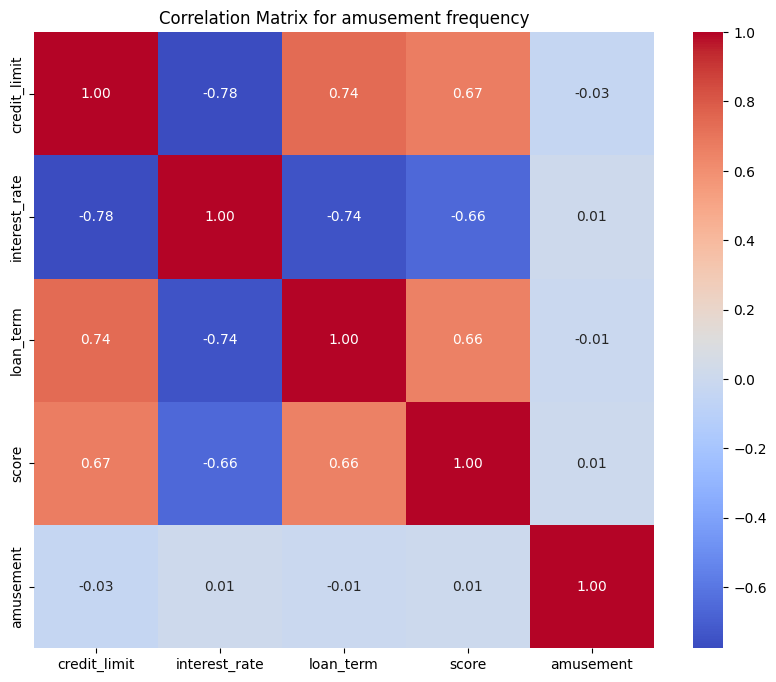


Correlation Matrix for anticipation frequency:
               credit_limit  interest_rate  loan_term     score  anticipation
credit_limit       1.000000      -0.776246   0.740227  0.669313      0.041382
interest_rate     -0.776246       1.000000  -0.742579 -0.664844     -0.039516
loan_term          0.740227      -0.742579   1.000000  0.659096      0.015199
score              0.669313      -0.664844   0.659096  1.000000      0.065316
anticipation       0.041382      -0.039516   0.015199  0.065316      1.000000


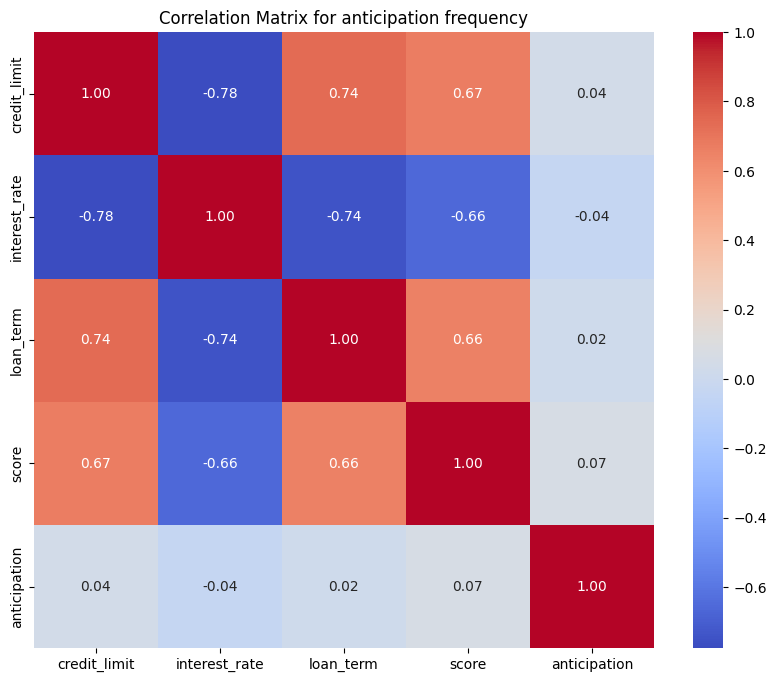


Correlation Matrix for anxiety frequency:
               credit_limit  interest_rate  loan_term     score   anxiety
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.020593
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.019887
loan_term          0.740227      -0.742579   1.000000  0.659096 -0.004231
score              0.669313      -0.664844   0.659096  1.000000  0.019339
anxiety           -0.020593       0.019887  -0.004231  0.019339  1.000000


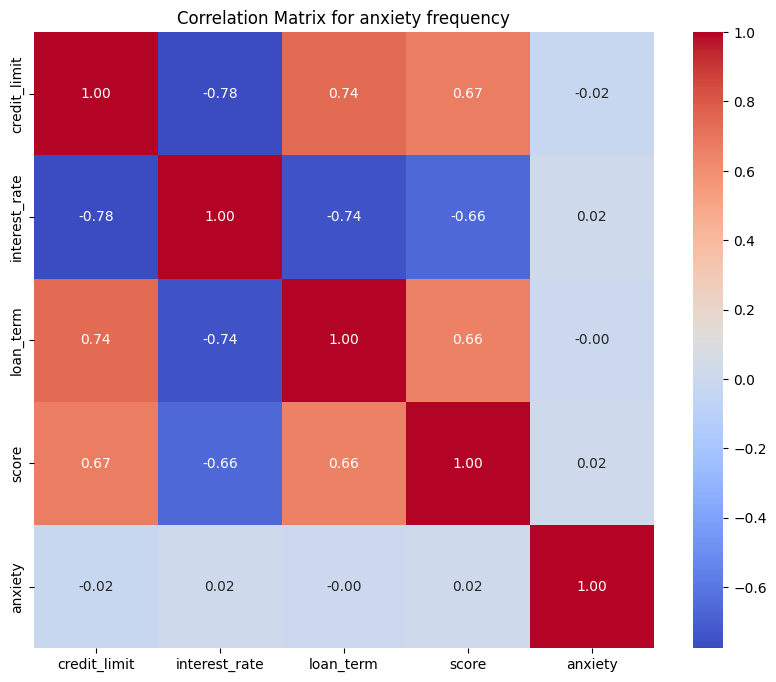


Correlation Matrix for boredom frequency:
               credit_limit  interest_rate  loan_term     score   boredom
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.067218
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.044698
loan_term          0.740227      -0.742579   1.000000  0.659096 -0.011048
score              0.669313      -0.664844   0.659096  1.000000 -0.052764
boredom           -0.067218       0.044698  -0.011048 -0.052764  1.000000


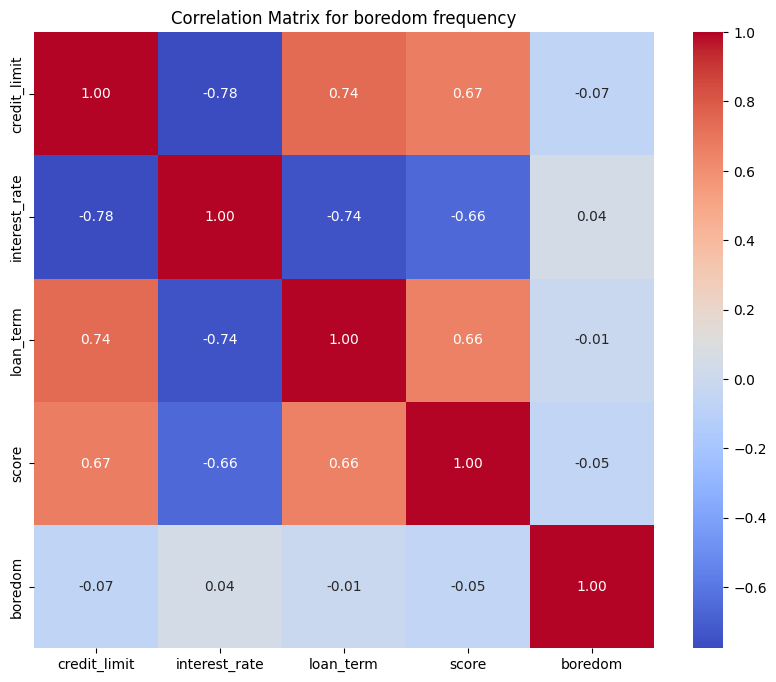


Correlation Matrix for confusion frequency:
               credit_limit  interest_rate  loan_term     score  confusion
credit_limit       1.000000      -0.776246   0.740227  0.669313   0.072979
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  -0.004142
loan_term          0.740227      -0.742579   1.000000  0.659096   0.004245
score              0.669313      -0.664844   0.659096  1.000000   0.035567
confusion          0.072979      -0.004142   0.004245  0.035567   1.000000


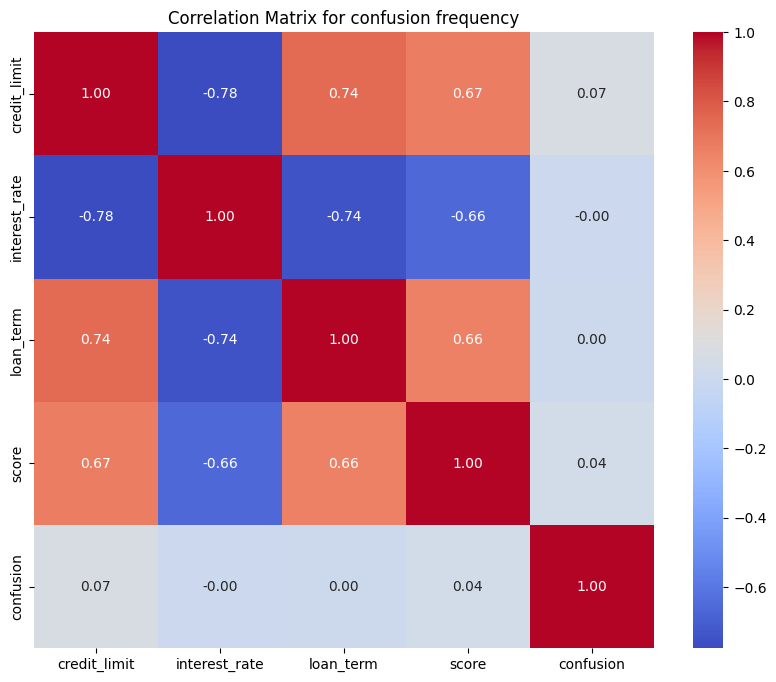


Correlation Matrix for contempt frequency:
               credit_limit  interest_rate  loan_term     score  contempt
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.003967
interest_rate     -0.776246       1.000000  -0.742579 -0.664844 -0.005701
loan_term          0.740227      -0.742579   1.000000  0.659096 -0.001244
score              0.669313      -0.664844   0.659096  1.000000  0.026920
contempt          -0.003967      -0.005701  -0.001244  0.026920  1.000000


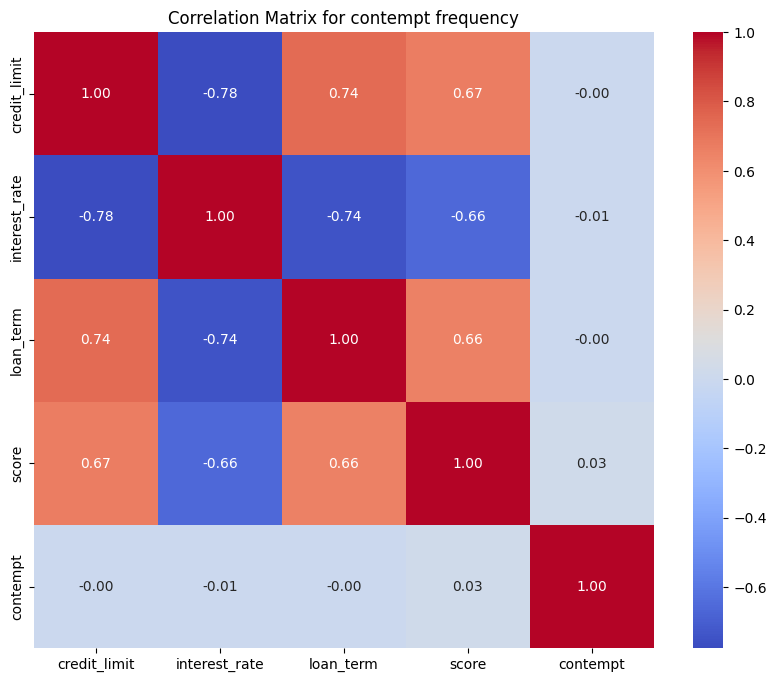


Correlation Matrix for disgust frequency:
               credit_limit  interest_rate  loan_term     score   disgust
credit_limit       1.000000      -0.776246   0.740227  0.669313  0.056206
interest_rate     -0.776246       1.000000  -0.742579 -0.664844 -0.010745
loan_term          0.740227      -0.742579   1.000000  0.659096  0.015886
score              0.669313      -0.664844   0.659096  1.000000  0.029988
disgust            0.056206      -0.010745   0.015886  0.029988  1.000000


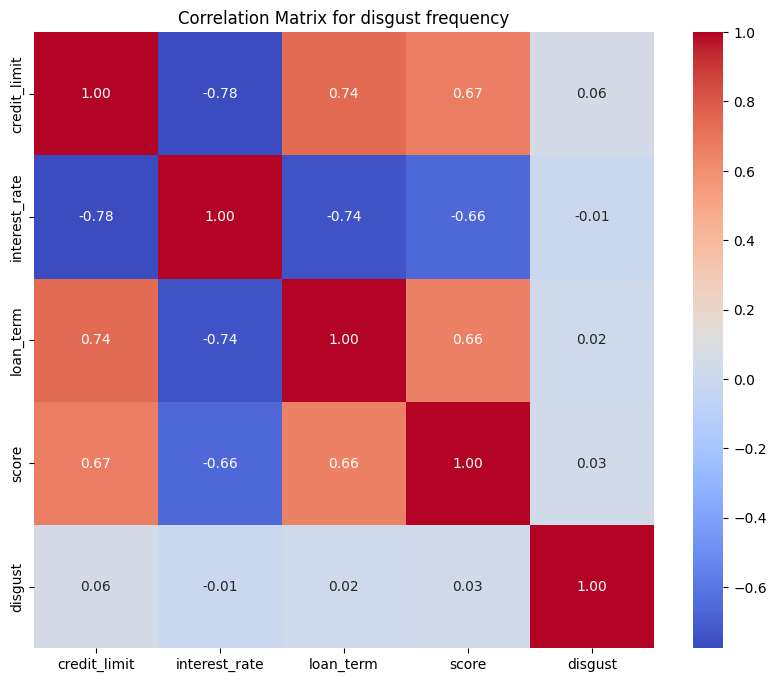


Correlation Matrix for fear frequency:
               credit_limit  interest_rate  loan_term     score      fear
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.034457
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.042912
loan_term          0.740227      -0.742579   1.000000  0.659096 -0.030136
score              0.669313      -0.664844   0.659096  1.000000 -0.032481
fear              -0.034457       0.042912  -0.030136 -0.032481  1.000000


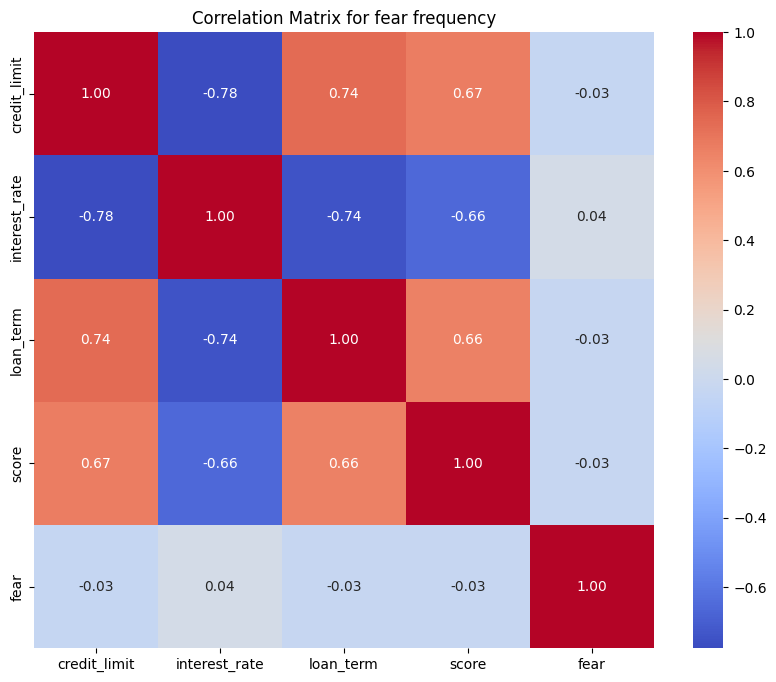


Correlation Matrix for frustration frequency:
               credit_limit  interest_rate  loan_term     score  frustration
credit_limit       1.000000      -0.776246   0.740227  0.669313    -0.063945
interest_rate     -0.776246       1.000000  -0.742579 -0.664844     0.035424
loan_term          0.740227      -0.742579   1.000000  0.659096    -0.065488
score              0.669313      -0.664844   0.659096  1.000000    -0.083672
frustration       -0.063945       0.035424  -0.065488 -0.083672     1.000000


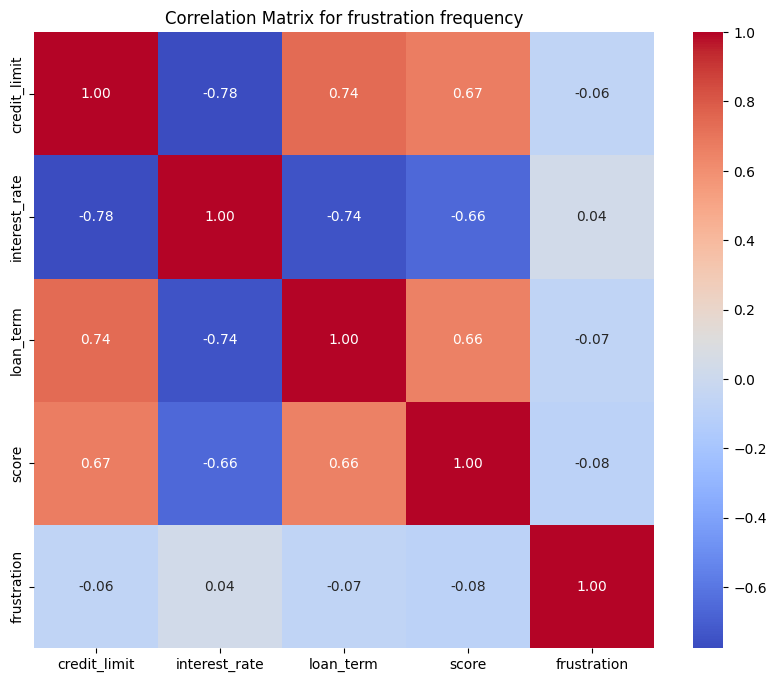


Correlation Matrix for guilt frequency:
               credit_limit  interest_rate  loan_term     score     guilt
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.027114
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.004707
loan_term          0.740227      -0.742579   1.000000  0.659096  0.016565
score              0.669313      -0.664844   0.659096  1.000000  0.030929
guilt             -0.027114       0.004707   0.016565  0.030929  1.000000


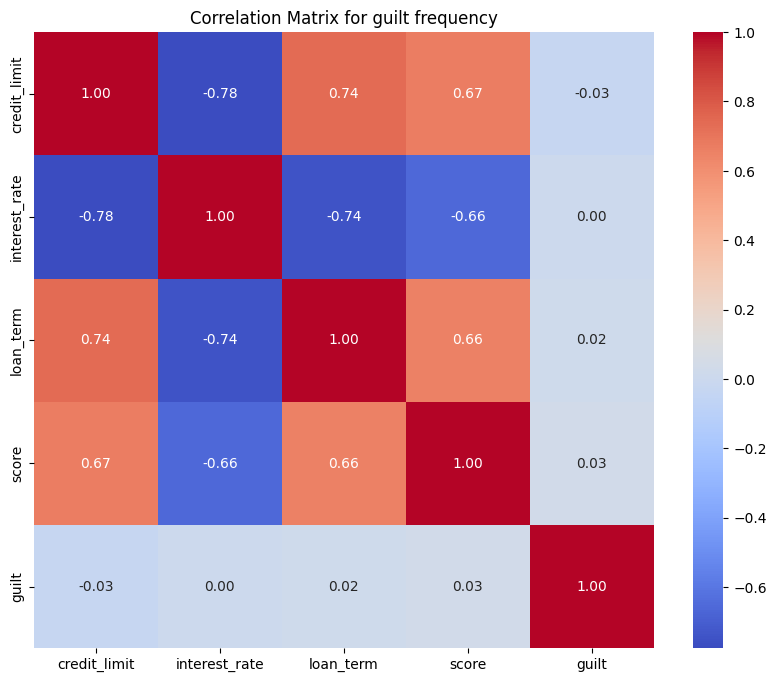


Correlation Matrix for jealousy frequency:
               credit_limit  interest_rate  loan_term     score  jealousy
credit_limit       1.000000      -0.776246   0.740227  0.669313  0.018217
interest_rate     -0.776246       1.000000  -0.742579 -0.664844 -0.023651
loan_term          0.740227      -0.742579   1.000000  0.659096  0.002789
score              0.669313      -0.664844   0.659096  1.000000 -0.022176
jealousy           0.018217      -0.023651   0.002789 -0.022176  1.000000


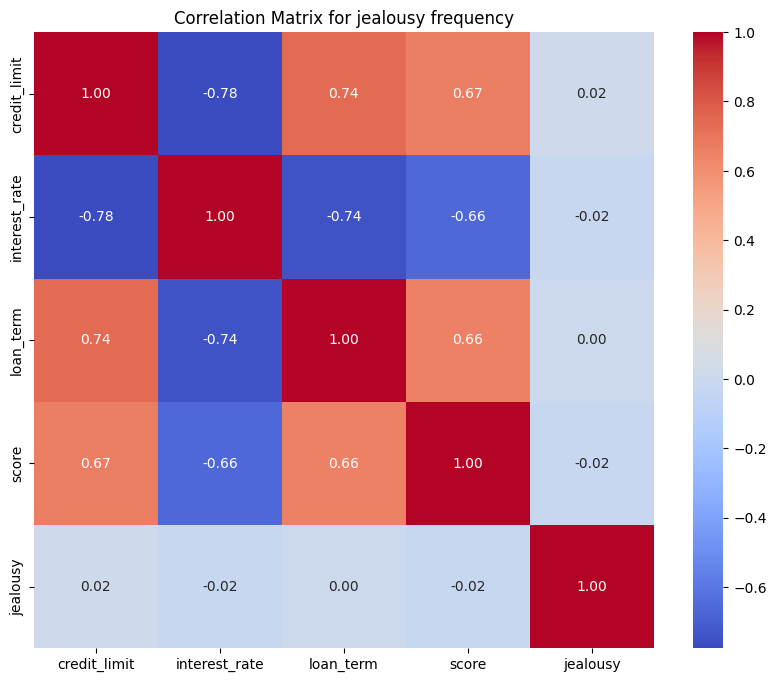


Correlation Matrix for joy frequency:
               credit_limit  interest_rate  loan_term     score       joy
credit_limit       1.000000      -0.776246   0.740227  0.669313  0.064212
interest_rate     -0.776246       1.000000  -0.742579 -0.664844 -0.029169
loan_term          0.740227      -0.742579   1.000000  0.659096  0.060511
score              0.669313      -0.664844   0.659096  1.000000  0.033435
joy                0.064212      -0.029169   0.060511  0.033435  1.000000


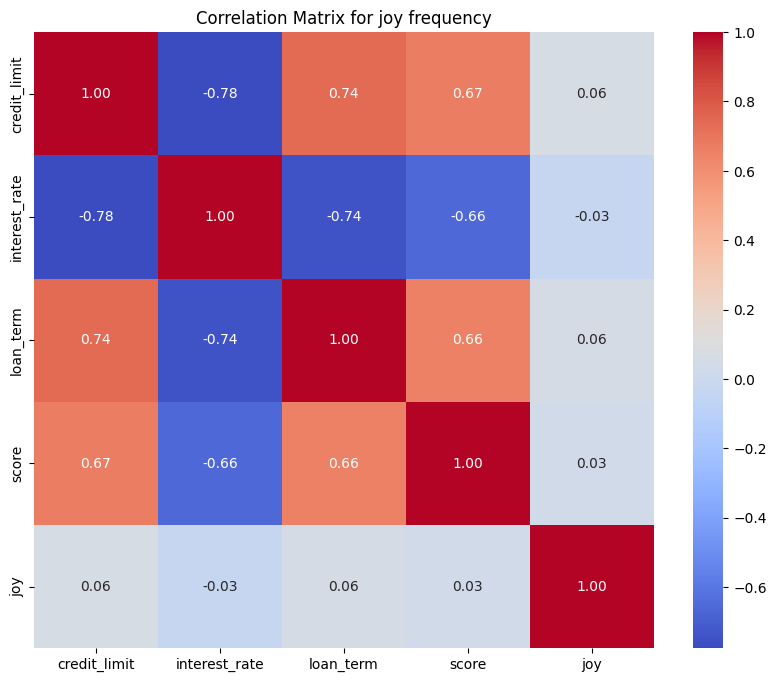


Correlation Matrix for love frequency:
               credit_limit  interest_rate  loan_term     score      love
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.041311
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.016430
loan_term          0.740227      -0.742579   1.000000  0.659096 -0.059059
score              0.669313      -0.664844   0.659096  1.000000 -0.065173
love              -0.041311       0.016430  -0.059059 -0.065173  1.000000


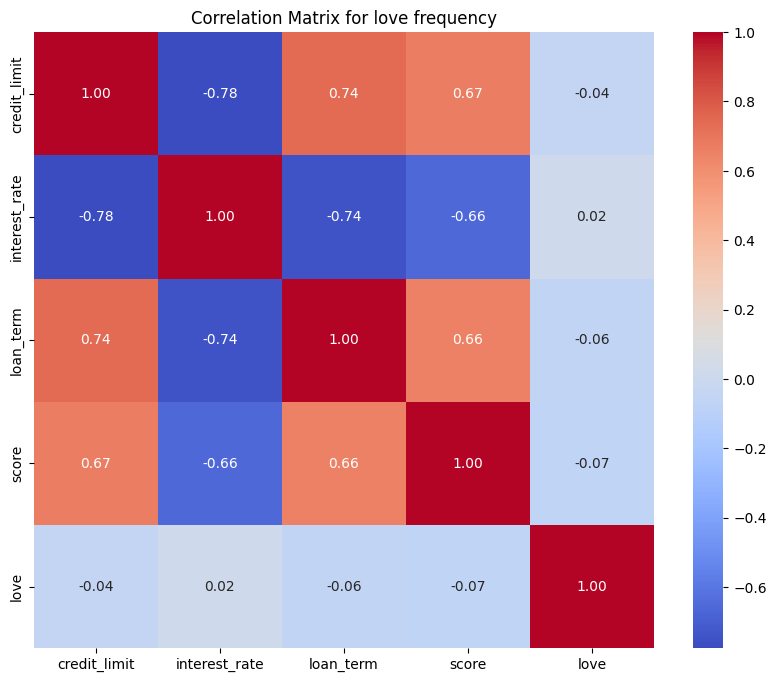


Correlation Matrix for pride frequency:
               credit_limit  interest_rate  loan_term     score     pride
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.021327
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.013686
loan_term          0.740227      -0.742579   1.000000  0.659096 -0.052337
score              0.669313      -0.664844   0.659096  1.000000  0.012563
pride             -0.021327       0.013686  -0.052337  0.012563  1.000000


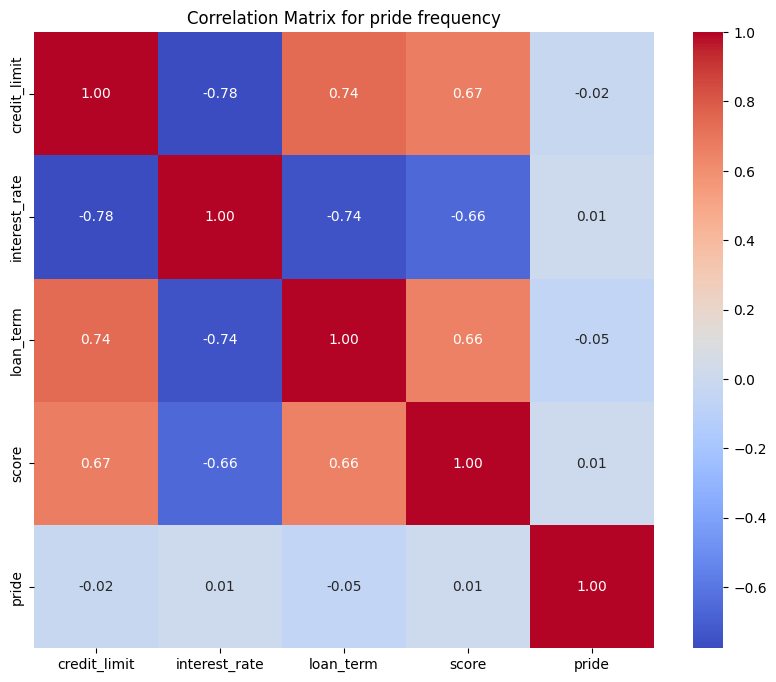


Correlation Matrix for relief frequency:
               credit_limit  interest_rate  loan_term     score    relief
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.024607
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.022741
loan_term          0.740227      -0.742579   1.000000  0.659096  0.023713
score              0.669313      -0.664844   0.659096  1.000000 -0.031986
relief            -0.024607       0.022741   0.023713 -0.031986  1.000000


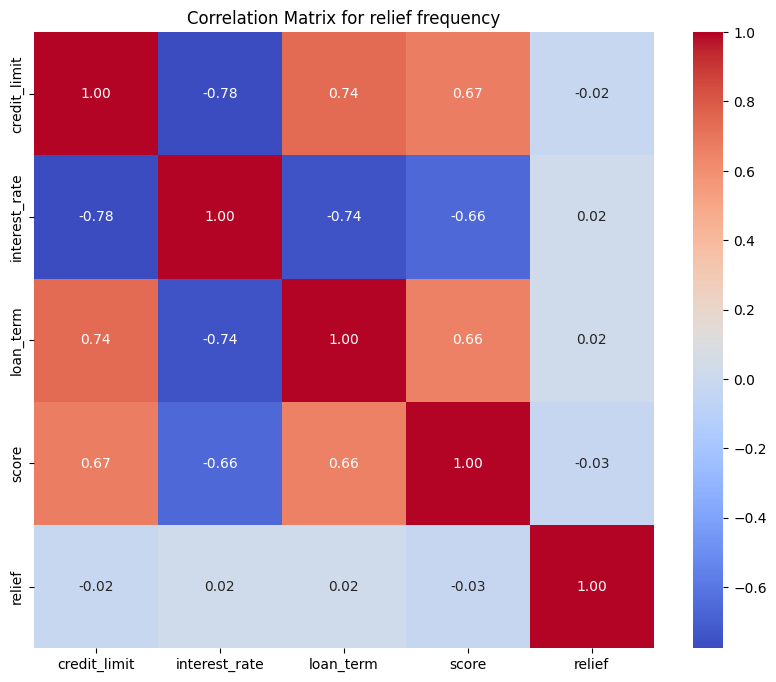


Correlation Matrix for sadness frequency:
               credit_limit  interest_rate  loan_term     score   sadness
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.033471
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.008790
loan_term          0.740227      -0.742579   1.000000  0.659096  0.004386
score              0.669313      -0.664844   0.659096  1.000000  0.009274
sadness           -0.033471       0.008790   0.004386  0.009274  1.000000


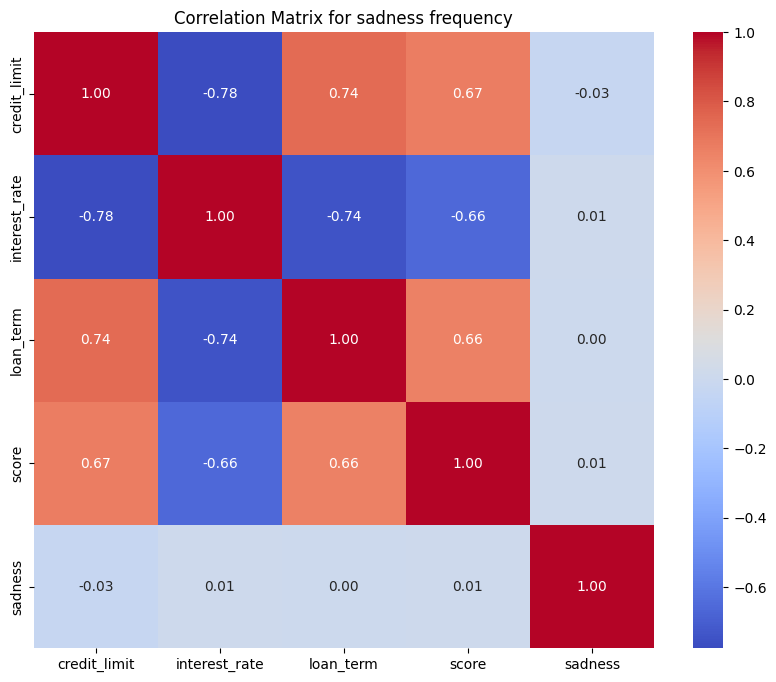


Correlation Matrix for shame frequency:
               credit_limit  interest_rate  loan_term     score     shame
credit_limit       1.000000      -0.776246   0.740227  0.669313  0.052979
interest_rate     -0.776246       1.000000  -0.742579 -0.664844 -0.025058
loan_term          0.740227      -0.742579   1.000000  0.659096  0.070321
score              0.669313      -0.664844   0.659096  1.000000  0.077808
shame              0.052979      -0.025058   0.070321  0.077808  1.000000


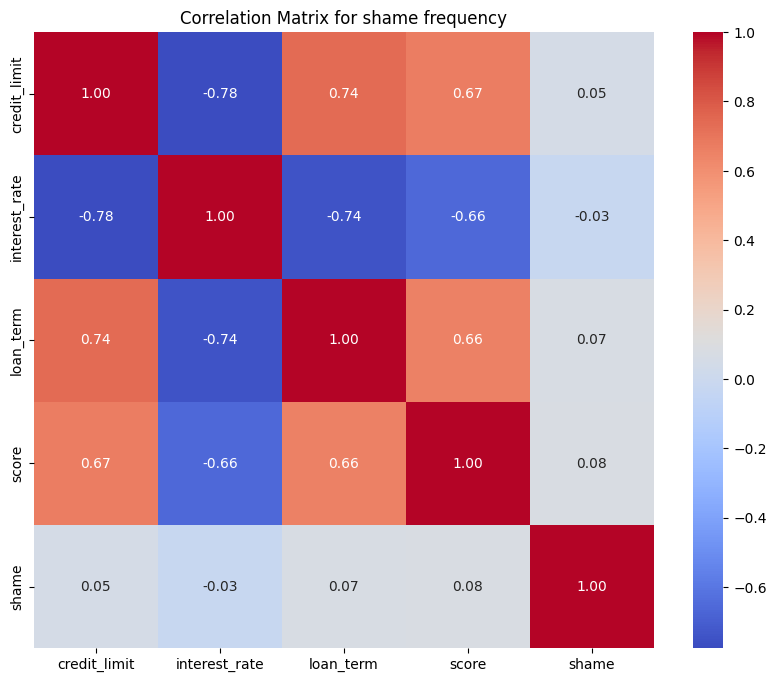


Correlation Matrix for surprise frequency:
               credit_limit  interest_rate  loan_term     score  surprise
credit_limit       1.000000      -0.776246   0.740227  0.669313 -0.003442
interest_rate     -0.776246       1.000000  -0.742579 -0.664844  0.002286
loan_term          0.740227      -0.742579   1.000000  0.659096 -0.017688
score              0.669313      -0.664844   0.659096  1.000000 -0.032939
surprise          -0.003442       0.002286  -0.017688 -0.032939  1.000000


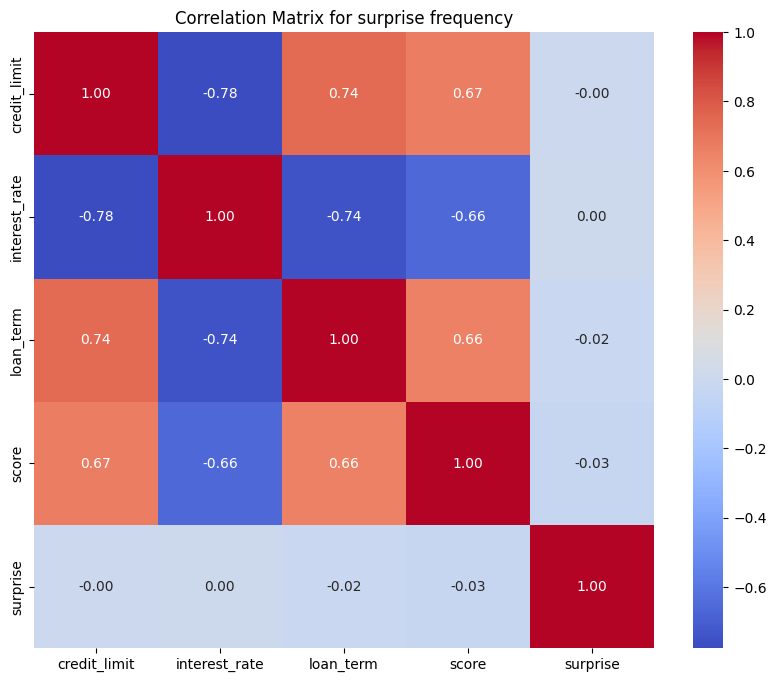


Correlation Matrix for trust frequency:
               credit_limit  interest_rate  loan_term     score     trust
credit_limit       1.000000      -0.776246   0.740227  0.669313  0.042138
interest_rate     -0.776246       1.000000  -0.742579 -0.664844 -0.039950
loan_term          0.740227      -0.742579   1.000000  0.659096  0.022719
score              0.669313      -0.664844   0.659096  1.000000 -0.030059
trust              0.042138      -0.039950   0.022719 -0.030059  1.000000


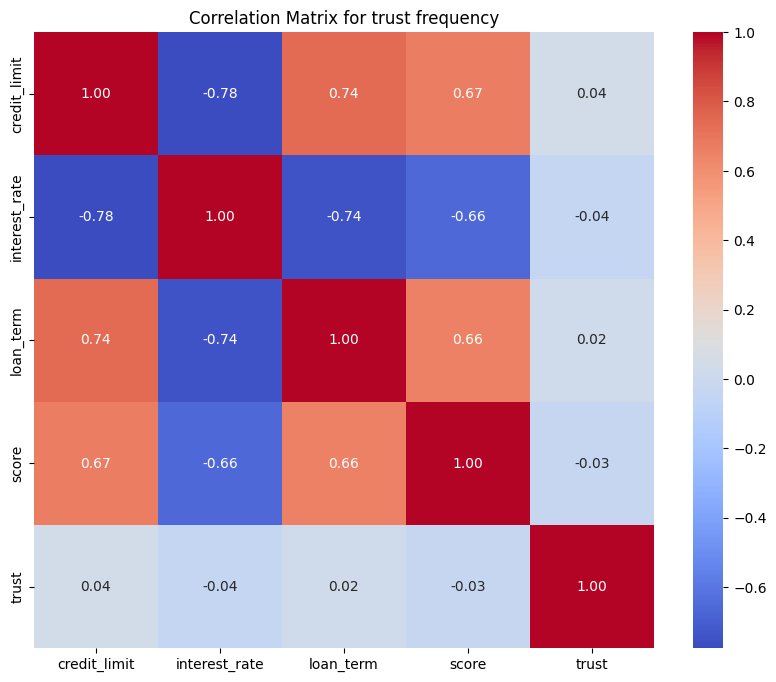

Cell execution took 19.6321 seconds.


In [4]:
# Correlation matrix for emotion frequency of a given emotion for a user and their
# loan terms (credit limit, interest, loan term, score)

# prompt: Create 1 correlation matrix for each primary_emotion, while correlating emotion frequency (as % of total) for users with other variables such as (credit limit, interest rate, loan term, score).

start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch emotional data and user data from the database
query = """
SELECT
  e.user_id,
  e.primary_emotion,
  u.credit_limit,
  u.interest_rate,
  u.loan_term,
  u.score
FROM emotional_data AS e
JOIN users AS u ON e.user_id = u.user_id;
"""
df_emotion_user = pd.read_sql_query(query, conn)

# Group by user_id and primary_emotion to get emotion counts for each user
emotion_counts_per_user = df_emotion_user.groupby(['user_id', 'primary_emotion'])['primary_emotion'].count().unstack().fillna(0)

# Calculate the total emotion count for each user
total_emotion_counts_per_user = emotion_counts_per_user.sum(axis=1)

# Calculate the percentage of each emotion for each user
emotion_percentages_per_user = emotion_counts_per_user.div(total_emotion_counts_per_user, axis=0) * 100

# Merge emotion percentages with user data
df_merged = pd.merge(emotion_percentages_per_user, df_emotion_user[['user_id', 'credit_limit', 'interest_rate', 'loan_term', 'score']], on='user_id', how='left')
df_merged = df_merged.drop_duplicates(subset=['user_id'])

# Iterate through each primary emotion and create a correlation matrix
for emotion in df_merged.columns:
  if emotion != 'user_id' and emotion != 'credit_limit' and emotion != 'interest_rate' and emotion != 'loan_term' and emotion != 'score':
    df_correlation = df_merged[['credit_limit', 'interest_rate', 'loan_term', 'score', emotion]].corr()
    print(f"\nCorrelation Matrix for {emotion} frequency:")
    print(df_correlation)
    plt.figure(figsize=(10, 8))
    sns.heatmap(df_correlation, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation Matrix for {emotion} frequency')
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")

As the above correlation matrixes show, the emotions' frequency for each user are also not correlated to the credit limit, interest rate, loan term or score.

       user_id  emotion_count primary_emotion  number_of_loans  \
0            1            267       amusement                3   
1            1            284    anticipation                3   
2            1             36         anxiety                3   
3            1            130         boredom                3   
4            1            107       confusion                3   
...        ...            ...             ...              ...   
11889      734            252          relief                3   
11890      734            136         sadness                3   
11891      734            105           shame                3   
11892      734            216        surprise                3   
11893      734            266           trust                3   

       total_loan_amount  emotion_frequency  
0                  61209           0.081626  
1                  61209           0.086824  
2                  61209           0.011006  
3                  6120

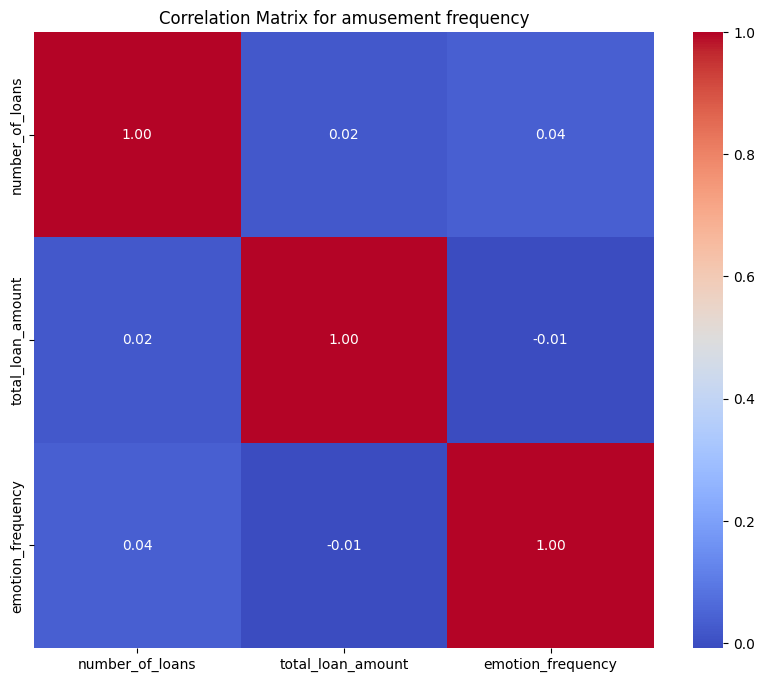


Correlation Matrix for anticipation frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.023578
total_loan_amount         0.022606           1.000000           0.050979
emotion_frequency        -0.023578           0.050979           1.000000


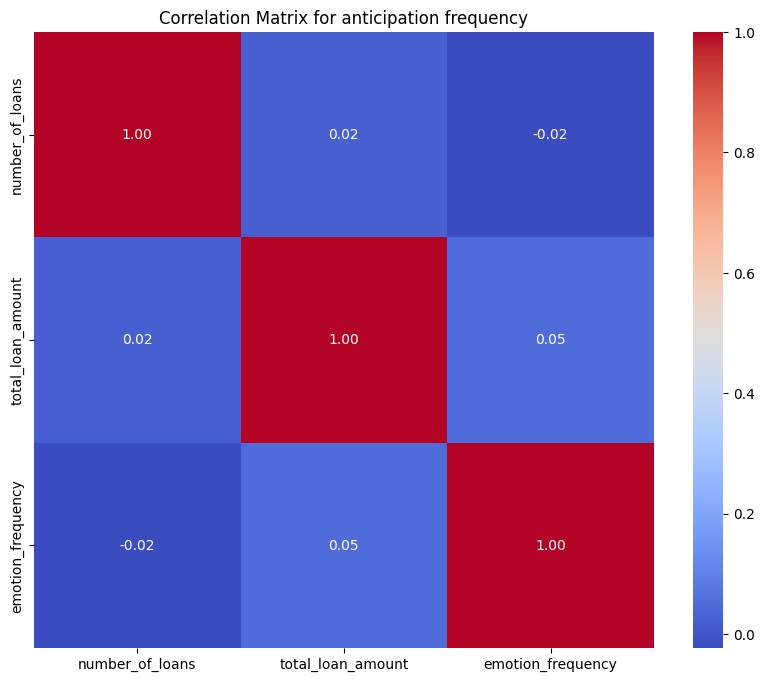


Correlation Matrix for anxiety frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.084033
total_loan_amount         0.022606           1.000000          -0.013363
emotion_frequency         0.084033          -0.013363           1.000000


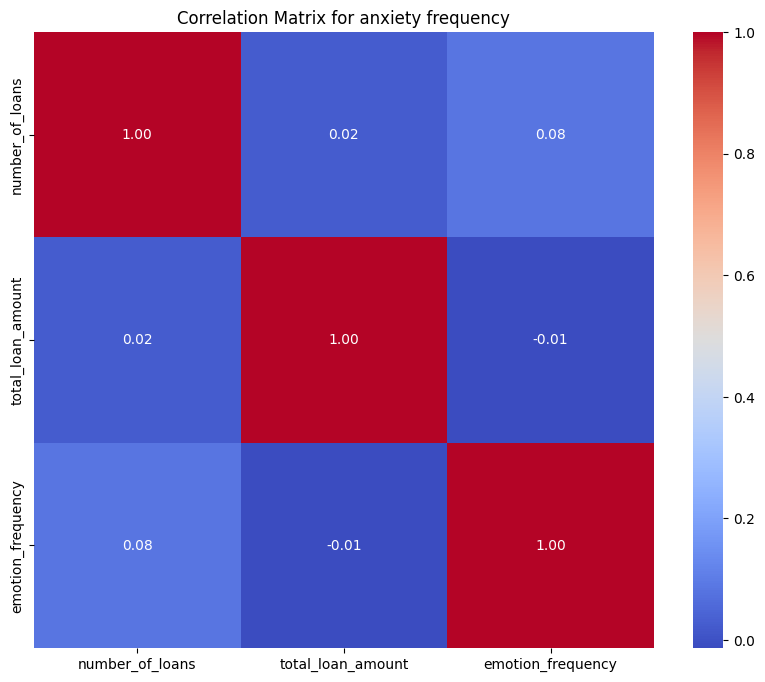


Correlation Matrix for boredom frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.059534
total_loan_amount         0.022606           1.000000          -0.041796
emotion_frequency         0.059534          -0.041796           1.000000


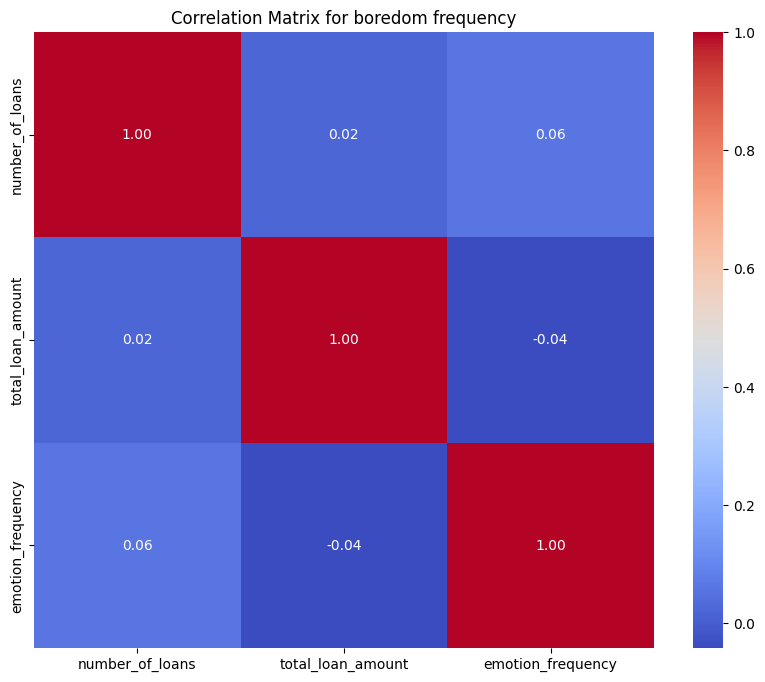


Correlation Matrix for confusion frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.083125
total_loan_amount         0.022606           1.000000           0.116980
emotion_frequency         0.083125           0.116980           1.000000


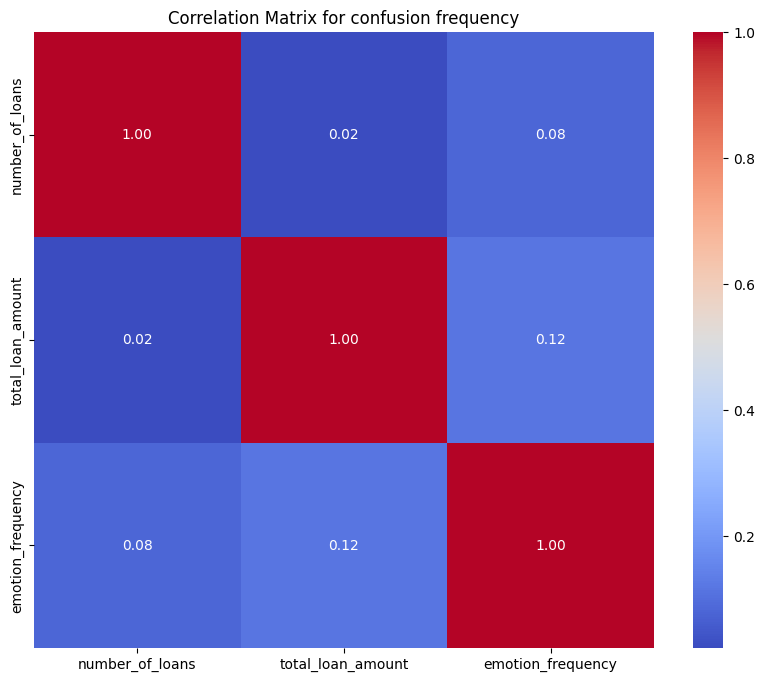


Correlation Matrix for contempt frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.005633
total_loan_amount         0.022606           1.000000          -0.001641
emotion_frequency         0.005633          -0.001641           1.000000


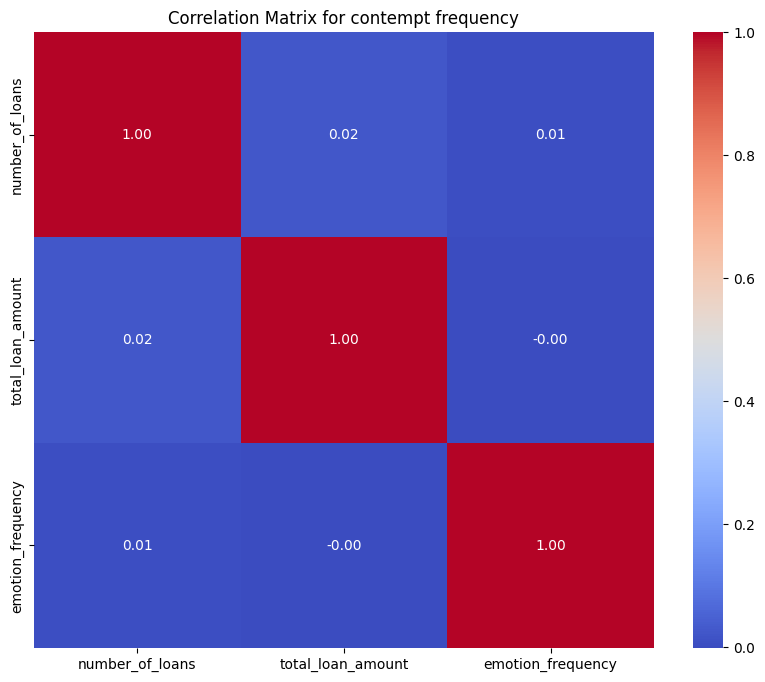


Correlation Matrix for disgust frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.042287
total_loan_amount         0.022606           1.000000           0.064171
emotion_frequency         0.042287           0.064171           1.000000


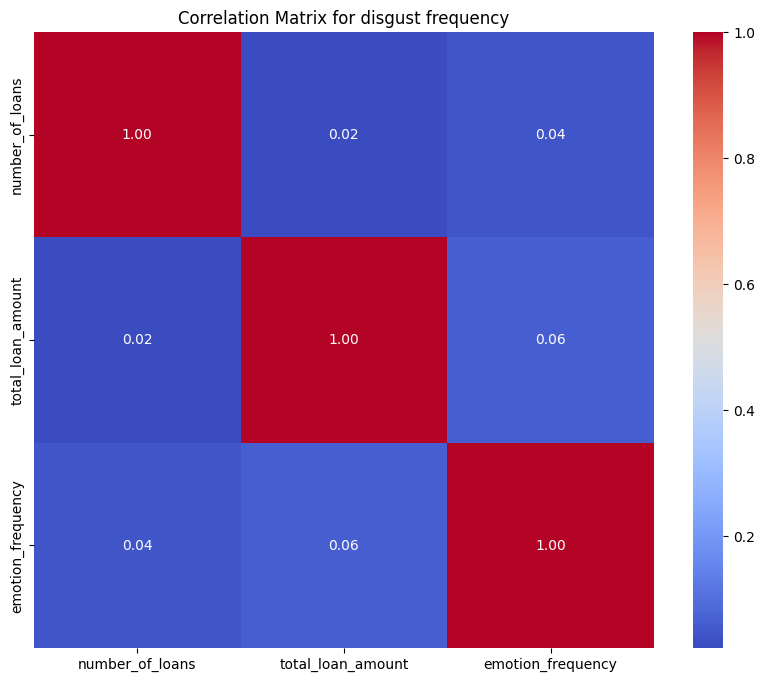


Correlation Matrix for fear frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.055227
total_loan_amount         0.022606           1.000000           0.023759
emotion_frequency         0.055227           0.023759           1.000000


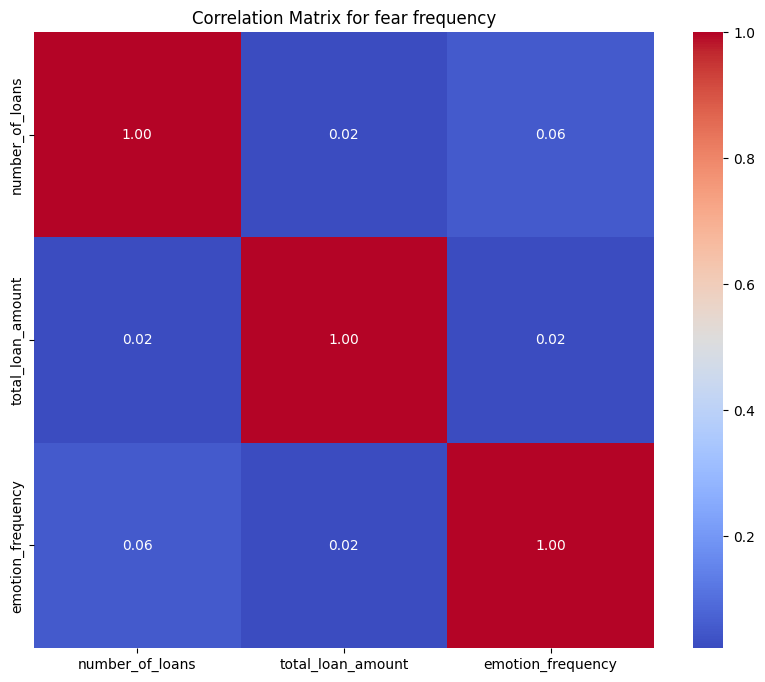


Correlation Matrix for frustration frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.030323
total_loan_amount         0.022606           1.000000          -0.005516
emotion_frequency        -0.030323          -0.005516           1.000000


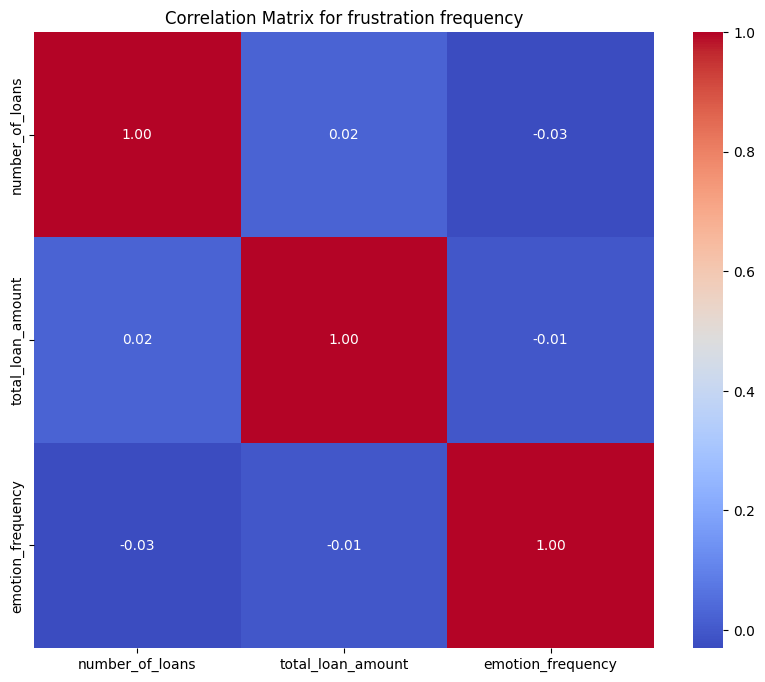


Correlation Matrix for guilt frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.030906
total_loan_amount         0.022606           1.000000          -0.014991
emotion_frequency        -0.030906          -0.014991           1.000000


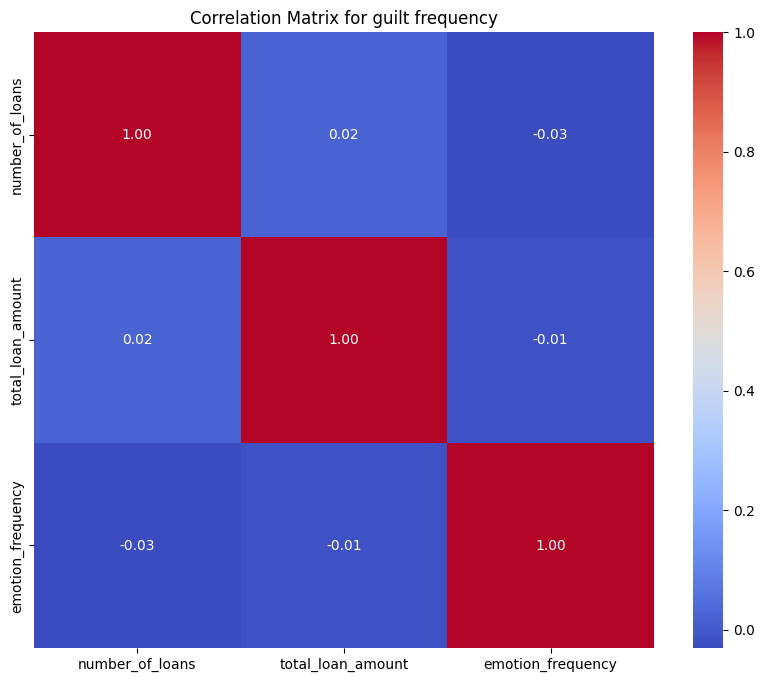


Correlation Matrix for jealousy frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.022525
total_loan_amount         0.022606           1.000000           0.011214
emotion_frequency         0.022525           0.011214           1.000000


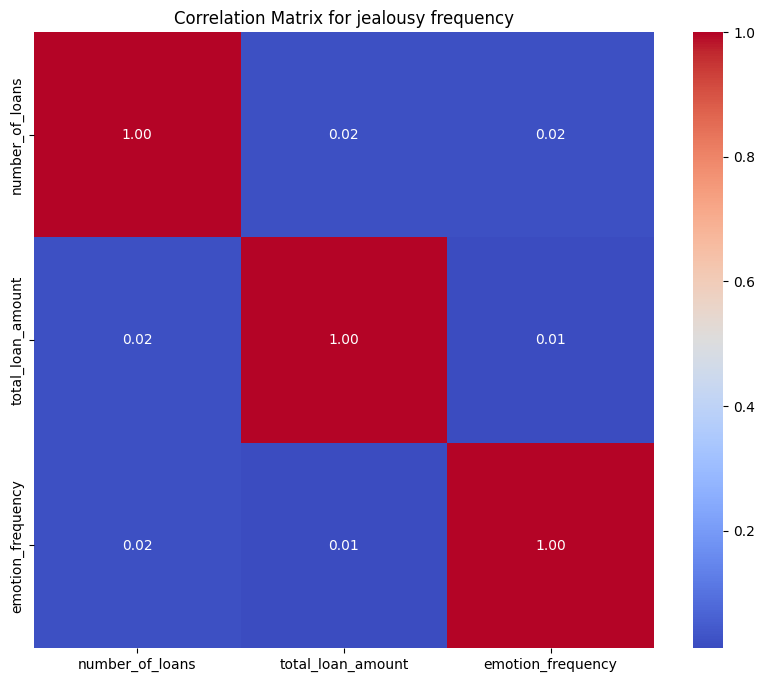


Correlation Matrix for joy frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.037985
total_loan_amount         0.022606           1.000000           0.021794
emotion_frequency        -0.037985           0.021794           1.000000


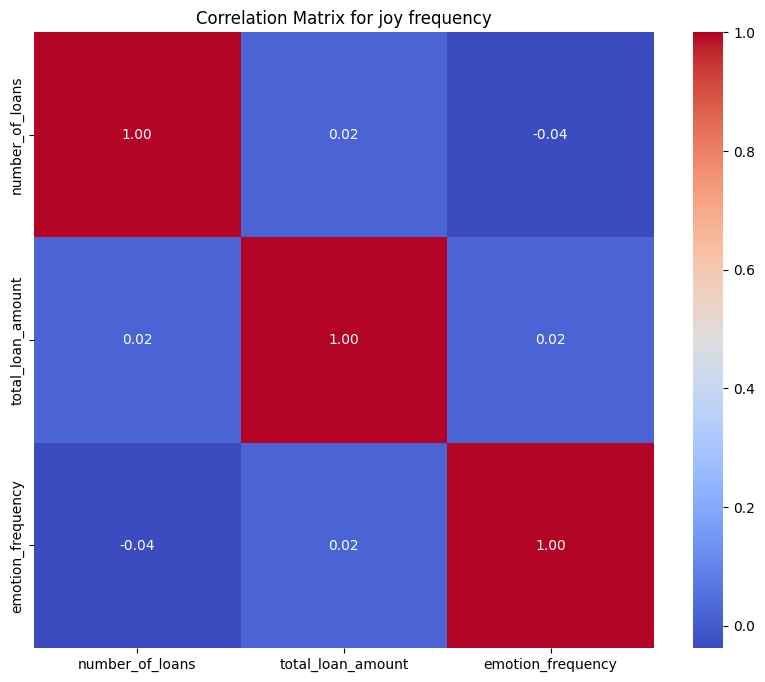


Correlation Matrix for love frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.009490
total_loan_amount         0.022606           1.000000          -0.023313
emotion_frequency         0.009490          -0.023313           1.000000


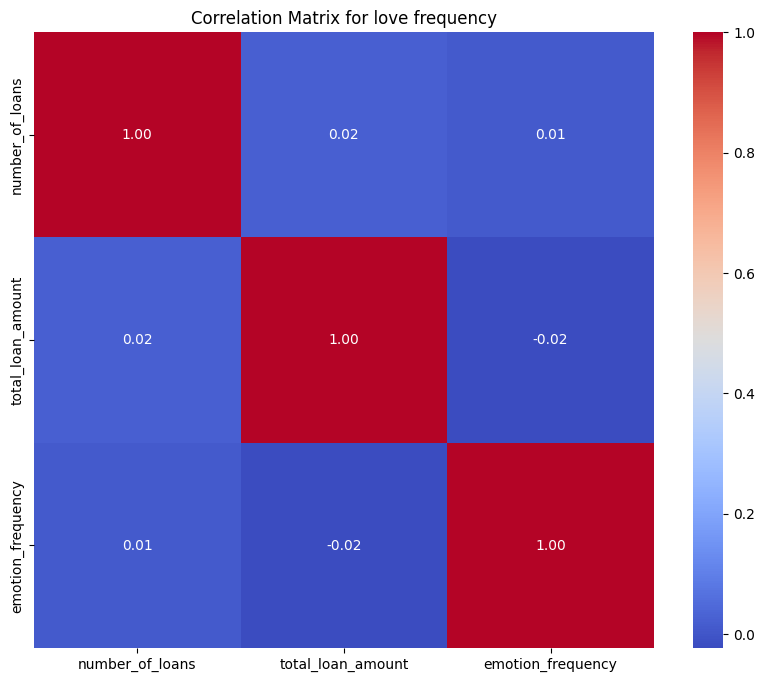


Correlation Matrix for pride frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.023487
total_loan_amount         0.022606           1.000000          -0.055028
emotion_frequency        -0.023487          -0.055028           1.000000


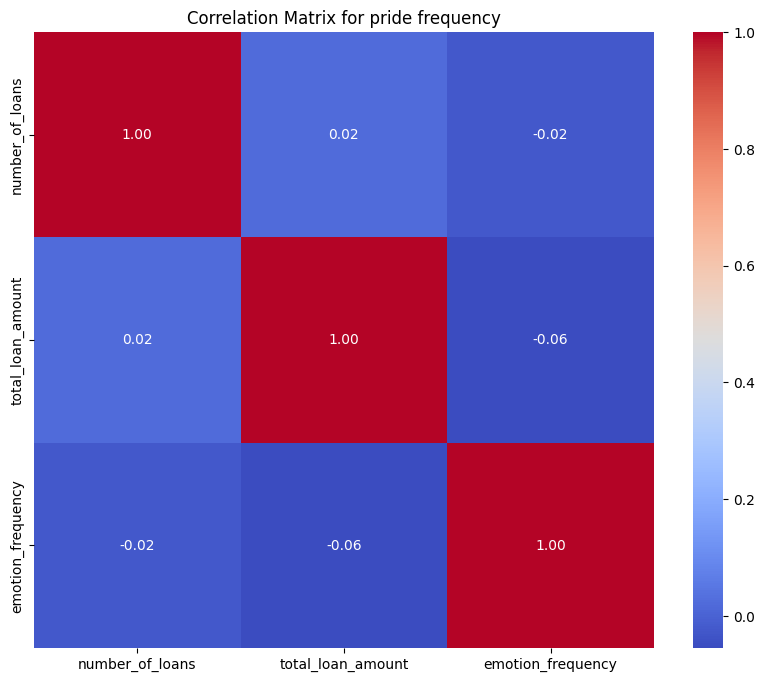


Correlation Matrix for relief frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.048264
total_loan_amount         0.022606           1.000000          -0.059321
emotion_frequency        -0.048264          -0.059321           1.000000


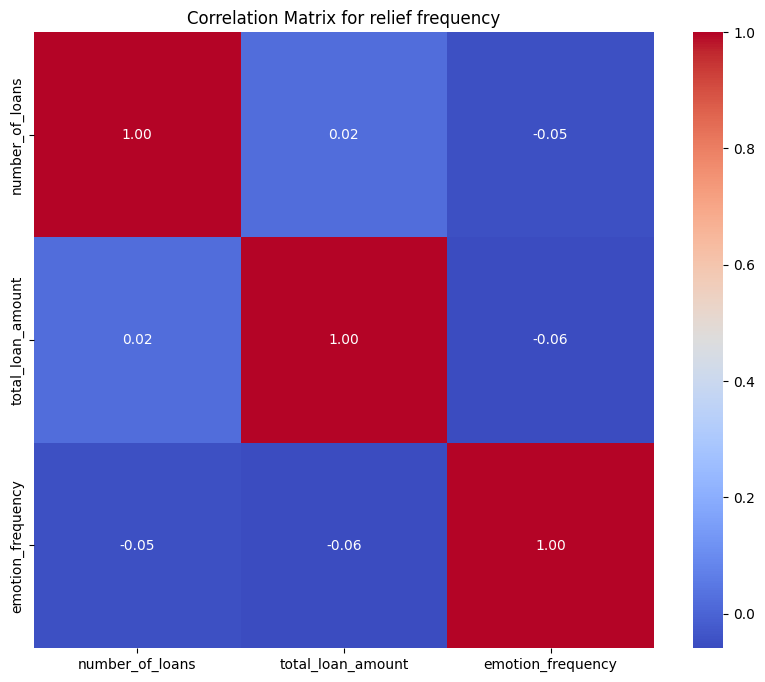


Correlation Matrix for sadness frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606           0.054832
total_loan_amount         0.022606           1.000000           0.009043
emotion_frequency         0.054832           0.009043           1.000000


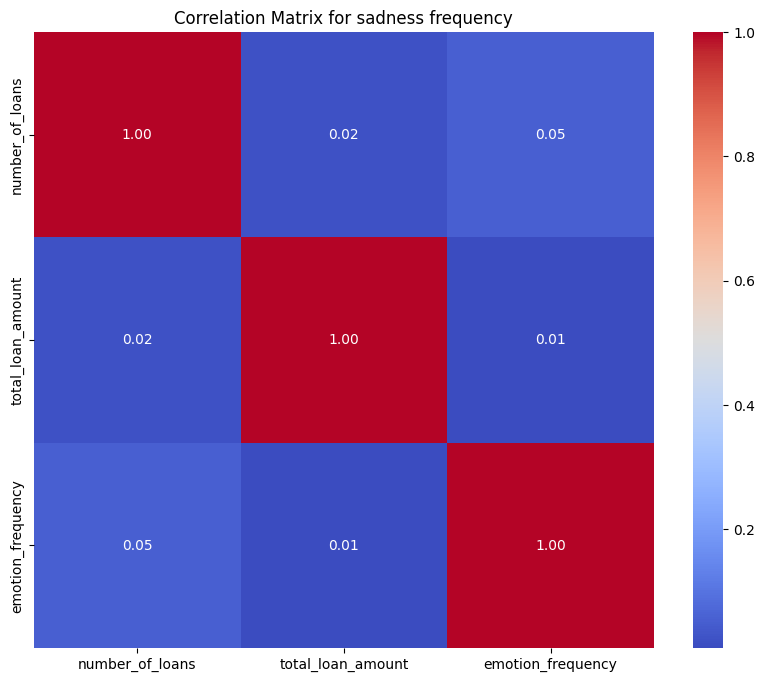


Correlation Matrix for shame frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.005820
total_loan_amount         0.022606           1.000000           0.027562
emotion_frequency        -0.005820           0.027562           1.000000


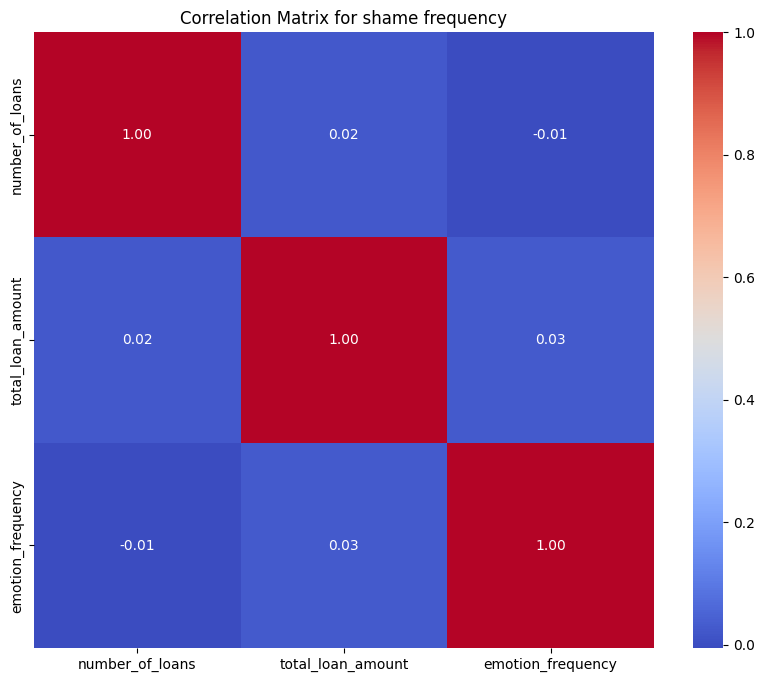


Correlation Matrix for surprise frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.057756
total_loan_amount         0.022606           1.000000          -0.050278
emotion_frequency        -0.057756          -0.050278           1.000000


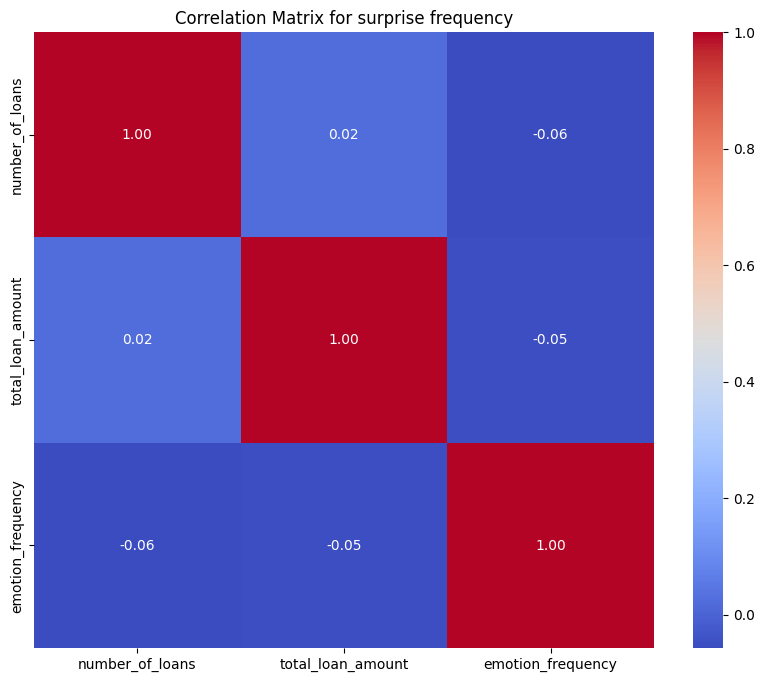


Correlation Matrix for trust frequency:
                   number_of_loans  total_loan_amount  emotion_frequency
number_of_loans           1.000000           0.022606          -0.040815
total_loan_amount         0.022606           1.000000           0.018503
emotion_frequency        -0.040815           0.018503           1.000000


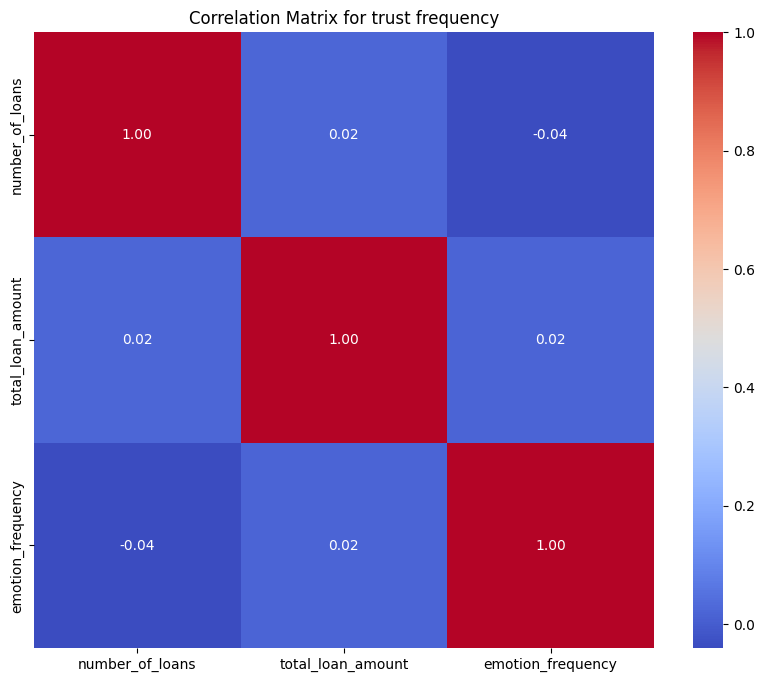

Cell execution took 11.3411 seconds.


In [5]:
# Correlation matrix for emotion frequency of a given emotion for a user and their
# loans' information (number of loans and loan amount)

start_time = time.time()  # Start timing

# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data and user data from the database
query = """
WITH loan_data AS (
  SELECT
    l.user_id,
    COUNT(DISTINCT l.loan_id) AS number_of_loans,
    SUM(l.loan_amount) AS total_loan_amount
  FROM loans AS l
  GROUP BY l.user_id
)

SELECT
  e.user_id,
  COUNT(e.primary_emotion) AS emotion_count,
  e.primary_emotion,
  ld.number_of_loans,
  ld.total_loan_amount,
  COUNT(e.primary_emotion) * 1.0 / SUM(COUNT(e.primary_emotion)) OVER (PARTITION BY e.user_id) AS emotion_frequency
FROM emotional_data AS e
JOIN loan_data AS ld ON e.user_id = ld.user_id
GROUP BY e.user_id, e.primary_emotion;
"""
df_emotion_loan = pd.read_sql_query(query, conn)
print(df_emotion_loan)

emotions = df_emotion_loan['primary_emotion'].unique()

# Iterate through each primary emotion and create a correlation matrix
for emotion in emotions:
    df_emotion_loan_emotion = df_emotion_loan[df_emotion_loan['primary_emotion'] == emotion]
    df_correlation = df_emotion_loan_emotion[['number_of_loans', 'total_loan_amount', "emotion_frequency"]].corr()
    print(f"\nCorrelation Matrix for {emotion} frequency:")
    print(df_correlation)
    plt.figure(figsize=(10, 8))
    sns.heatmap(df_correlation, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation Matrix for {emotion} frequency')
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


The emotion frequency of different emotions are also not correlated to the number of loans for a given user neither by the total loan amount.

In [16]:
start_time = time.time()  # Start timing

# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data and user data from the database
query = """
WITH loan_data AS (
  SELECT
    l.user_id,
    COUNT(DISTINCT l.loan_id) AS number_of_loans,
    SUM(l.loan_amount) AS total_loan_amount

  FROM loans AS l
  GROUP BY l.user_id
)

SELECT
  e.user_id,
  COUNT(e.primary_emotion) AS primary_emotion_count,
  e.primary_emotion,
  ld.number_of_loans,
  ld.total_loan_amount,
  COUNT(e.primary_emotion) * 1.0 / SUM(COUNT(e.primary_emotion)) OVER (PARTITION BY e.user_id) AS primary_emotion_frequency
FROM emotional_data AS e
JOIN loan_data AS ld ON e.user_id = ld.user_id
GROUP BY e.user_id, e.primary_emotion;
"""
df_emotion_loan = pd.read_sql_query(query, conn)
print(df_emotion_loan)

# List of unique primary emotions
emotions = df_emotion_loan['primary_emotion'].unique()

# Iterate through each primary emotion and create scatterplots
for emotion in emotions:
    df_emotion_loan_emotion = df_emotion_loan[df_emotion_loan['primary_emotion'] == emotion]

    # Create scatterplots between different variables
    plt.figure(figsize=(10, 6))

    # Scatterplot for number_of_loans vs primary_emotion_frequency
    plt.figure(figsize=(10, 6))
    plt.scatter(df_emotion_loan_emotion['number_of_loans'], df_emotion_loan_emotion['primary_emotion_frequency'],
                label="Emotion Frequency vs Number of Loans", color='r', alpha=0.6)
    plt.title(f'Scatterplot for {emotion} - Number of Loans vs Emotion Frequency')
    plt.xlabel('Number of Loans')
    plt.ylabel(f'{emotion} Frequency (%)'.title())
    plt.grid(True)
    plt.show()

    # Scatterplot for total_loan_amount vs primary_emotion_frequency
    plt.figure(figsize=(10, 6))
    plt.scatter(df_emotion_loan_emotion['total_loan_amount'], df_emotion_loan_emotion['primary_emotion_frequency'],
                label="Emotion Frequency vs Loan Amount", color='g', alpha=0.6)
    plt.title(f'Scatterplot for {emotion} - Loan Amount vs Emotion Frequency'.title())
    plt.xlabel('Total Loan Amount')
    plt.ylabel(f'{emotion} Frequency (%)'.title())
    plt.grid(True)
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


Output hidden; open in https://colab.research.google.com to view.

As it is possible to observe both by the correlation matrixes and the scatterplots, the emotion frequency of any emotion does not correlate with interest, score, credit limit, loan terms, loan amount or number of loans.

In [37]:
start_time = time.time()  # Start timing

# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data and user data from the database
query = """
SELECT
    e.user_id,
    e.primary_emotion,
    COUNT(DISTINCT l.loan_id) AS number_of_loans,
    SUM(l.loan_amount) AS total_loan_amount,
    AVG(e.intensity) AS avg_emotion_intensity  -- Average emotion intensity for the user and emotion combination
FROM emotional_data AS e
JOIN loans AS l ON e.user_id = l.user_id
GROUP BY e.user_id, e.primary_emotion;
"""
df_emotion_loan = pd.read_sql_query(query, conn)
print(df_emotion_loan)

# List of unique primary emotions
emotions = df_emotion_loan['primary_emotion'].unique()

# Iterate through each primary emotion and create scatterplots
for emotion in emotions:
    df_emotion_loan_emotion = df_emotion_loan[df_emotion_loan['primary_emotion'] == emotion]

    # Create scatterplots between different variables

    # Scatterplot for avg_emotion_intensity vs total_loan_amount
    plt.figure(figsize=(10, 6))
    plt.scatter(df_emotion_loan_emotion['avg_emotion_intensity'], df_emotion_loan_emotion['total_loan_amount'],
                label="Avg Emotion Intensity vs Total Loan Amount", color='b', alpha=0.6)
    plt.title(f'Scatterplot for {emotion} - Avg Emotion Intensity vs Loan Amount')
    plt.xlabel('Average Emotion Intensity')
    plt.ylabel('Total Loan Amount')
    plt.grid(True)
    plt.show()

    # Scatterplot for avg_emotion_intensity vs number_of_loans
    plt.figure(figsize=(10, 6))
    plt.scatter(df_emotion_loan_emotion['avg_emotion_intensity'], df_emotion_loan_emotion['number_of_loans'],
                label="Avg Emotion Intensity vs Number of Loans", color='r', alpha=0.6)
    plt.title(f'Scatterplot for {emotion} - Avg Emotion Intensity vs Number of Loans')
    plt.xlabel('Average Emotion Intensity')
    plt.ylabel('Number of Loans')
    plt.grid(True)
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


Output hidden; open in https://colab.research.google.com to view.

Scatterplots for average emotion intensity versus loan amount or number of loans do not show either a linear or a non linear relationship between these variables.

### 3.2 Identify which emotional factors have the strongest influence on loan results

       user_id primary_emotion  avg_emotion_intensity  late_loan_percentage
0            1       amusement               5.453184                   0.0
1            1    anticipation               5.573944                   0.0
2            1         anxiety               5.388889                   0.0
3            1         boredom               5.300000                   0.0
4            1       confusion               5.401869                   0.0
...        ...             ...                    ...                   ...
11889      734          relief               5.575397                   0.0
11890      734         sadness               5.713235                   0.0
11891      734           shame               5.190476                   0.0
11892      734        surprise               5.652778                   0.0
11893      734           trust               5.357143                   0.0

[11894 rows x 4 columns]

Correlation Matrix Of Amusement Intensity Vs Percentage Of La

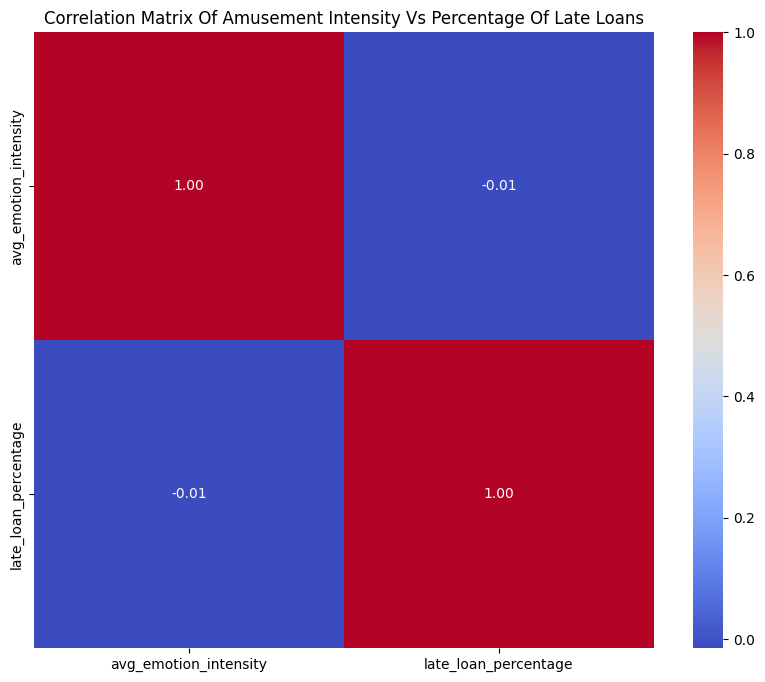


Correlation Matrix Of Anticipation Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000             -0.067173
late_loan_percentage               -0.067173              1.000000


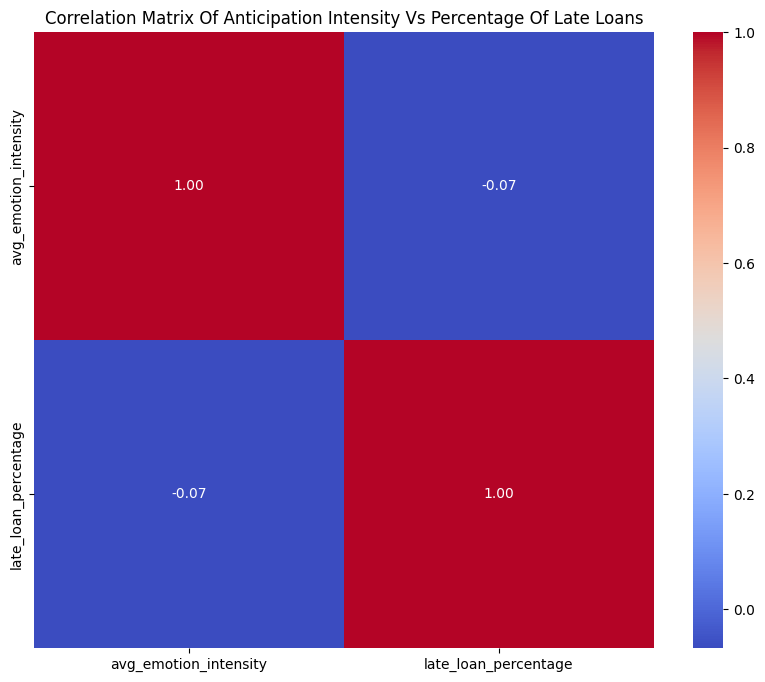


Correlation Matrix Of Anxiety Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000             -0.046435
late_loan_percentage               -0.046435              1.000000


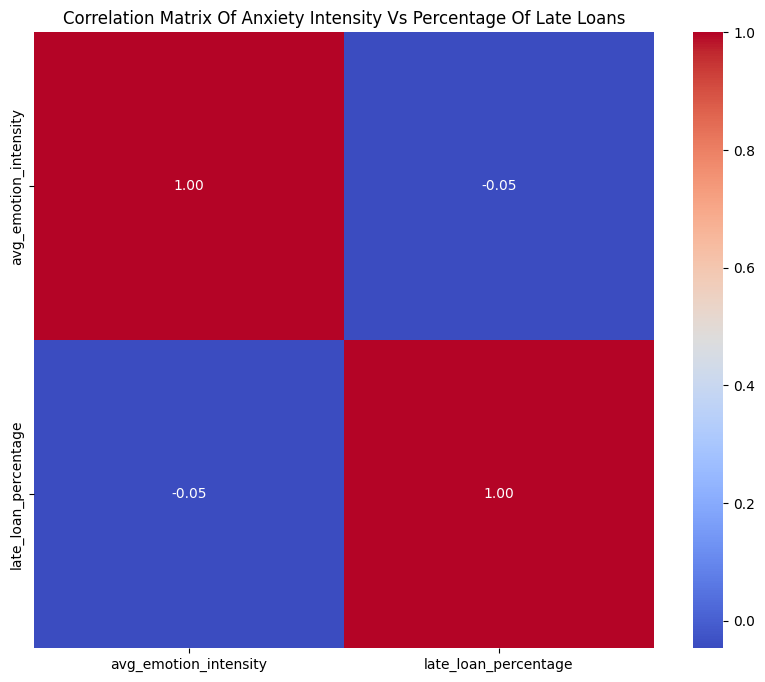


Correlation Matrix Of Boredom Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000             -0.025074
late_loan_percentage               -0.025074              1.000000


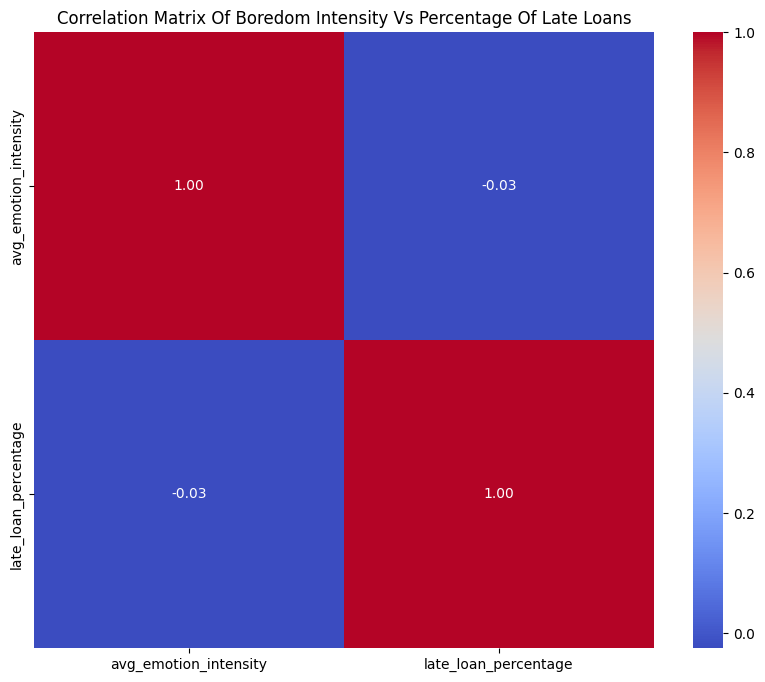


Correlation Matrix Of Confusion Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000             -0.059869
late_loan_percentage               -0.059869              1.000000


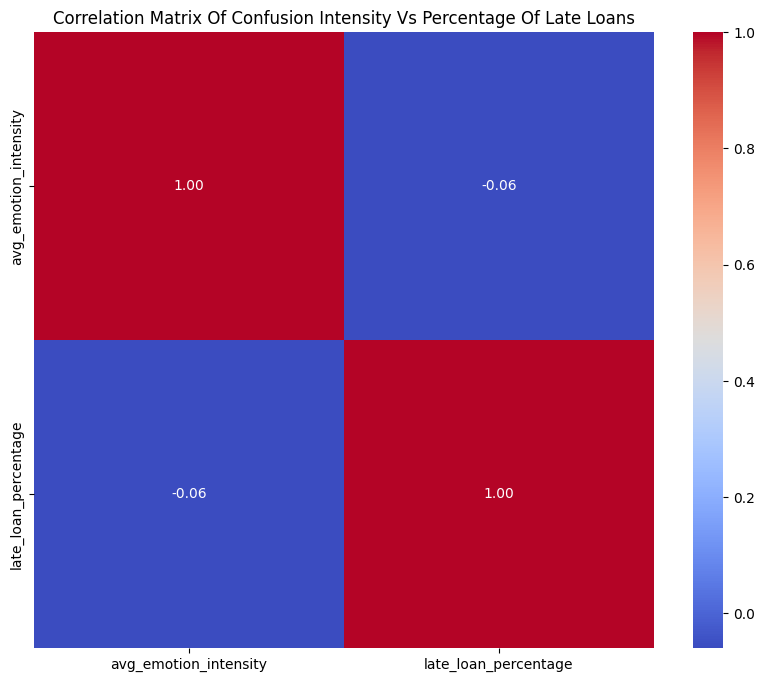


Correlation Matrix Of Contempt Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.024662
late_loan_percentage                0.024662              1.000000


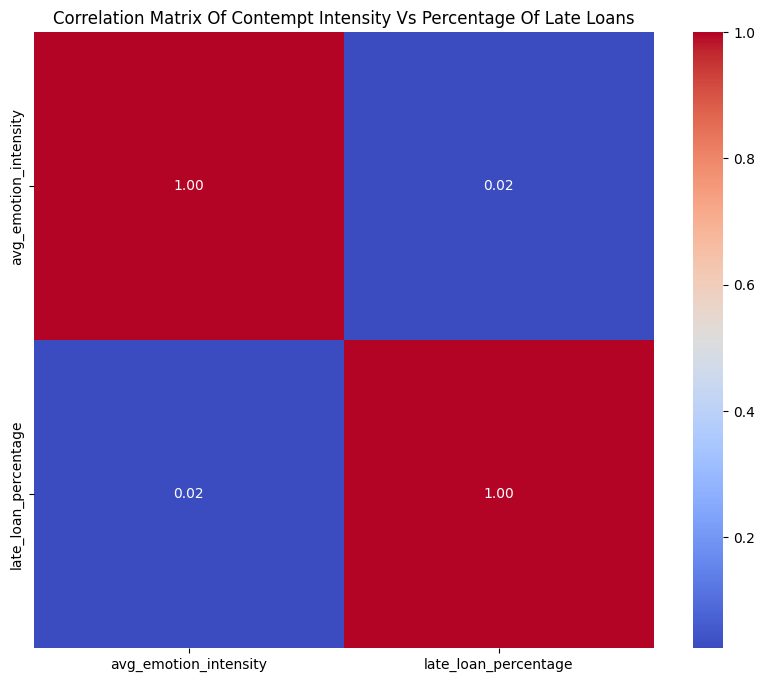


Correlation Matrix Of Disgust Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.077772
late_loan_percentage                0.077772              1.000000


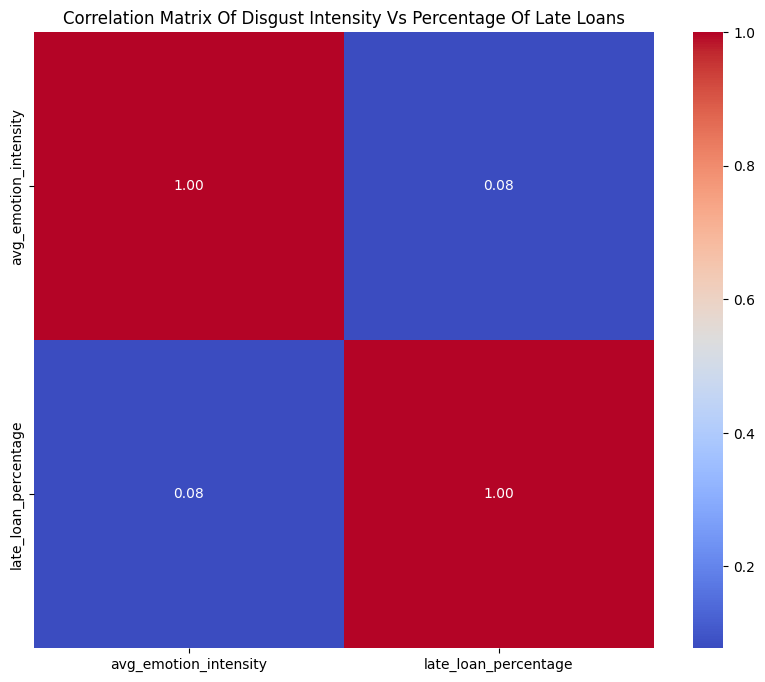


Correlation Matrix Of Fear Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.021572
late_loan_percentage                0.021572              1.000000


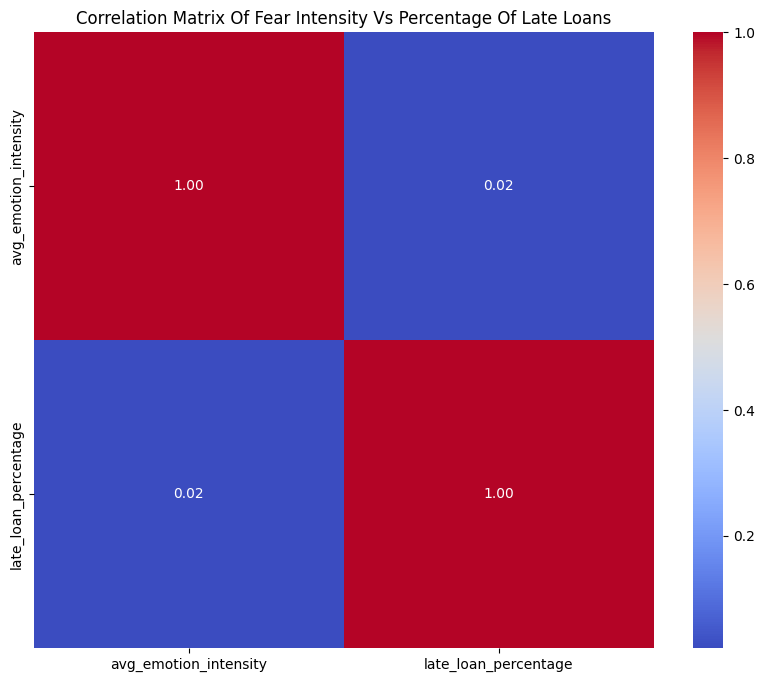


Correlation Matrix Of Frustration Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000             -0.026417
late_loan_percentage               -0.026417              1.000000


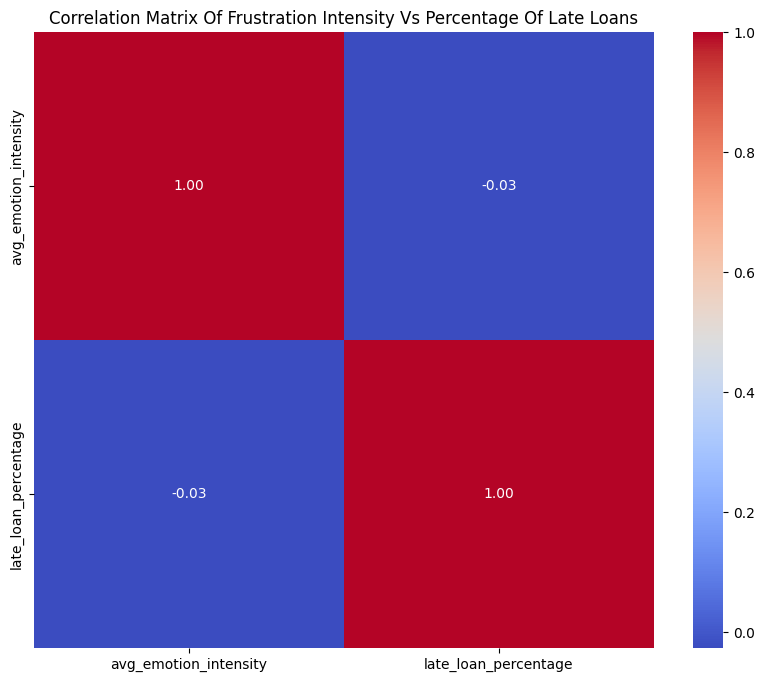


Correlation Matrix Of Guilt Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.041647
late_loan_percentage                0.041647              1.000000


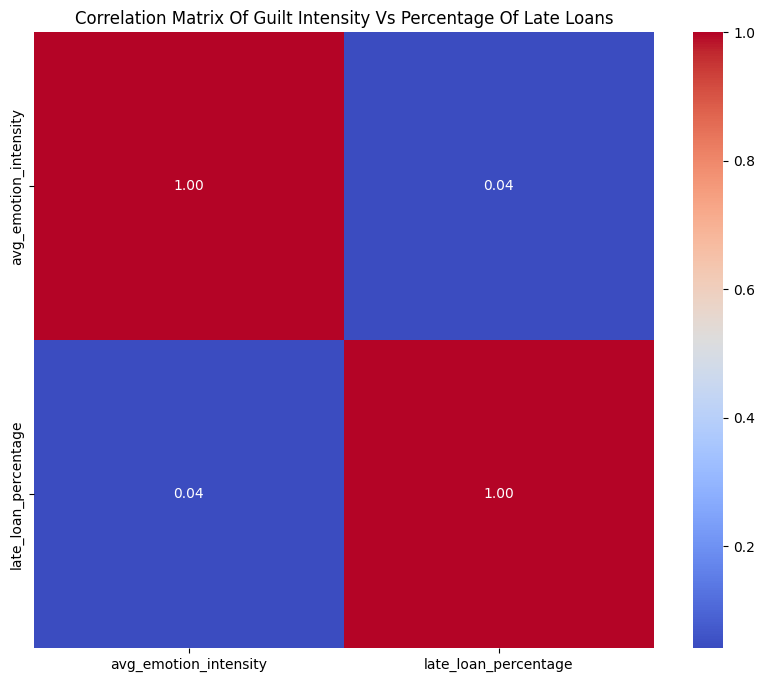


Correlation Matrix Of Jealousy Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000             -0.051574
late_loan_percentage               -0.051574              1.000000


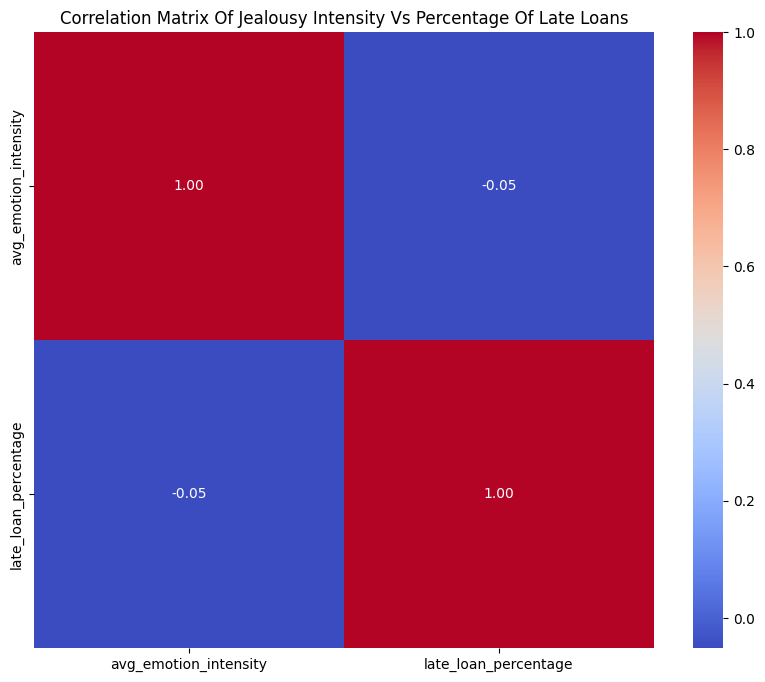


Correlation Matrix Of Joy Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.014325
late_loan_percentage                0.014325              1.000000


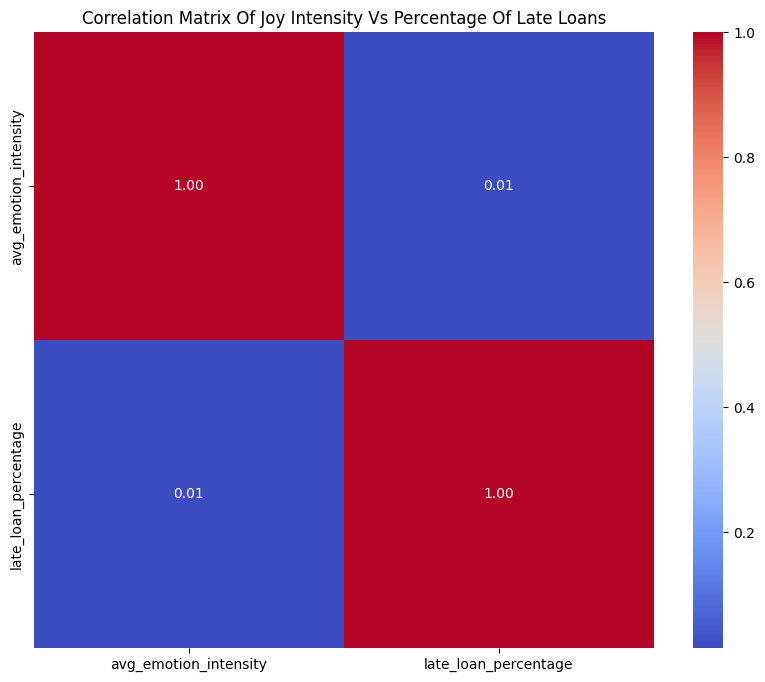


Correlation Matrix Of Love Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity                1.00000               0.01217
late_loan_percentage                 0.01217               1.00000


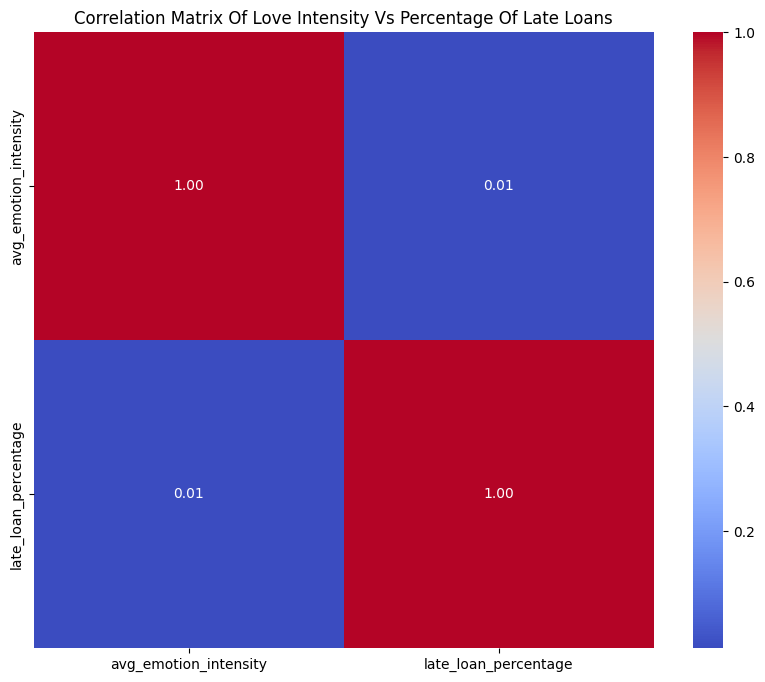


Correlation Matrix Of Pride Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.060019
late_loan_percentage                0.060019              1.000000


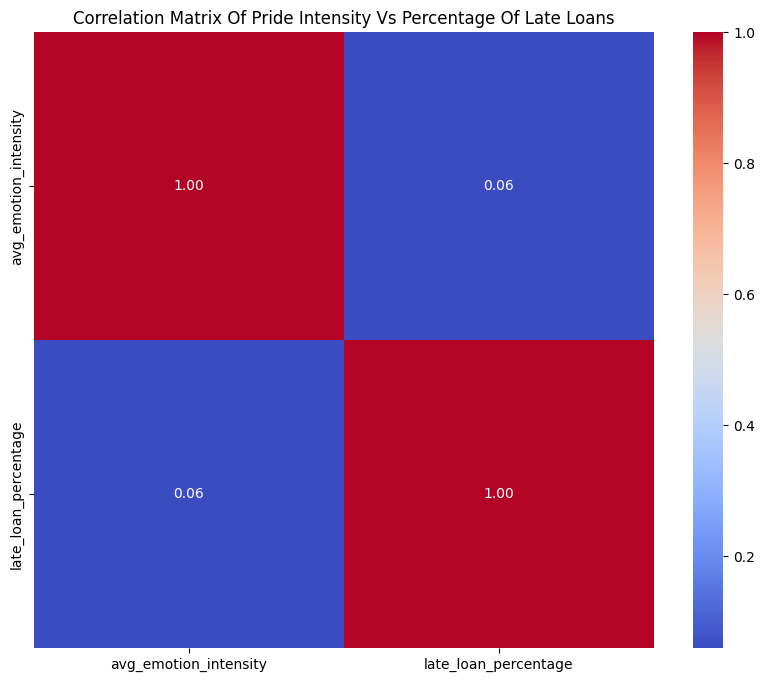


Correlation Matrix Of Relief Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity                1.00000               0.00517
late_loan_percentage                 0.00517               1.00000


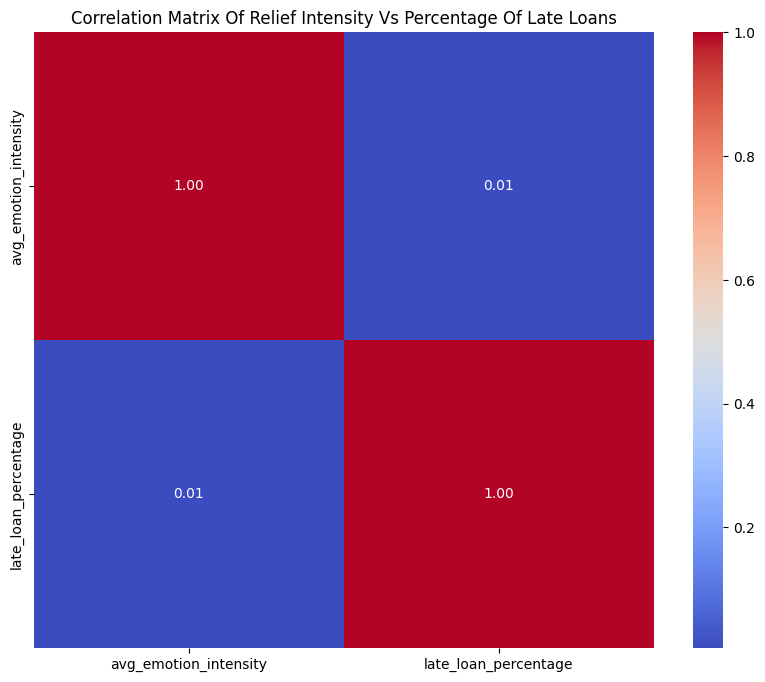


Correlation Matrix Of Sadness Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.093791
late_loan_percentage                0.093791              1.000000


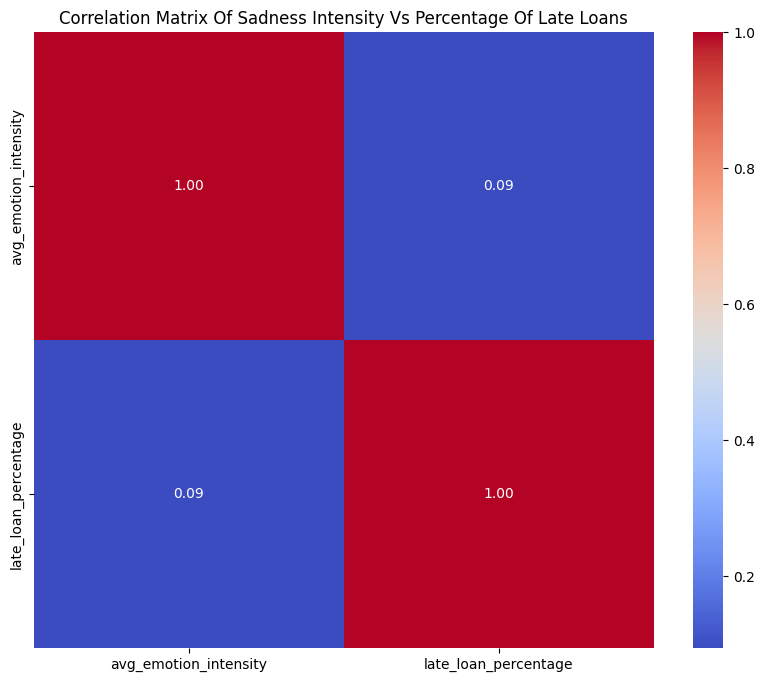


Correlation Matrix Of Shame Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000              0.026138
late_loan_percentage                0.026138              1.000000


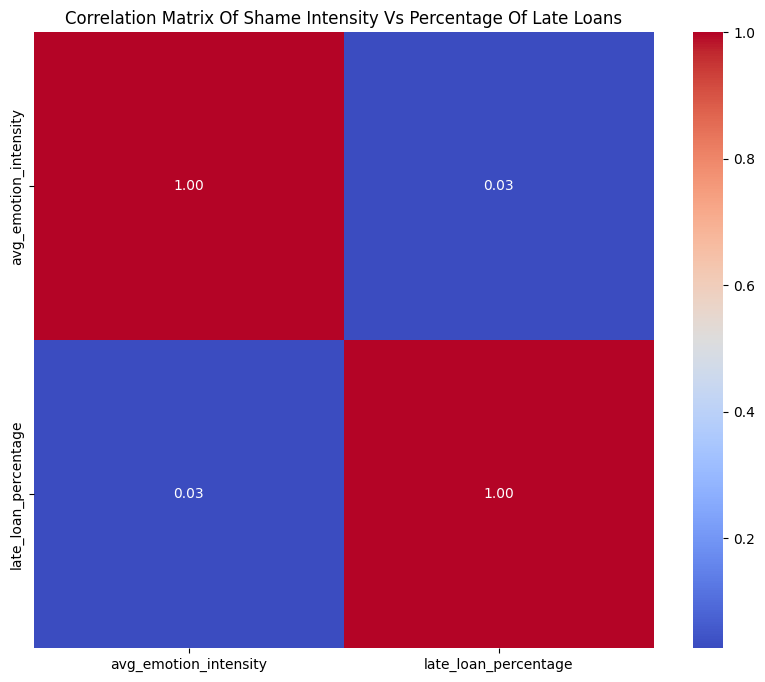


Correlation Matrix Of Surprise Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity               1.000000             -0.019457
late_loan_percentage               -0.019457              1.000000


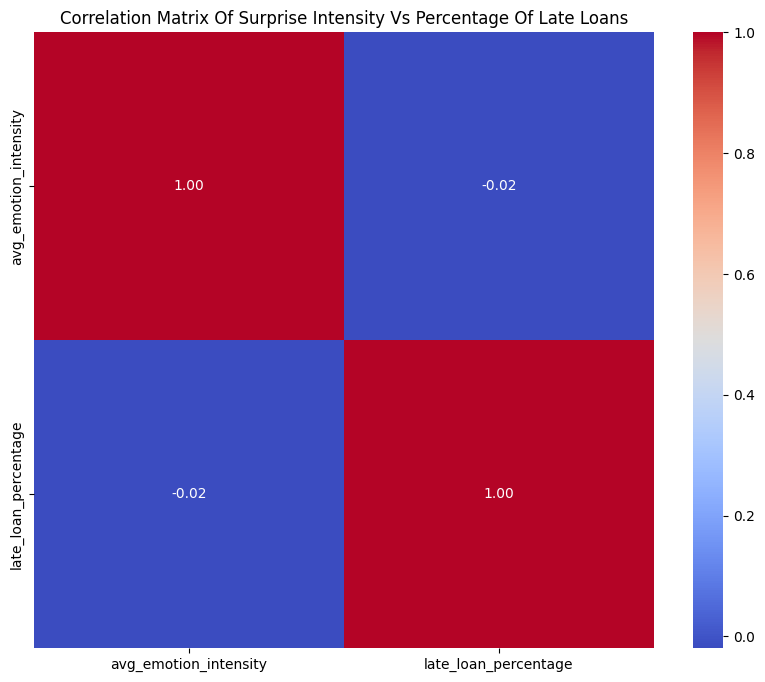


Correlation Matrix Of Trust Intensity Vs Percentage Of Late Loans:
                       avg_emotion_intensity  late_loan_percentage
avg_emotion_intensity                1.00000              -0.04778
late_loan_percentage                -0.04778               1.00000


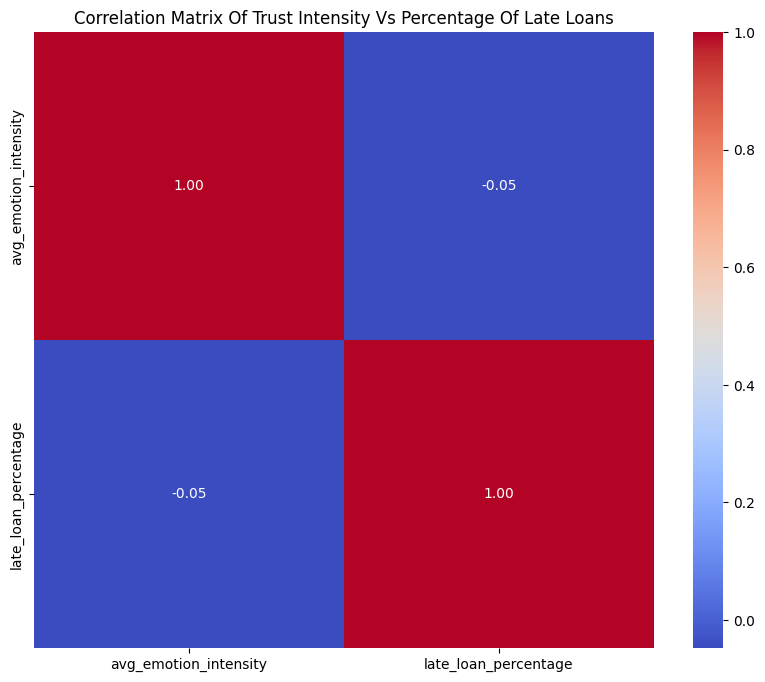

Cell execution took 24.1822 seconds.


In [51]:
start_time = time.time()  # Start timing

# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data and loan data from the database
query = """
SELECT
  e.user_id,
  e.primary_emotion,
  AVG(e.intensity) AS avg_emotion_intensity,  -- Average emotion intensity
  SUM(CASE WHEN l.status = 'late' THEN 1 ELSE 0 END) * 1.0 / COUNT(l.loan_id) AS late_loan_percentage  -- Percentage of late loans
FROM emotional_data AS e
JOIN loans AS l ON e.user_id = l.user_id
GROUP BY e.user_id, e.primary_emotion
ORDER BY e.user_id, e.primary_emotion;
"""
df_emotion_loan = pd.read_sql_query(query, conn)
print(df_emotion_loan)

emotions = df_emotion_loan['primary_emotion'].unique()

# Iterate through each primary emotion and create a correlation matrix
for emotion in emotions:
    df_emotion = df_emotion_loan[df_emotion_loan['primary_emotion'] == emotion]

    # Calculate the correlation between intensity and the percentage of late loans
    df_correlation = df_emotion[['avg_emotion_intensity', 'late_loan_percentage']].corr()

    print(f"\nCorrelation Matrix of {emotion} Intensity vs Percentage of Late Loans:".title())
    print(df_correlation)

    plt.figure(figsize=(10, 8))
    sns.heatmap(df_correlation, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation Matrix of {emotion} Intensity vs Percentage of Late Loans'.title())
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")

       user_id primary_emotion  avg_emotion_intensity  late_loan_percentage
0            1       amusement               5.453184                   0.0
1            1    anticipation               5.573944                   0.0
2            1         anxiety               5.388889                   0.0
3            1         boredom               5.300000                   0.0
4            1       confusion               5.401869                   0.0
...        ...             ...                    ...                   ...
11889      734          relief               5.575397                   0.0
11890      734         sadness               5.713235                   0.0
11891      734           shame               5.190476                   0.0
11892      734        surprise               5.652778                   0.0
11893      734           trust               5.357143                   0.0

[11894 rows x 4 columns]


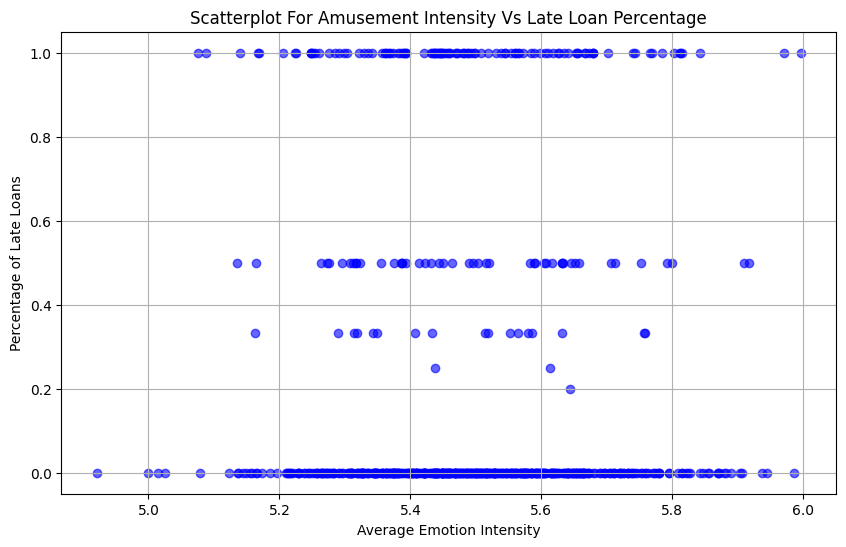

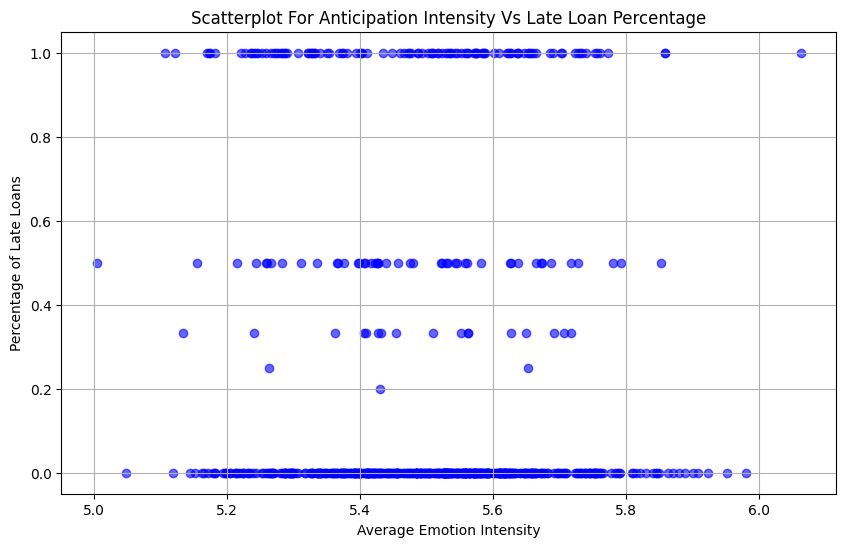

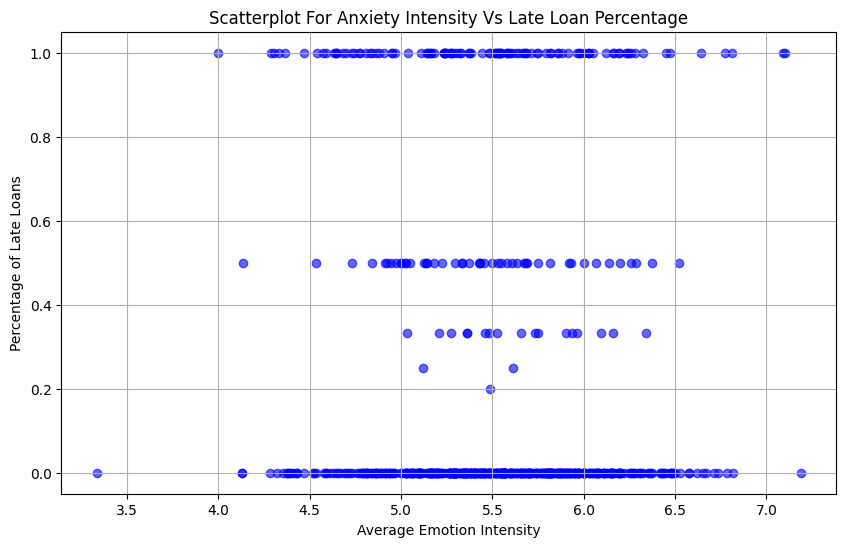

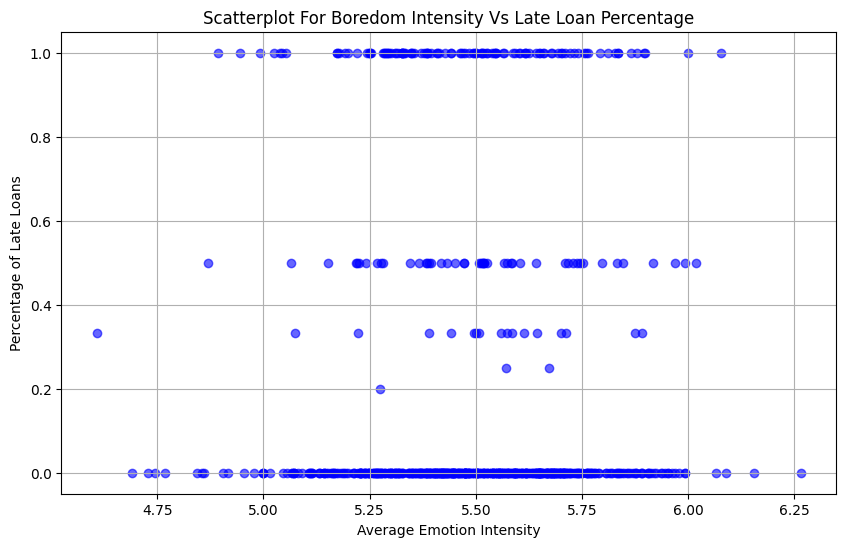

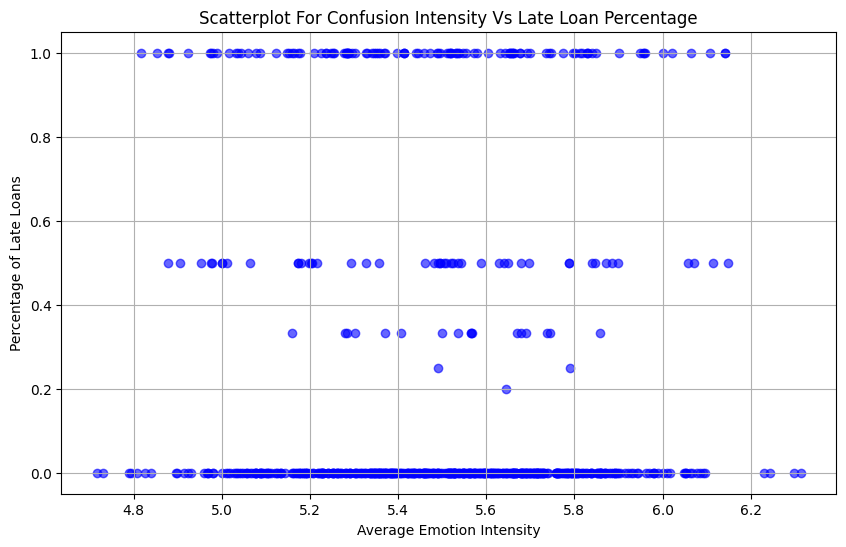

...

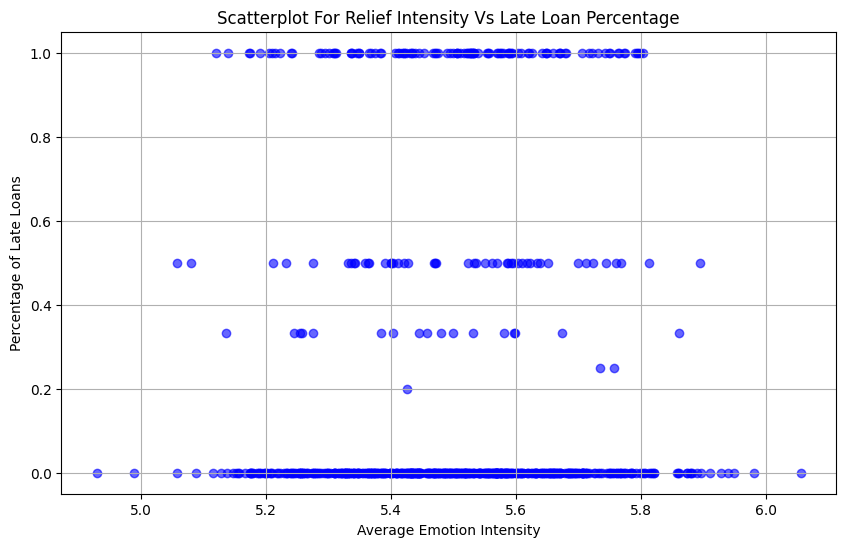

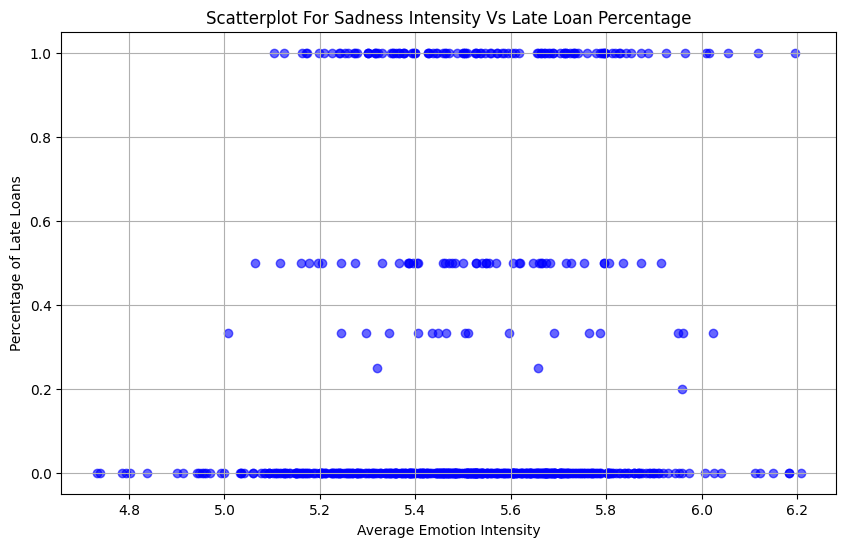

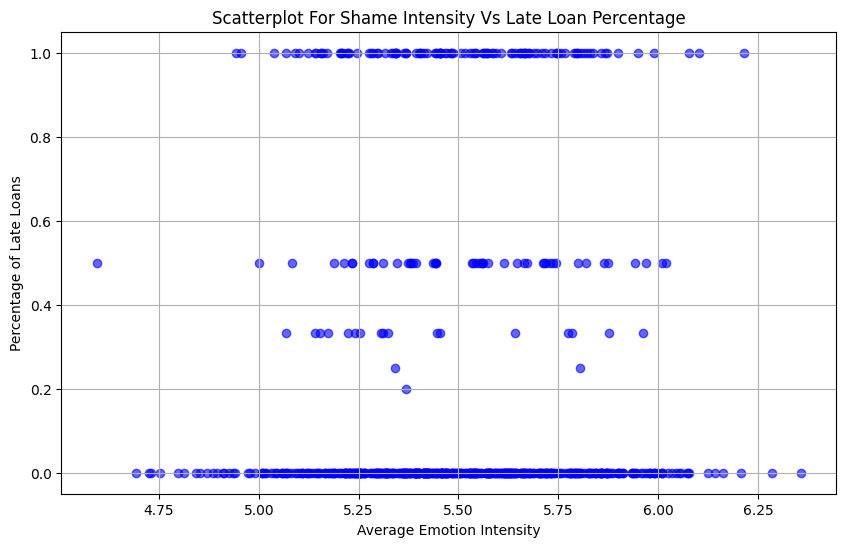

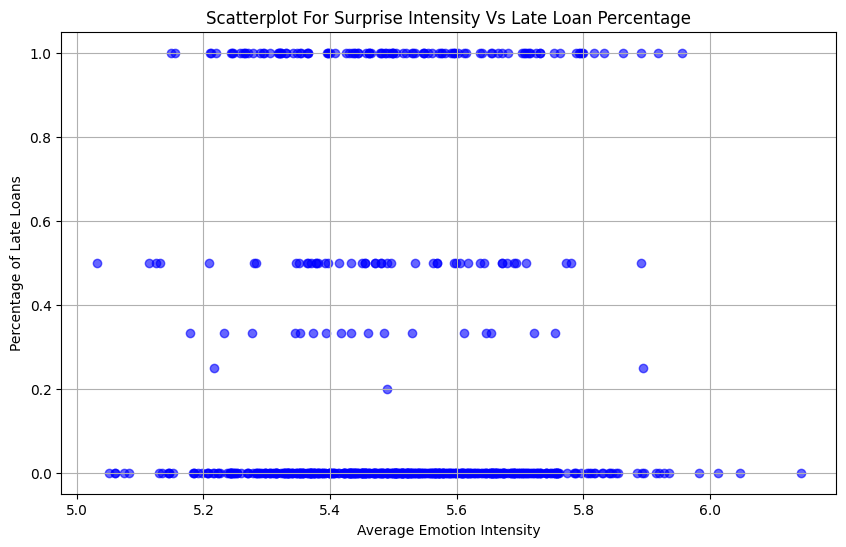

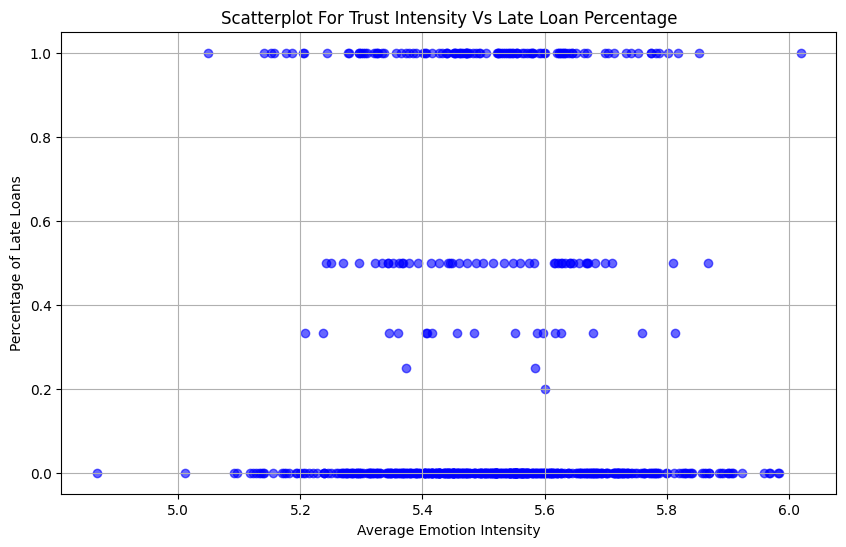

Cell execution took 18.3396 seconds.


In [52]:
start_time = time.time()  # Start timing

# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch emotional data and loan data from the database
query = """
SELECT
  e.user_id,
  e.primary_emotion,
  AVG(e.intensity) AS avg_emotion_intensity,  -- Average emotion intensity
  SUM(CASE WHEN l.status = 'late' THEN 1 ELSE 0 END) * 1.0 / COUNT(l.loan_id) AS late_loan_percentage  -- Percentage of late loans
FROM emotional_data AS e
JOIN loans AS l ON e.user_id = l.user_id
GROUP BY e.user_id, e.primary_emotion
ORDER BY e.user_id, e.primary_emotion;
"""
df_emotion_loan = pd.read_sql_query(query, conn)
print(df_emotion_loan)

emotions = df_emotion_loan['primary_emotion'].unique()

# Iterate through each primary emotion and create scatterplots
for emotion in emotions:
    df_emotion = df_emotion_loan[df_emotion_loan['primary_emotion'] == emotion]

    # Scatterplot for average emotion intensity vs percentage of late loans
    plt.figure(figsize=(10, 6))
    plt.scatter(df_emotion['avg_emotion_intensity'], df_emotion['late_loan_percentage'], alpha=0.6, color='b')
    plt.title(f'Scatterplot for {emotion} Intensity vs Late Loan Percentage'.title())
    plt.xlabel('Average Emotion Intensity')
    plt.ylabel('Percentage of Late Loans')
    plt.grid(True)
    plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


Emotion intensity for different emotions do not seem to have a linear or a non linear relationship with the late loans percentage of a given user.


## 4\. Lending Operation Assessment
   - Evaluate the effectiveness of the lending policy (interest rates and loan amount) in terms of the default
   - Measure growth and profitability of the lending operation.
   - Analyze disbushment, loan performance, and revenue trends over time.



### 4.1 Evaluate the effectiveness of the lending policy (interest rates and loan amount) in terms of the default

               loan_amount  interest_rate   default
loan_amount       1.000000      -0.647865 -0.058335
interest_rate    -0.647865       1.000000  0.059047
default          -0.058335       0.059047  1.000000
Cell execution took 3.3913 seconds.


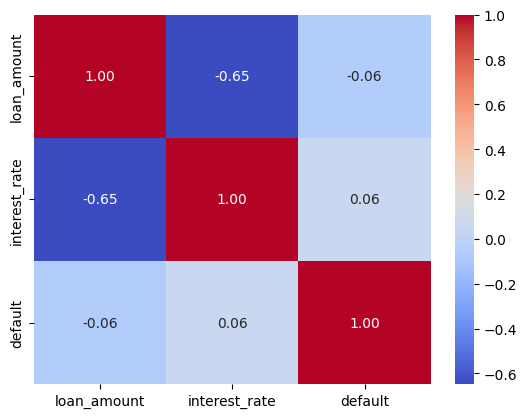

In [4]:
# Assess relationship between interest rates, loan amounts and loan defaults

start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch loan data and user data from the database
query = """
SELECT
  l.loan_id,
  l.user_id,
  l.loan_amount,
  l.total_amount,
  l.due_date,
  l.issue_date,
  l.installment_amount,
  l.status,
  ((l.total_amount - l.loan_amount) / l.loan_amount) *
  (365.0 / (julianday(l.due_date) - julianday(l.issue_date))) * 100 AS interest_rate
FROM loans AS l;
"""
df_loan_data = pd.read_sql_query(query, conn)

# Create a new column indicating whether the loan defaulted (status == 'late')
df_loan_data['default'] = df_loan_data['status'] == 'late'

# Correlation matrix
corr_matrix = df_loan_data[['loan_amount', 'interest_rate', 'default']].corr()
print(corr_matrix)

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


There is a very small positive correlation between risk of default and the interest rate (about 0.06). That suggests that indeed interest rates tend to increase for higher risk of default but only by a small proportion. For the loan amount it is the opposite, the loan amount seems to decrease by the higher risk of default but again by a very small proportion.

In [5]:
# Total profit with interest from paid loans (total amount - loan amount) and
# total loss from defaulted loans (sum of loan amount for status equals late)

start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch loan data from the database
query = """
SELECT
  loan_amount,
  total_amount - loan_amount_paid AS pending_payment,
  loan_amount_paid,
  status
FROM loans;
"""
df_loans = pd.read_sql_query(query, conn)

# Calculate profit from paid loans
profit_paid_loans = df_loans.loc[df_loans['status'] == 'paid', 'loan_amount_paid'].sum() - df_loans.loc[df_loans['status'] == 'paid', 'loan_amount'].sum()

# Calculate loss from defaulted loans
loss_defaulted_loans = df_loans.loc[df_loans['status'] == 'late', 'pending_payment'].sum()


print(f"Total profit from paid loans: $ {profit_paid_loans:,.2f}")
print(f"Total loss from defaulted loans: $ {loss_defaulted_loans:,.2f}")


elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


Total profit from paid loans: $ 1,802,402.27
Total loss from defaulted loans: $ 953,445.63
Cell execution took 0.0302 seconds.


The total profit generated from interest on paid loans exceeds the total loss from defaulted loans by approximately US$ 850,000. The lending policy can be considered effective if this surplus is sufficient to cover all other expenses associated with the lending operation.

### 4.2 Measure growth and profitability of the lending operation and analyze disbursement, loan performance, and revenue trends over time.

<ipython-input-55-4f6b44ebb402>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(df_loan_growth['issue_month'], rotation=90)


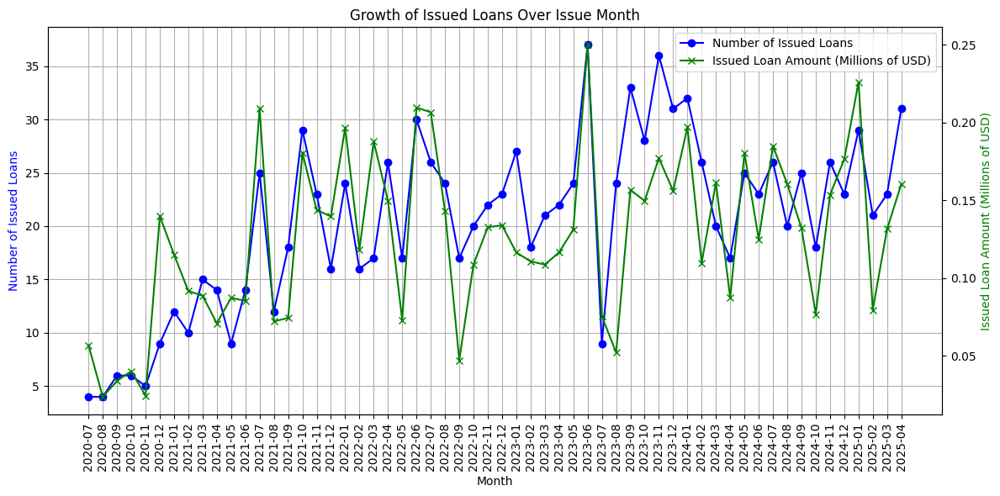

Cell execution took 1.1553 seconds.


In [55]:
start_time = time.time()  # Start timing

# Fetch loan data from the database
query = """
SELECT
  strftime('%Y-%m', issue_date) AS issue_month,
  COUNT(loan_id) AS loan_count,
  SUM(loan_amount) AS total_loan_amount
FROM loans
GROUP BY issue_month
ORDER BY issue_month;
"""
df_loan_growth = pd.read_sql_query(query, conn)

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting the first series on the primary y-axis
line1, = ax1.plot(df_loan_growth['issue_month'], df_loan_growth['loan_count'],
                  label='Number of Issued Loans', marker='o', color='blue')
ax1.set_ylabel('Number of Issued Loans', color='blue')

# Creating the secondary y-axis
ax2 = ax1.twinx()  # Make sure to call this before plotting line2
line2, = ax2.plot(df_loan_growth['issue_month'], df_loan_growth['total_loan_amount'] / (10 ** 6),
                  label='Issued Loan Amount (Millions of USD)', marker='x', color='green')
ax2.set_ylabel('Issued Loan Amount (Millions of USD)', color='green')

# Set the x-axis label
ax1.set_xlabel('Month')

# Rotate x-axis labels
ax1.set_xticklabels(df_loan_growth['issue_month'], rotation=90)

# Add the title
plt.title('Growth of Issued Loans Over Issue Month')

# Enable both horizontal and vertical grids
ax1.grid(True, which='both', axis='both')  # Enable grid for both axes

# Combine legends from both axes
lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels)

plt.tight_layout()

# Display the plot
plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


From the issued month perspective, it seems that the number of issued loans and the issued loan amount are increasing, despite the low values on August and September of 2023.

<ipython-input-56-cdc33560e97e>:39: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(df_loan_growth['due_month'], rotation=90)


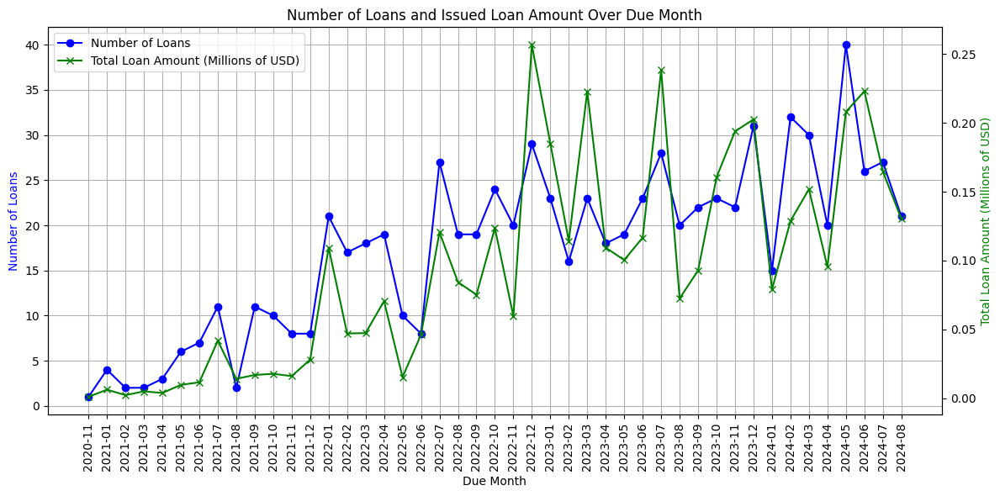

Cell execution took 0.9987 seconds.


In [56]:
start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch loan data from the database
query = """
SELECT
  strftime('%Y-%m', due_date) AS due_month,
  COUNT(loan_id) AS loan_count,
  SUM(loan_amount) AS total_loan_amount
FROM loans
WHERE due_date < '2024-09-01'
GROUP BY due_month
ORDER BY due_month;
"""
df_loan_growth = pd.read_sql_query(query, conn)

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting the first series on the primary y-axis
line1, = ax1.plot(df_loan_growth['due_month'], df_loan_growth['loan_count'],
                  label='Number of Loans', marker='o', color='blue')
ax1.set_ylabel('Number of Loans', color='blue')

# Creating the secondary y-axis
ax2 = ax1.twinx()  # Make sure to call this before plotting line2
line2, = ax2.plot(df_loan_growth['due_month'], df_loan_growth['total_loan_amount'] / (10 ** 6),
                  label='Total Loan Amount (Millions of USD)', marker='x', color='green')
ax2.set_ylabel('Total Loan Amount (Millions of USD)', color='green')

# Set the x-axis label
ax1.set_xlabel('Due Month')

# Rotate x-axis labels
ax1.set_xticklabels(df_loan_growth['due_month'], rotation=90)

# Add the title
plt.title('Number of Loans and Issued Loan Amount Over Due Month')

# Enable both horizontal and vertical grids
ax1.grid(True, which='both', axis='both')  # Enable grid for both axes

# Combine legends from both axes
lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels)

plt.tight_layout()

# Display the plot
plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


Also from the due month's perspective, there is an increasing number of loans and loan amount.

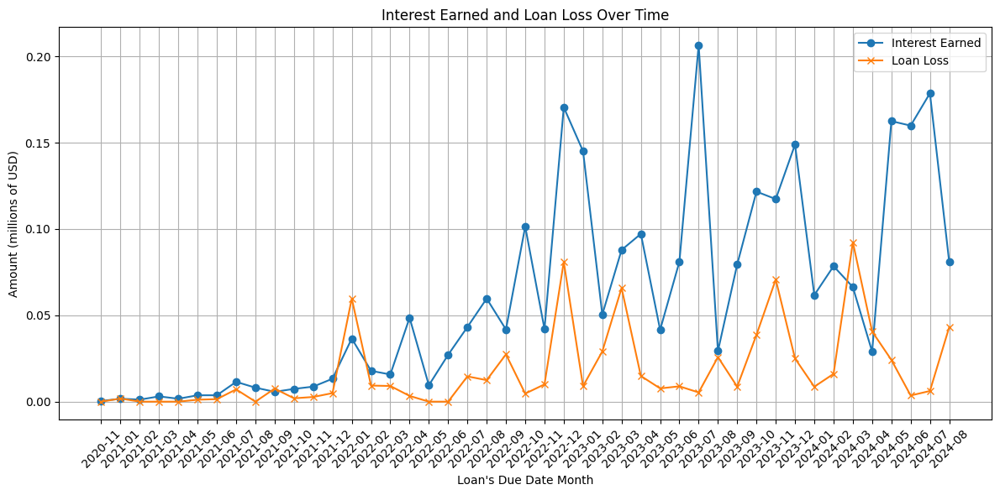

Cell execution took 0.5894 seconds.


In [6]:
start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch loan data from the database
query = """
SELECT
  strftime('%Y-%m', due_date) AS due_date_month,
  SUM(CASE WHEN status = 'paid' THEN total_amount - loan_amount ELSE 0 END) AS interest_earned,
  SUM(CASE WHEN status = 'late' THEN total_amount - loan_amount_paid ELSE 0 END) AS loan_loss
FROM loans
WHERE due_date < '2024-09-01'
GROUP BY due_date_month
ORDER BY due_date_month;
"""
df_loan_performance = pd.read_sql_query(query, conn)

# Create the chart
plt.figure(figsize=(12, 6))
plt.plot(df_loan_performance['due_date_month'], df_loan_performance['interest_earned']/(10**6), label='Interest Earned', marker='o')
plt.plot(df_loan_performance['due_date_month'], df_loan_performance['loan_loss']/(10**6), label='Loan Loss', marker='x')
plt.xlabel("Loan's Due Date Month")
plt.ylabel('Amount (millions of USD)')
plt.title('Interest Earned and Loan Loss Over Time')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


From the interest earned x loan loss perspective, it seems that the profitability of the operation is sustainable, although in 3 of the 46 months of operation the loan loss was greater than the interest earned.

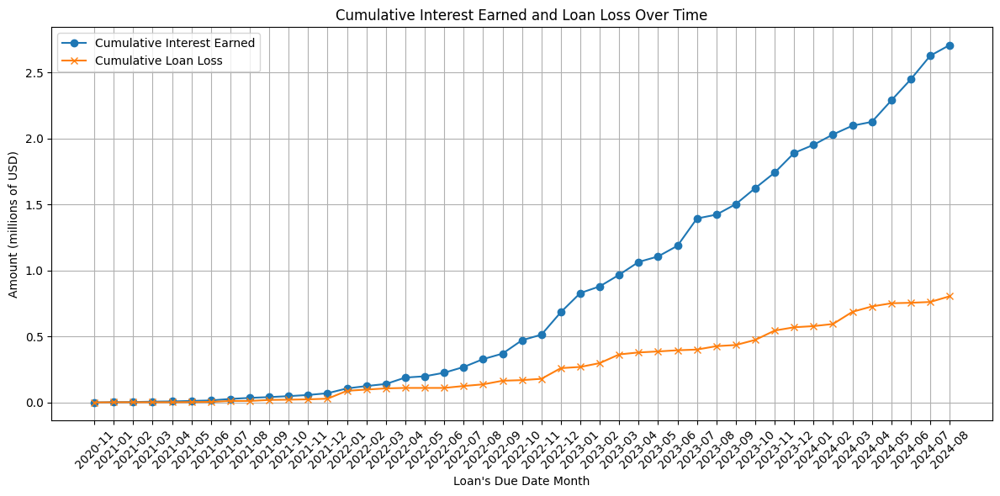

Cell execution took 0.9690 seconds.


In [7]:
start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch loan data from the database
query = """
SELECT
  strftime('%Y-%m', due_date) AS due_date_month,
  SUM(CASE WHEN status = 'paid' THEN total_amount - loan_amount ELSE 0 END) AS interest_earned,
  SUM(CASE WHEN status = 'late' THEN total_amount - loan_amount_paid ELSE 0 END) AS loan_loss
FROM loans
WHERE due_date < '2024-09-01'
GROUP BY due_date_month
ORDER BY due_date_month;
"""
df_loan_performance = pd.read_sql_query(query, conn)

# Calculate the cumulative sum of interest earned and loan loss
df_loan_performance['cumulative_interest_earned'] = df_loan_performance['interest_earned'].cumsum()
df_loan_performance['cumulative_loan_loss'] = df_loan_performance['loan_loss'].cumsum()

# Create the chart
plt.figure(figsize=(12, 6))
plt.plot(df_loan_performance['due_date_month'], df_loan_performance['cumulative_interest_earned'] / (10 ** 6), label='Cumulative Interest Earned', marker='o')
plt.plot(df_loan_performance['due_date_month'], df_loan_performance['cumulative_loan_loss'] / (10 ** 6), label='Cumulative Loan Loss', marker='x')
plt.xlabel("Loan's Due Date Month")
plt.ylabel('Amount (millions of USD)')
plt.title('Cumulative Interest Earned and Loan Loss Over Time')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


From a cumulative point of view, the overall profit of the operation is rapidly increasing.

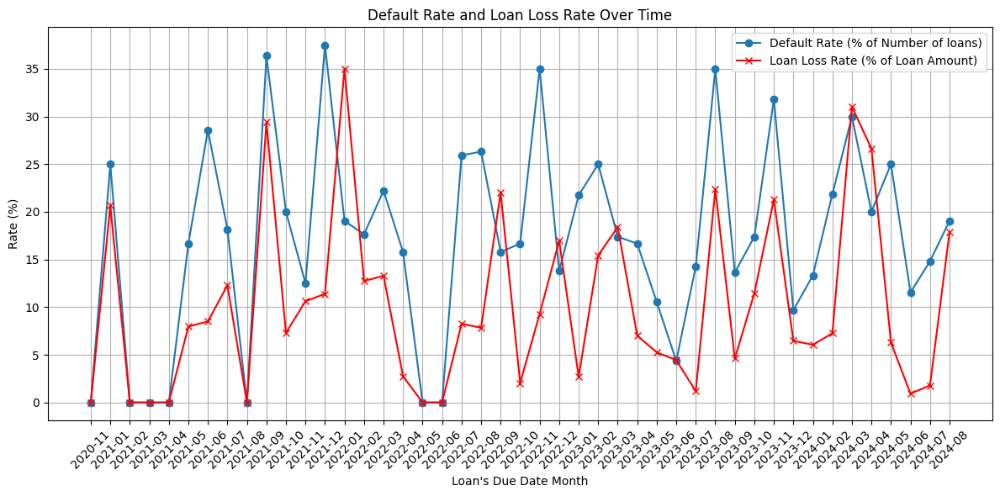

Cell execution took 2.5722 seconds.


In [9]:
start_time = time.time()  # Start timing

# Connect to the SQLite database

conn = sqlite3.connect(db_file_path)

# Fetch loan data from the database
query = """
SELECT
  strftime('%Y-%m', due_date) AS due_date_month,
  COUNT(CASE WHEN status = 'late' THEN loan_id ELSE NULL END) AS late_loan_count,
  COUNT(loan_id) AS total_loan_count,
  SUM(total_amount) AS total_loan_amount,
  SUM(CASE WHEN status = 'late' THEN total_amount - loan_amount_paid ELSE 0 END) AS late_loan_amount
FROM loans
WHERE due_date < '2024-09-01'
GROUP BY due_date_month
ORDER BY due_date_month;
"""
df_default_rate = pd.read_sql_query(query, conn)

# Calculate the default rate (number of late loans as a percentage of total loans)
df_default_rate['default_rate'] = (df_default_rate['late_loan_count'] / df_default_rate['total_loan_count']) * 100

# Calculate the loan loss rate (late loan amount as a percentage of total loan amount)
df_default_rate['loan_loss_rate'] = (df_default_rate['late_loan_amount'] / df_default_rate['total_loan_amount']) * 100

# Create the chart
plt.figure(figsize=(12, 6))

# Plot default rate
plt.plot(df_default_rate['due_date_month'], df_default_rate['default_rate'], marker='o', label='Default Rate (% of Number of loans)')

# Plot loan loss rate
plt.plot(df_default_rate['due_date_month'], df_default_rate['loan_loss_rate'], marker='x', label='Loan Loss Rate (% of Loan Amount)', color='red')

plt.xlabel("Loan's Due Date Month")
plt.ylabel('Rate (%)')
plt.title('Default Rate and Loan Loss Rate Over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

elapsed_time = time.time() - start_time
print(f"Cell execution took {elapsed_time:.4f} seconds.")


It is also possible to visualize that the default rate and loan loss rate are highly volatiles, ranging from 0 to 30% each month. There seems to be no clear tendency of decreasing or increasing the rates.


## 5\. Data Visualization and Dashboard
   - Create a comprehensive dashboard with key metrics and insights from your analysis.
   - Include visualizations that effectively communicate complex emotional patterns and their relationship to loan data.

The dashboard is available as a Power BI report named 'cloudwalk technical interview dashboard.pbix' on the GitHub repository.

A few issues on the new database: loan_amount_paid is different than total_amount even when status is paid, and paid_date was long ago as well as due_date. -> Growth and profitability part has to change to reflect that

Also, now late loans also have a paid amount.

## 6\. [Optional] Reasoning

- Suggest refinements to the emotional data collection process.
- Propose improvements to the loan approval algorithm.
- Recommend strategies for personalizing credit offers based on emotional patterns.
- Discuss the ethical implications of using emotional data for credit decisions.

### 6.1 Suggest refinements to the emotional data collection process
The process of collecting emotional data could be improved by preventing users from submitting empty values. At present, there are six columns in the database containing over 500,000 empty entries, which can introduce bias into the analysis. This is because rows with missing values are excluded, and the reasons for the data gaps remain unclear.

### 6.2 Propose improvements to the loan approval algorithm

The results of the loan analysis did not show a strong correlation with the emotional data, suggesting that incorporating emotional data into the loan algorithm is unlikely to enhance its decision-making process.


### 6.3 Recommend strategies for personalizing credit offers based on emotional patterns.

Possible strategies include customizing offers with flexible repayment plans or lower interest rates for individuals on a more stressful state (e.g. with higher levels of anxiety, fear, frustration, etc). Tailored offers after significant life events (e.g., death of a relative or a serious illness) could also improve the company's goodwill and foster a positive reputation, creating lasting relationships and stronger customer loyalty.

### 6.4 Discuss the ethical implications of using emotional data for credit decisions.

Using emotional data for credit decisions could introduce bias to the algorithms, inadvertently leading to discriminatory practices, where individuals from certain backgrounds or with specific emotional profiles are unfairly penalized or favored in credit evaluations.

## 7\. [Optional] Machine Learning

- Create a model to predict loan terms based on emotional and contextual data.
- Evaluate the model's performance and identify the most important features.

### 7.1 Predicting Score

In [33]:
# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch relevant data from the database (adjust the query based on your tables and features)
query = """
SELECT
  e.intensity,
  e.primary_emotion,
  e.time_of_day,
  e.relationship,
  e.situation,
  e.location,
  e.weather,
  e.physical_state,
  e.preceding_event,
  e.grade,
  u.user_id,
  u.score
FROM users AS u
JOIN emotional_data AS e ON u.user_id = e.user_id
"""

df = pd.read_sql_query(query, conn)
display(df)

pd.set_option('display.max_columns', 200)

# Function to get frequency counts for each categorical column and preserve score
def summarize_categorical_data(df, categorical_columns, additional_columns):
    # Get the user-related columns to preserve
    user_related_columns = ['user_id'] + additional_columns

    # Create a DataFrame to hold all summaries
    summary_dfs = []

    for col in categorical_columns:
        # Frequency counts for each category in the column
        frequency_counts = df.groupby(['user_id', col]).size().unstack(fill_value=0).reset_index()

        # Rename columns to indicate the original categorical variable
        frequency_counts.columns.name = None
        frequency_counts = frequency_counts.rename(columns={'user_id': 'user_id'})

        # Append the frequency counts DataFrame to the list
        summary_dfs.append(frequency_counts)

    # Merge all frequency counts DataFrames on 'user_id'
    final_summary = summary_dfs[0]
    for summary_df in summary_dfs[1:]:
        final_summary = pd.merge(final_summary, summary_df, on='user_id', how='outer')

    # Preserve the additional column (score) by merging it
    final_summary = pd.merge(final_summary, df[user_related_columns].drop_duplicates(), on='user_id', how='left')

    return final_summary


# Function to fill NaNs with mode for categorical columns
def fill_na_with_mode(df):
    # Loop through each column in the DataFrame
    for column in df.select_dtypes(include=['object', 'category']).columns:
        # Calculate the mode of the column
        mode_value = df[column].mode()[0]  # Get the first mode
        # Fill NaN values with the mode
        df[column].fillna(mode_value, inplace=True)

# Specify the categorical columns to summarize
categorical_columns = ['primary_emotion', 'time_of_day', 'relationship',
                       'situation', 'location', 'weather',
                       'physical_state', 'preceding_event']

fill_na_with_mode(df)
final_summary = summarize_categorical_data(df, categorical_columns, ['score'])
display(final_summary)

# Define features and target variable
final_summary.dropna(inplace=True)
X = final_summary.drop(['score', 'user_id'], axis=1)
y = final_summary['score']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Apply MinMaxScaler only on the training data
X_train_scaled = scaler.fit_transform(X_train)

# Apply the scaler to the test data using the parameters learned from the training data
X_test_scaled = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames for easier column management
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Train a Random Forest model
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train_scaled, y_train)

# Get feature importance scores
feature_importances = rf.feature_importances_

# Create a DataFrame to display the importance scores alongside feature names
importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print("Feature Importances:\n", importances_df)

# Evaluate the model with all features
y_pred = rf.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\nInitial Model Evaluation:\nMSE: {mse}\nR²: {r2}")

# Identify and remove low-importance features
# Let's remove features with importance below a threshold (0.01)
low_importance_features = importances_df[importances_df['Importance'] < 0.01]['Feature'].tolist()
X_train_reduced = pd.DataFrame(X_train_scaled, columns=X.columns).drop(low_importance_features, axis=1)
X_test_reduced = pd.DataFrame(X_test_scaled, columns=X.columns).drop(low_importance_features, axis=1)

# Retrain the model with reduced feature set
rf_reduced = RandomForestRegressor(random_state=42)
rf_reduced.fit(X_train_reduced, y_train)

# Evaluate the model after removing low-importance features
y_pred_reduced = rf_reduced.predict(X_test_reduced)
mse_reduced = mean_squared_error(y_test, y_pred_reduced)
r2_reduced = r2_score(y_test, y_pred_reduced)

print(f"\nReduced Model Evaluation:\nMSE: {mse_reduced}\nR²: {r2_reduced}")

print(f"\nFeatures removed: {low_importance_features}")
print(f"\nFeatures preserved: {X_train_reduced.columns.tolist()}")

,intensity,primary_emotion,time_of_day,relationship,situation,location,weather,physical_state,preceding_event,grade,user_id,score
0,4.0,anticipation,night,None,cooking,None,cloudy,energetic,criticism,3.72,1,5.69
1,9.0,boredom,afternoon,parent,volunteering,home,snowy,None,good news,4.79,1,5.69
2,7.0,shame,night,neighbor,in meeting,work,sunny,tired,None,2.94,1,5.69
3,5.0,joy,evening,stranger,argument,None,windy,rested,compliment,5.35,1,5.69
4,1.0,joy,afternoon,child,clothes shopping,None,sunny,None,surprise,2.97,1,5.69
...,...,...,...,...,...,...,...,...,...,...,...,...
2440943,4.0,amusement,afternoon,close friend,doctors appointment,public space,snowy,rested,neutral,4.39,734,5.64
2440944,6.0,love,morning,teacher,family gathering,work,sunny,sick,disappointment,5.42,734,5.64
2440945,9.0,sadness,night,subordinate,reading,None,rainy,injured,good news,4.26,734,5.64
2440946,2.0,pride,morning,student,None,work,cloudy,exited,good news,3.44,734,5.64


<ipython-input-33-9e567f31dad6>:79: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(mode_value, inplace=True)


,user_id,amusement,anticipation,anxiety,boredom,confusion,contempt,disgust,fear,frustration,guilt,jealousy,joy,love,pride,relief,sadness,shame,surprise_x,trust,afternoon,evening,morning,night,acquaintance,alone,boss,child,client,close friend,coworker,crush,ex-friend,ex-partner,grandparent,neighbor,parent,partner,pet,sibling,spouse,stranger,student,subordinate,teacher,therapist,argument_x,cleaning,clothes shopping,commuting,concert,cooking,date,dining out,doctors appointment,exercising,family gathering,gaming,grocery shopping,in meeting,job interview,meditating,party,presentation,reading,relaxing,religious service,sightseeing,socializing,sports event,stuck in traffic,studying,traveling,volunteering,waiting in line,watching TV,working,home,hospital,nature,public space,work,cloudy,cold,hot,mild,rainy,snowy,sunny,windy,energetic,exited,injured,rested,sick,tired,achievement,argument_y,compliment,criticism,disappointment,failure,good news,neutral,surprise_y,score
0,1,267,284,36,130,107,104,68,32,70,99,75,371,334,323,251,150,86,214,270,732,531,949,1059,116,75,146,130,24,176,107,117,49,59,114,84,163,907,132,130,144,82,118,125,125,148,96,83,77,89,79,94,68,76,56,76,62,74,85,93,95,88,83,103,74,86,102,77,82,70,90,83,90,817,76,72,75,1457,92,682,664,376,308,322,135,428,93,394,1299,292,641,545,280,1516,88,201,1269,70,400,132,110,113,524,296,357,5.69
1,2,253,312,31,128,93,116,77,40,67,100,70,310,368,334,279,130,98,232,261,705,540,984,1070,118,70,152,160,25,141,110,104,52,59,144,102,156,891,135,151,169,73,120,110,133,124,88,89,82,82,85,85,71,72,77,88,93,94,95,82,70,88,80,80,90,83,94,74,80,104,67,79,80,809,85,70,83,1396,74,744,685,400,303,321,84,436,96,449,1291,319,646,556,298,1535,86,178,1250,53,407,129,134,115,550,302,359,NaN
2,3,258,314,28,135,116,109,64,36,57,99,60,407,316,340,256,140,112,224,279,673,580,978,1119,113,63,154,165,34,147,118,113,43,48,124,111,147,946,143,118,163,68,137,112,126,157,75,86,82,92,83,112,78,77,100,87,72,85,84,85,78,74,60,79,86,87,96,86,89,95,72,81,91,848,78,86,66,1501,73,668,732,376,315,321,101,449,91,428,1330,315,664,589,260,1538,110,189,1297,65,419,103,116,118,554,298,380,5.61
3,4,267,286,32,151,88,100,74,25,82,99,62,378,322,355,253,148,96,234,284,724,538,1032,1042,121,67,111,187,25,131,128,109,53,55,140,104,166,940,130,120,164,65,115,137,121,147,76,102,94,97,75,81,88,84,84,86,83,77,72,77,86,82,96,99,56,94,74,82,77,77,99,85,89,840,75,80,69,1456,79,694,707,400,292,304,95,424,109,421,1330,361,691,583,283,1492,97,190,1358,48,409,115,132,125,490,342,317,5.64
4,5,269,293,31,136,94,112,70,33,76,106,66,360,331,339,278,140,122,245,255,689,585,947,1135,118,63,127,161,30,170,139,116,44,69,127,101,147,1016,108,129,155,76,119,103,109,129,79,92,68,66,75,93,81,91,69,77,86,96,90,98,66,82,86,80,79,82,79,90,73,81,93,89,87,884,88,70,86,1491,80,756,669,360,315,325,118,427,96,445,1291,339,680,575,309,1524,96,172,1347,65,417,120,121,91,549,289,357,5.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
729,730,250,325,30,153,111,113,68,24,74,101,73,346,323,306,259,156,91,227,268,685,583,930,1100,117,70,138,147,29,154,124,98,48,59,132,118,163,936,121,121,143,94,125,106,117,138,73,86,63,71,64,69,91,94,79,87,76,89,77,74,65,94,83,91,77,95,82,84,70,75,77,83,86,861,99,100,83,1434,92,640,715,417,341,309,113,433,100,416,1261,325,657,566,293,1501,88,193,1334,60,436,108,116,94,508,283,359,5.80
730,731,259,305,36,117,102,96,69,40,74,102,81,381,302,343,265,104,117,240,247,680,574,976,1050,104,57,141,171,43,143,147,103,45,53,137,84,153,873,120,133,169,86,122,124,124,148,76,82,90,93,83,92,77,91,73,78,84,99,75,86,76,97,76,85,83,83,75,79,83,80,70,86,67,808,89,88,76,1448,73,714,68

Feature Importances:
         Feature  Importance
19    afternoon    0.042921
25         boss    0.028791
8   frustration    0.026185
39       spouse    0.024671
22        night    0.023949
..          ...         ...
10     jealousy    0.004826
56       gaming    0.004791
44    therapist    0.004755
2       anxiety    0.004622
83          hot    0.004551

[104 rows x 2 columns]

Initial Model Evaluation:
MSE: 0.004340225373134321
R²: -0.06012804283329776

Reduced Model Evaluation:
MSE: 0.004448915970149264
R²: -0.08667642223338023

Features removed: ['ex-friend', 'teacher', 'evening', 'date', 'amusement', 'shame', 'sunny', 'anticipation', 'injured', 'pet', 'studying', 'tired', 'rainy', 'compliment', 'subordinate', 'pride', 'disappointment', 'clothes shopping', 'grocery shopping', 'sightseeing', 'morning', 'confusion', 'neighbor', 'alone', 'work', 'windy', 'neutral', 'concert', 'religious service', 'snowy', 'love', 'crush', 'job interview', 'presentation', 'cloudy', 'acquaintance', 'co

The results show that the key metrics are significantly underperforming. Further experiments with alternative features and models remain a potential approach to improving performance.

### 7.2 Predicting Credit Limit

In [34]:
# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch relevant data from the database (adjust the query based on your tables and features)
query = """
SELECT
  e.intensity,
  e.primary_emotion,
  e.time_of_day,
  e.relationship,
  e.situation,
  e.location,
  e.weather,
  e.physical_state,
  e.preceding_event,
  e.grade,
  u.user_id,
  u.credit_limit
FROM users AS u
JOIN emotional_data AS e ON u.user_id = e.user_id
"""

df = pd.read_sql_query(query, conn)
display(df)

pd.set_option('display.max_columns', 200)

# Function to get frequency counts for each categorical column and preserve credit_limit
def summarize_categorical_data(df, categorical_columns, additional_columns):
    # Get the user-related columns to preserve
    user_related_columns = ['user_id'] + additional_columns

    # Create a DataFrame to hold all summaries
    summary_dfs = []

    for col in categorical_columns:
        # Frequency counts for each category in the column
        frequency_counts = df.groupby(['user_id', col]).size().unstack(fill_value=0).reset_index()

        # Rename columns to indicate the original categorical variable
        frequency_counts.columns.name = None
        frequency_counts = frequency_counts.rename(columns={'user_id': 'user_id'})

        # Append the frequency counts DataFrame to the list
        summary_dfs.append(frequency_counts)

    # Merge all frequency counts DataFrames on 'user_id'
    final_summary = summary_dfs[0]
    for summary_df in summary_dfs[1:]:
        final_summary = pd.merge(final_summary, summary_df, on='user_id', how='outer')

    # Preserve the additional column (credit_limit) by merging it
    final_summary = pd.merge(final_summary, df[user_related_columns].drop_duplicates(), on='user_id', how='left')

    return final_summary


# Function to fill NaNs with mode for categorical columns
def fill_na_with_mode(df):
    # Loop through each column in the DataFrame
    for column in df.select_dtypes(include=['object', 'category']).columns:
        # Calculate the mode of the column
        mode_value = df[column].mode()[0]  # Get the first mode
        # Fill NaN values with the mode
        df[column].fillna(mode_value, inplace=True)

# Specify the categorical columns to summarize
categorical_columns = ['primary_emotion', 'time_of_day', 'relationship',
                       'situation', 'location', 'weather',
                       'physical_state', 'preceding_event']

fill_na_with_mode(df)
final_summary = summarize_categorical_data(df, categorical_columns, ['credit_limit'])
display(final_summary)

# Define features and target variable
final_summary.dropna(inplace=True)
X = final_summary.drop(['credit_limit', 'user_id'], axis=1)
y = final_summary['credit_limit']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Apply MinMaxScaler only on the training data
X_train_scaled = scaler.fit_transform(X_train)

# Apply the scaler to the test data using the parameters learned from the training data
X_test_scaled = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames for easier column management
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Train a Random Forest model
rf = RandomForestRegressor(random_state=42)
rf.fit(X_train_scaled, y_train)

# Get feature importance scores
feature_importances = rf.feature_importances_

# Create a DataFrame to display the importance scores alongside feature names
importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print("Feature Importances:\n", importances_df)

# Evaluate the model with all features
y_pred = rf.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"\nInitial Model Evaluation:\nMSE: {mse}\nR²: {r2}")

# Identify and remove low-importance features
# Let's remove features with importance below a threshold (0.01)
low_importance_features = importances_df[importances_df['Importance'] < 0.01]['Feature'].tolist()
X_train_reduced = pd.DataFrame(X_train_scaled, columns=X.columns).drop(low_importance_features, axis=1)
X_test_reduced = pd.DataFrame(X_test_scaled, columns=X.columns).drop(low_importance_features, axis=1)

# Retrain the model with reduced feature set
rf_reduced = RandomForestRegressor(random_state=42)
rf_reduced.fit(X_train_reduced, y_train)

# Evaluate the model after removing low-importance features
y_pred_reduced = rf_reduced.predict(X_test_reduced)
mse_reduced = mean_squared_error(y_test, y_pred_reduced)
r2_reduced = r2_score(y_test, y_pred_reduced)

print(f"\nReduced Model Evaluation:\nMSE: {mse_reduced}\nR²: {r2_reduced}")

print(f"\nFeatures removed: {low_importance_features}")
print(f"\nFeatures preserved: {X_train_reduced.columns.tolist()}")

,intensity,primary_emotion,time_of_day,relationship,situation,location,weather,physical_state,preceding_event,grade,user_id,credit_limit
0,4.0,anticipation,night,None,cooking,None,cloudy,energetic,criticism,3.72,1,32700.0
1,9.0,boredom,afternoon,parent,volunteering,home,snowy,None,good news,4.79,1,32700.0
2,7.0,shame,night,neighbor,in meeting,work,sunny,tired,None,2.94,1,32700.0
3,5.0,joy,evening,stranger,argument,None,windy,rested,compliment,5.35,1,32700.0
4,1.0,joy,afternoon,child,clothes shopping,None,sunny,None,surprise,2.97,1,32700.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2440943,4.0,amusement,afternoon,close friend,doctors appointment,public space,snowy,rested,neutral,4.39,734,1400.0
2440944,6.0,love,morning,teacher,family gathering,work,sunny,sick,disappointment,5.42,734,1400.0
2440945,9.0,sadness,night,subordinate,reading,None,rainy,injured,good news,4.26,734,1400.0
2440946,2.0,pride,morning,student,None,work,cloudy,exited,good news,3.44,734,1400.0


<ipython-input-34-56d891e29417>:79: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(mode_value, inplace=True)


,user_id,amusement,anticipation,anxiety,boredom,confusion,contempt,disgust,fear,frustration,guilt,jealousy,joy,love,pride,relief,sadness,shame,surprise_x,trust,afternoon,evening,morning,night,acquaintance,alone,boss,child,client,close friend,coworker,crush,ex-friend,ex-partner,grandparent,neighbor,parent,partner,pet,sibling,spouse,stranger,student,subordinate,teacher,therapist,argument_x,cleaning,clothes shopping,commuting,concert,cooking,date,dining out,doctors appointment,exercising,family gathering,gaming,grocery shopping,in meeting,job interview,meditating,party,presentation,reading,relaxing,religious service,sightseeing,socializing,sports event,stuck in traffic,studying,traveling,volunteering,waiting in line,watching TV,working,home,hospital,nature,public space,work,cloudy,cold,hot,mild,rainy,snowy,sunny,windy,energetic,exited,injured,rested,sick,tired,achievement,argument_y,compliment,criticism,disappointment,failure,good news,neutral,surprise_y,credit_limit
0,1,267,284,36,130,107,104,68,32,70,99,75,371,334,323,251,150,86,214,270,732,531,949,1059,116,75,146,130,24,176,107,117,49,59,114,84,163,907,132,130,144,82,118,125,125,148,96,83,77,89,79,94,68,76,56,76,62,74,85,93,95,88,83,103,74,86,102,77,82,70,90,83,90,817,76,72,75,1457,92,682,664,376,308,322,135,428,93,394,1299,292,641,545,280,1516,88,201,1269,70,400,132,110,113,524,296,357,32700.0
1,2,253,312,31,128,93,116,77,40,67,100,70,310,368,334,279,130,98,232,261,705,540,984,1070,118,70,152,160,25,141,110,104,52,59,144,102,156,891,135,151,169,73,120,110,133,124,88,89,82,82,85,85,71,72,77,88,93,94,95,82,70,88,80,80,90,83,94,74,80,104,67,79,80,809,85,70,83,1396,74,744,685,400,303,321,84,436,96,449,1291,319,646,556,298,1535,86,178,1250,53,407,129,134,115,550,302,359,NaN
2,3,258,314,28,135,116,109,64,36,57,99,60,407,316,340,256,140,112,224,279,673,580,978,1119,113,63,154,165,34,147,118,113,43,48,124,111,147,946,143,118,163,68,137,112,126,157,75,86,82,92,83,112,78,77,100,87,72,85,84,85,78,74,60,79,86,87,96,86,89,95,72,81,91,848,78,86,66,1501,73,668,732,376,315,321,101,449,91,428,1330,315,664,589,260,1538,110,189,1297,65,419,103,116,118,554,298,380,9500.0
3,4,267,286,32,151,88,100,74,25,82,99,62,378,322,355,253,148,96,234,284,724,538,1032,1042,121,67,111,187,25,131,128,109,53,55,140,104,166,940,130,120,164,65,115,137,121,147,76,102,94,97,75,81,88,84,84,86,83,77,72,77,86,82,96,99,56,94,74,82,77,77,99,85,89,840,75,80,69,1456,79,694,707,400,292,304,95,424,109,421,1330,361,691,583,283,1492,97,190,1358,48,409,115,132,125,490,342,317,1800.0
4,5,269,293,31,136,94,112,70,33,76,106,66,360,331,339,278,140,122,245,255,689,585,947,1135,118,63,127,161,30,170,139,116,44,69,127,101,147,1016,108,129,155,76,119,103,109,129,79,92,68,66,75,93,81,91,69,77,86,96,90,98,66,82,86,80,79,82,79,90,73,81,93,89,87,884,88,70,86,1491,80,756,669,360,315,325,118,427,96,445,1291,339,680,575,309,1524,96,172,1347,65,417,120,121,91,549,289,357,1700.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
729,730,250,325,30,153,111,113,68,24,74,101,73,346,323,306,259,156,91,227,268,685,583,930,1100,117,70,138,147,29,154,124,98,48,59,132,118,163,936,121,121,143,94,125,106,117,138,73,86,63,71,64,69,91,94,79,87,76,89,77,74,65,94,83,91,77,95,82,84,70,75,77,83,86,861,99,100,83,1434,92,640,715,417,341,309,113,433,100,416,1261,325,657,566,293,1501,88,193,1334,60,436,108,116,94,508,283,359,46900.0
730,731,259,305,36,117,102,96,69,40,74,102,81,381,302,343,265,104,117,240,247,680,574,976,1050,104,57,141,171,43,143,147,103,45,53,137,84,153,873,120,133,169,86,122,124,124,148,76,82,90,93,83,92,77,91,73,78,84,99,75,86,76,97,76,85,83,83,75,79,83,80,70,86,67,808,89,8

Feature Importances:
              Feature  Importance
60        meditating    0.040801
22             night    0.028230
32        ex-partner    0.022097
20           evening    0.020191
84              mild    0.016537
..               ...         ...
2            anxiety    0.005472
93              sick    0.005074
63           reading    0.004493
81            cloudy    0.004131
55  family gathering    0.003594

[104 rows x 2 columns]

Initial Model Evaluation:
MSE: 246195671.9402985
R²: -0.07274886931704194

Reduced Model Evaluation:
MSE: 266906231.69402984
R²: -0.1629910306988469

Features removed: ['jealousy', 'sibling', 'guilt', 'snowy', 'hospital', 'religious service', 'argument_y', 'waiting in line', 'surprise_x', 'windy', 'parent', 'coworker', 'neighbor', 'close friend', 'failure', 'teacher', 'cold', 'party', 'subordinate', 'child', 'partner', 'presentation', 'doctors appointment', 'cooking', 'exercising', 'good news', 'crush', 'ex-friend', 'achievement', 'disappointment', 'p

The results show that the key metrics are significantly underperforming. Further experiments with alternative features and models remain a potential approach to improving performance.

### 7.3 Predicting Interest Rate

In [38]:
# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch relevant data from the database (adjust the query based on your tables and features)
query = """
SELECT
  e.intensity,
  e.primary_emotion,
  e.time_of_day,
  e.relationship,
  e.situation,
  e.location,
  e.weather,
  e.physical_state,
  e.preceding_event,
  e.grade,
  u.user_id,
  u.interest_rate
FROM users AS u
JOIN emotional_data AS e ON u.user_id = e.user_id
"""

df = pd.read_sql_query(query, conn)

# Fill missing values with modes (if needed)
def fill_na_with_mode(df):
    for column in df.select_dtypes(include=['object', 'category']).columns:
        mode_value = df[column].mode()[0]
        df[column].fillna(mode_value, inplace=True)

fill_na_with_mode(df)

# Convert interest_rate to categorical type
df['interest_rate'] = pd.Categorical(df['interest_rate'])

# Use LabelEncoder to convert categories to numeric values
label_encoder = LabelEncoder()
df['interest_rate'] = label_encoder.fit_transform(df['interest_rate'])

# Specify categorical columns to summarize
categorical_columns = ['primary_emotion', 'time_of_day', 'relationship',
                       'situation', 'location', 'weather',
                       'physical_state', 'preceding_event']

# Function to get frequency counts for each categorical column and preserve interest_rate
def summarize_categorical_data(df, categorical_columns, additional_columns):
    user_related_columns = ['user_id'] + additional_columns
    summary_dfs = []

    for col in categorical_columns:
        frequency_counts = df.groupby(['user_id', col]).size().unstack(fill_value=0).reset_index()
        frequency_counts.columns.name = None
        frequency_counts = frequency_counts.rename(columns={'user_id': 'user_id'})
        summary_dfs.append(frequency_counts)

    final_summary = summary_dfs[0]
    for summary_df in summary_dfs[1:]:
        final_summary = pd.merge(final_summary, summary_df, on='user_id', how='outer')

    final_summary = pd.merge(final_summary, df[user_related_columns].drop_duplicates(), on='user_id', how='left')

    return final_summary

final_summary = summarize_categorical_data(df, categorical_columns, ['interest_rate'])

# Define features and target variable
X = final_summary.drop(['interest_rate', 'user_id'], axis=1)
y = final_summary['interest_rate']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Scale the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames for easier column management
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Train a Random Forest model for classification
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"\nModel Evaluation: \nAccuracy: {accuracy} \nClassification Report:\n{class_report}")


<ipython-input-38-0299116cd3c0>:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(mode_value, inplace=True)



Model Evaluation:
Accuracy: 0.3197278911564626
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        18
           1       0.00      0.00      0.00        22
           2       0.14      0.05      0.08        19
           3       0.00      0.00      0.00        10
           4       0.34      0.96      0.50        48
           5       0.00      0.00      0.00        22
           6       0.00      0.00      0.00         8

    accuracy                           0.32       147
   macro avg       0.07      0.14      0.08       147
weighted avg       0.13      0.32      0.17       147



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


The results show that the key metrics are significantly underperforming. Further experiments with alternative features and models remain a potential approach to improving performance.

### 7.4 Predicting Loan Term

In [39]:
# Connect to the SQLite database
conn = sqlite3.connect(db_file_path)

# Fetch relevant data from the database (adjust the query based on your tables and features)
query = """
SELECT
  e.intensity,
  e.primary_emotion,
  e.time_of_day,
  e.relationship,
  e.situation,
  e.location,
  e.weather,
  e.physical_state,
  e.preceding_event,
  e.grade,
  u.user_id,
  u.loan_term
FROM users AS u
JOIN emotional_data AS e ON u.user_id = e.user_id
"""

df = pd.read_sql_query(query, conn)

# Fill missing values with modes (if needed)
def fill_na_with_mode(df):
    for column in df.select_dtypes(include=['object', 'category']).columns:
        mode_value = df[column].mode()[0]
        df[column].fillna(mode_value, inplace=True)

fill_na_with_mode(df)

# Convert loan_term to categorical type
df['loan_term'] = pd.Categorical(df['loan_term'])

# Use LabelEncoder to convert categories to numeric values
label_encoder = LabelEncoder()
df['loan_term'] = label_encoder.fit_transform(df['loan_term'])

# Specify categorical columns to summarize
categorical_columns = ['primary_emotion', 'time_of_day', 'relationship',
                       'situation', 'location', 'weather',
                       'physical_state', 'preceding_event']

# Function to get frequency counts for each categorical column and preserve loan_term
def summarize_categorical_data(df, categorical_columns, additional_columns):
    user_related_columns = ['user_id'] + additional_columns
    summary_dfs = []

    for col in categorical_columns:
        frequency_counts = df.groupby(['user_id', col]).size().unstack(fill_value=0).reset_index()
        frequency_counts.columns.name = None
        frequency_counts = frequency_counts.rename(columns={'user_id': 'user_id'})
        summary_dfs.append(frequency_counts)

    final_summary = summary_dfs[0]
    for summary_df in summary_dfs[1:]:
        final_summary = pd.merge(final_summary, summary_df, on='user_id', how='outer')

    final_summary = pd.merge(final_summary, df[user_related_columns].drop_duplicates(), on='user_id', how='left')

    return final_summary

final_summary = summarize_categorical_data(df, categorical_columns, ['loan_term'])

# Define features and target variable
X = final_summary.drop(['loan_term', 'user_id'], axis=1)
y = final_summary['loan_term']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Scale the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert scaled arrays back to DataFrames for easier column management
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Train a Random Forest model for classification
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_scaled, y_train)

# Evaluate the model
y_pred = rf.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"\nModel Evaluation: \nAccuracy: {accuracy} \nClassification Report:\n{class_report}")


<ipython-input-39-ddb74718cc4a>:36: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(mode_value, inplace=True)



Model Evaluation: 
Accuracy: 0.24489795918367346 
Classification Report:
              precision    recall  f1-score   support

           0       0.16      0.23      0.19        35
           1       0.36      0.37      0.37        35
           2       0.26      0.41      0.32        34
           3       0.12      0.03      0.05        35
           4       0.00      0.00      0.00         8

    accuracy                           0.24       147
   macro avg       0.18      0.21      0.18       147
weighted avg       0.21      0.24      0.22       147



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


The results show that the key metrics are significantly underperforming. Further experiments with alternative features and models remain a potential approach to improving performance.